Installations

In [ ]:
!pip install powerlaw
!pip install python-igraph
!pip install numpy==1.23.5 # in the new version of numpy, there is a problem with np.array

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 48.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 86.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
chex 0.1.86 requires numpy>=1.24.1, but you have numpy 1.23.5 which is incompatible.
pandas-stubs 2.0.3.230814 requires numpy>=1.25.0; python_version >= "3.9", but you have numpy 1.23.5 which is incompatible.


**Graph U-Nets Integration**
<br>
We integrate into preproc_data method the gpool operation. We will not use the coarse graph of misc-gan that generated in parse_data (R, P, W and c values). We used gpool operation instead.

In the fist approach, in the test method of cycle-gan class, after generating the new coarse graph, we will apply gunpool operation on it. The generate_network iterate on each layer and it executes the test method of cycle-gan.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

In [ ]:
class GNet(nn.Module):
    def __init__(self, in_dim, n_classes, args):
        super(GNet, self).__init__()
        self.n_act = getattr(nn, args.act_n)()
        self.c_act = getattr(nn, args.act_c)()
        self.s_gcn = GCN(in_dim, args.l_dim, self.n_act, args.drop_n)
        self.g_unet = GraphUnet(
            args.ks, args.l_dim, args.l_dim, args.l_dim, self.n_act,
            args.drop_n)
        self.out_l_1 = nn.Linear(3*args.l_dim*(args.l_num+1), args.h_dim)
        self.out_l_2 = nn.Linear(args.h_dim, n_classes)
        self.out_drop = nn.Dropout(p=args.drop_c)
        Initializer.weights_init(self)

    def forward(self, gs, hs, labels):
        hs = self.embed(gs, hs)
        logits = self.classify(hs)
        return self.metric(logits, labels)

    def embed(self, gs, hs):
        o_hs = []
        for g, h in zip(gs, hs):
            h = self.embed_one(g, h)
            o_hs.append(h)
        hs = torch.stack(o_hs, 0)
        return hs

    def embed_one(self, g, h):
        g = norm_g(g)
        h = self.s_gcn(g, h)
        hs = self.g_unet(g, h)
        h = self.readout(hs)
        return h

    def readout(self, hs):
        h_max = [torch.max(h, 0)[0] for h in hs]
        h_sum = [torch.sum(h, 0) for h in hs]
        h_mean = [torch.mean(h, 0) for h in hs]
        h = torch.cat(h_max + h_sum + h_mean)
        return h

    def classify(self, h):
        h = self.out_drop(h)
        h = self.out_l_1(h)
        h = self.c_act(h)
        h = self.out_drop(h)
        h = self.out_l_2(h)
        return F.log_softmax(h, dim=1)

    def metric(self, logits, labels):
        loss = F.nll_loss(logits, labels)
        _, preds = torch.max(logits, 1)
        acc = torch.mean((preds == labels).float())
        return loss, acc


In [ ]:
class GraphUnet(nn.Module):

    def __init__(self, ks, in_dim, out_dim, dim, act, drop_p):
        super(GraphUnet, self).__init__()
        self.ks = ks
        self.bottom_gcn = GCN(dim, dim, act, drop_p)
        self.down_gcns = nn.ModuleList()
        self.up_gcns = nn.ModuleList()
        self.pools = nn.ModuleList()
        self.unpools = nn.ModuleList()
        self.l_n = len(ks)
        for i in range(self.l_n):
            self.down_gcns.append(GCN(dim, dim, act, drop_p))
            self.up_gcns.append(GCN(dim, dim, act, drop_p))
            self.pools.append(Pool(ks[i], dim, drop_p))
            self.unpools.append(Unpool(dim, dim, drop_p))

    def forward(self, g, h):
        adj_ms = []
        indices_list = []
        down_outs = []
        hs = []
        org_h = h
        for i in range(self.l_n):
            h = self.down_gcns[i](g, h)
            adj_ms.append(g)
            down_outs.append(h)
            g, h, idx = self.pools[i](g, h)
            indices_list.append(idx)
        h = self.bottom_gcn(g, h)
        for i in range(self.l_n):
            up_idx = self.l_n - i - 1
            g, idx = adj_ms[up_idx], indices_list[up_idx]
            g, h = self.unpools[i](g, h, down_outs[up_idx], idx)
            h = self.up_gcns[i](g, h)
            h = h.add(down_outs[up_idx])
            hs.append(h)
        h = h.add(org_h)
        hs.append(h)
        return hs


class GCN(nn.Module):

    def __init__(self, in_dim, out_dim, act, p):
        super(GCN, self).__init__()
        self.proj = nn.Linear(in_dim, out_dim)
        self.act = act
        self.drop = nn.Dropout(p=p) if p > 0.0 else nn.Identity()

    def forward(self, g, h):
        h = self.drop(h)
        h = torch.matmul(g, h)
        h = self.proj(h)
        h = self.act(h)
        return h

class Pool(nn.Module):

    def __init__(self, k, in_dim, p):
        super(Pool, self).__init__()
        self.k = k
        self.sigmoid = nn.Sigmoid()
        self.proj = nn.Linear(in_dim, 1)
        self.drop = nn.Dropout(p=p) if p > 0 else nn.Identity()

    def forward(self, g, h):
        Z = self.drop(h)
        weights = self.proj(Z).squeeze()
        scores = self.sigmoid(weights)
        return top_k_graph(scores, g, h, self.k)


class Unpool(nn.Module):
    def __init__(self, *args):
        super(Unpool, self).__init__()

    def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        # Subset h to match the size of idx
        h_subset = h[:len(idx)]
        # Debug: Print shapes before assignment
        print(f"Shape of new_h before assignment: {new_h.shape}")
        print(f"Shape of h_subset: {h_subset.shape}")
        print(f"Shape of idx: {idx.shape}")
        new_h[idx] = h_subset
        return g, new_h
    '''def forward(self, g, h, pre_h, idx):
        new_h = h.new_zeros([g.shape[0], h.shape[1]])
        new_h[idx] = h
        return g, new_h'''


def top_k_graph(scores, g, h, k):
    num_nodes = g.shape[0]
    values, idx = torch.topk(scores, max(2, int(k*num_nodes)))
    new_h = h[idx, :]
    values = torch.unsqueeze(values, -1)
    new_h = torch.mul(new_h, values)
    un_g = g.bool().float()
    un_g = torch.matmul(un_g, un_g).bool().float()
    un_g = un_g[idx, :]
    un_g = un_g[:, idx]
    g = norm_g(un_g)
    return g, new_h, idx


def norm_g(g):
    degrees = torch.sum(g, 1)
    g = g / degrees
    return g

In [ ]:
class Initializer(object):

    @classmethod
    def _glorot_uniform(cls, w):
        if len(w.size()) == 2:
            fan_in, fan_out = w.size()
        elif len(w.size()) == 3:
            fan_in = w.size()[1] * w.size()[2]
            fan_out = w.size()[0] * w.size()[2]
        else:
            fan_in = np.prod(w.size())
            fan_out = np.prod(w.size())
        limit = np.sqrt(6.0 / (fan_in + fan_out))
        w.uniform_(-limit, limit)

    @classmethod
    def _param_init(cls, m):
        if isinstance(m, nn.parameter.Parameter):
            cls._glorot_uniform(m.data)
        elif isinstance(m, nn.Linear):
            m.bias.data.zero_()
            cls._glorot_uniform(m.weight.data)

    @classmethod
    def weights_init(cls, m):
        for p in m.modules():
            if isinstance(p, nn.ParameterList):
                for pp in p:
                    cls._param_init(pp)
            else:
                cls._param_init(p)

        for name, p in m.named_parameters():
            if '.' not in name:
                cls._param_init(p)

First analysis results: COLLAB dataset what were trained on graph u-nets using the following hyperparameters:

In [ ]:
class GNetArgs:
    seed = 1
    data = 'COLLAB'
    fold = 1
    num_epochs = 300  # Increased epochs for better training
    batch = 32  # Smaller batch size due to potentially larger graphs
    lr = 0.001
    deg_as_tag = 0
    l_num = 3
    h_dim = 128  # Increased hidden dimension for complex graphs
    l_dim = 64
    drop_n = 0.3  # Adjusted dropout for node features
    drop_c = 0.3  # Adjusted dropout for convolutional layers
    act_n = 'ReLU'
    act_c = 'ReLU'
    ks = [0.8, 0.6, 0.4]  # Adjusted k-values for graph pooling
    acc_file = 're'
    save_model = '/content/drive/MyDrive/TrainedGraphU-Nets/collab_graph_unet_model.pth'
    in_dim = 1

gnet_args = GNetArgs()
net = GNet(in_dim=gnet_args.in_dim, n_classes=2, args=gnet_args)

def load_model_parameters(model, model_path):
    pretrained_dict = torch.load(model_path)
    model_dict = model.state_dict()
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and model_dict[k].size() == v.size()}
    model_dict.update(pretrained_dict)
    model.load_state_dict(model_dict)

model_path = gnet_args.save_model
load_model_parameters(net, model_path)
net.eval()

# for g-unets integration
global_params = {
    "down_outs_list": [],
    "indices_list_list": []
}

Imports

In [ ]:
import tensorflow as tf
import numpy as np
import pickle as pkl
import argparse
import networkx as nx
import scipy.sparse as sp
import scipy.io as sio
import sys
import os
from collections import namedtuple
import math
import time
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from scipy.sparse.csgraph import connected_components
from __future__ import division
from __future__ import print_function
import copy
import powerlaw
import collections
import igraph
import tf_slim as slim # import tensorflow.contrib.slim as slim also legacy and goolge colab removed it
from tensorflow.python.framework import ops

print(np.__version__)

1.23.5


In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
class Args:
  def __init__(self, version=-1):
    self.demo = False
    self.dataset_A = f'cora_{version}.mat' if version > -1 else 'cora.mat'  # path of the data set
    self.checkpoint = f'/content/Misc-Gan_Project/checkpoint_training_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/checkpoint_training_cora'  # path of the checkpoint
    self.filename = f'cora_output_network_{version}' if version > -1 else 'cora_output_network'  # the filename of output network
    self.output_dir = f'/content/Misc-Gan_Project/output_dir_cora_{version}' if version > -1 else '/content/Misc-Gan_Project/output_dir_cora'  # results are saved here
    self.epoch = 250  # number of epoch
    self.layer = 5  # number of layers
    self.clusters = 2  # number of clusters (2 or 3)
    self.use_resnet = True  # generation network using reidule block
    self.use_lsgan = True  # gan loss defined in lsgan
    self.which_direction = 'BtoA'  # AtoB or BtoA
    self.which_stage = 'training'  # training stage or testing stage
    self.starting_layer = 1  # the starting layer
    self.shuffle = True  # Shuffle the graph
    self.gpu = True  # Use gpu to train the model or not
    self.kernel_number = 32  # Shuffle the graph
    self.iter = 5  # Iterations of residule_block function for generator to train graph

args = Args()

Gae Module

initializations.py

In [ ]:
def weight_variable_glorot(input_dim, output_dim, name=""):
    """Create a weight variable with Glorot & Bengio (AISTATS 2010)
    initialization.
    """
    init_range = np.sqrt(6.0 / (input_dim + output_dim))
    initial = tf.compat.v1.random_uniform([input_dim, output_dim], minval=-init_range,
                                maxval=init_range, dtype=tf.compat.v1.float32)
    return tf.compat.v1.Variable(initial, name=name)


input_data.py

In [ ]:
def parse_index_file(filename):
    index = []
    for line in open(filename):
        index.append(int(line.strip()))
    return index

In [ ]:
def load_data(dataset):
    # load the data: x, tx, allx, graph
    names = ['x', 'tx', 'allx', 'graph']
    objects = []
    for i in range(len(names)):
        objects.append(pkl.load(open("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.{}".format(dataset, names[i]))))
    x, tx, allx, graph = tuple(objects)
    test_idx_reorder = parse_index_file("/content/drive/MyDrive/Misc-Gan_Project/data/ind.{}.test.index".format(dataset))
    test_idx_range = np.sort(test_idx_reorder)

    if dataset == 'citeseer':
        # Fix citeseer dataset (there are some isolated nodes in the graph)
        # Find isolated nodes, add them as zero-vecs into the right position
        test_idx_range_full = range(min(test_idx_reorder), max(test_idx_reorder)+1)
        tx_extended = sp.lil_matrix((len(test_idx_range_full), x.shape[1]))
        tx_extended[test_idx_range-min(test_idx_range), :] = tx
        tx = tx_extended

    features = sp.vstack((allx, tx)).tolil()
    features[test_idx_reorder, :] = features[test_idx_range, :]
    adj = nx.adjacency_matrix(nx.from_dict_of_lists(graph))
    return adj, features

In [ ]:
def load_network_data(filename):
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(filename))
    A = network_A['A']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    return A, R, edges

layers.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

# global unique layer ID dictionary for layer name assignment
_LAYER_UIDS = {}

In [ ]:
def get_layer_uid(layer_name=''):
    """Helper function, assigns unique layer IDs
    """
    if layer_name not in _LAYER_UIDS:
        _LAYER_UIDS[layer_name] = 1
        return 1
    else:
        _LAYER_UIDS[layer_name] += 1
        return _LAYER_UIDS[layer_name]

In [ ]:
def dropout_sparse(x, keep_prob, num_nonzero_elems):
    """Dropout for sparse tensors. Currently fails for very large sparse tensors (>1M elements)
    """
    noise_shape = [num_nonzero_elems]
    random_tensor = keep_prob
    random_tensor += tf.compat.v1.random_uniform(noise_shape)
    dropout_mask = tf.cast(tf.compat.v1.floor(random_tensor), dtype=tf.compat.v1.bool)
    pre_out = tf.compat.v1.sparse_retain(x, dropout_mask)
    return pre_out * (1./keep_prob)

In [ ]:
class Layer(object):
    """Base layer class. Defines basic API for all layer objects.

    # Properties
        name: String, defines the variable scope of the layer.

    # Methods
        _call(inputs): Defines computation graph of layer
            (i.e. takes input, returns output)
        __call__(inputs): Wrapper for _call()
    """
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            layer = self.__class__.__name__.lower()
            name = layer + '_' + str(get_layer_uid(layer))
        self.name = name
        self.vars = {}
        logging = kwargs.get('logging', False)
        self.logging = logging
        self.issparse = False

    def _call(self, inputs):
        return inputs

    def __call__(self, inputs):
        with tf.compat.v1.name_scope(self.name):
            outputs = self._call(inputs)
            return outputs

In [ ]:
class GraphConvolution(Layer):
    """Basic graph convolution layer for undirected graph without edge labels."""
    def __init__(self, input_dim, output_dim, adj, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolution, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act

    def _call(self, inputs):
        x = inputs
        x = tf.compat.v1.nn.dropout(x, 1-self.dropout)
        x = tf.compat.v1.matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs

In [ ]:

class GraphConvolutionSparse(Layer):
    """Graph convolution layer for sparse inputs."""
    def __init__(self, input_dim, output_dim, adj, features_nonzero, dropout=0., act=tf.compat.v1.nn.relu, **kwargs):
        super(GraphConvolutionSparse, self).__init__(**kwargs)
        with tf.compat.v1.variable_scope(self.name + '_vars'):
            self.vars['weights'] = weight_variable_glorot(input_dim, output_dim, name="weights")
        self.dropout = dropout
        self.adj = adj
        self.act = act
        self.issparse = True
        self.features_nonzero = features_nonzero

    def _call(self, inputs):
        x = inputs
        x = dropout_sparse(x, 1-self.dropout, self.features_nonzero)
        x = tf.compat.v1.sparse_tensor_dense_matmul(x, self.vars['weights'])
        x = tf.compat.v1.sparse_tensor_dense_matmul(self.adj, x)
        outputs = self.act(x)
        return outputs


In [ ]:
class InnerProductDecoder(Layer):
    """Decoder model layer for link prediction."""
    def __init__(self, input_dim, dropout=0., act=tf.compat.v1.nn.sigmoid, **kwargs):
        super(InnerProductDecoder, self).__init__(**kwargs)
        self.dropout = dropout
        self.act = act

    def _call(self, inputs):
        inputs = tf.compat.v1.nn.dropout(inputs, 1-self.dropout)
        x = tf.compat.v1.transpose(inputs)
        x = tf.compat.v1.matmul(inputs, x)
        x = tf.compat.v1.reshape(x, [-1])
        outputs = self.act(x)
        return outputs

model.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class Model(object):
    def __init__(self, **kwargs):
        allowed_kwargs = {'name', 'logging'}
        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg

        for kwarg in kwargs.keys():
            assert kwarg in allowed_kwargs, 'Invalid keyword argument: ' + kwarg
        name = kwargs.get('name')
        if not name:
            name = self.__class__.__name__.lower()
        self.name = name

        logging = kwargs.get('logging', False)
        self.logging = logging

        self.vars = {}

    def _build(self):
        raise NotImplementedError

    def build(self):
        """ Wrapper for _build() """
        with tf.compat.v1.variable_scope(self.name):
            self._build()
        variables = tf.compat.v1.get_collection(tf.compat.v1.GraphKeys.GLOBAL_VARIABLES, scope=self.name)
        self.vars = {var.name: var for var in variables}

    def fit(self):
        pass

    def predict(self):
        pass

In [ ]:
class GCNModelAE(Model):
    def __init__(self, placeholders, num_features, features_nonzero, **kwargs):
        super(GCNModelAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.embeddings = GraphConvolution(input_dim=FLAGS.hidden1,
                                           output_dim=FLAGS.hidden2,
                                           adj=self.adj,
                                           act=lambda x: x,
                                           dropout=self.dropout,
                                           logging=self.logging)(self.hidden1)

        self.z_mean = self.embeddings

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.embeddings)

In [ ]:
class GCNModelVAE(Model):
    def __init__(self, placeholders, num_features, num_nodes, features_nonzero, **kwargs):
        super(GCNModelVAE, self).__init__(**kwargs)

        self.inputs = placeholders['features']
        self.input_dim = num_features
        self.features_nonzero = features_nonzero
        self.n_samples = num_nodes
        self.adj = placeholders['adj']
        self.dropout = placeholders['dropout']
        self.build()

    def _build(self):
        self.hidden1 = GraphConvolutionSparse(input_dim=self.input_dim,
                                              output_dim=FLAGS.hidden1,
                                              adj=self.adj,
                                              features_nonzero=self.features_nonzero,
                                              act=tf.compat.v1.nn.relu,
                                              dropout=self.dropout,
                                              logging=self.logging)(self.inputs)

        self.z_mean = GraphConvolution(input_dim=FLAGS.hidden1,
                                       output_dim=FLAGS.hidden2,
                                       adj=self.adj,
                                       act=lambda x: x,
                                       dropout=self.dropout,
                                       logging=self.logging)(self.hidden1)

        self.z_log_std = GraphConvolution(input_dim=FLAGS.hidden1,
                                          output_dim=FLAGS.hidden2,
                                          adj=self.adj,
                                          act=lambda x: x,
                                          dropout=self.dropout,
                                          logging=self.logging)(self.hidden1)

        self.z = self.z_mean + tf.compat.v1.random_normal([self.n_samples, FLAGS.hidden2]) * tf.compat.v1.exp(self.z_log_std)

        self.reconstructions = InnerProductDecoder(input_dim=FLAGS.hidden2,
                                      act=lambda x: x,
                                      logging=self.logging)(self.z)

optimizer.py

In [ ]:
flags = tf.compat.v1.flags # tf.app.flags is legacy code of tf version 1
FLAGS = flags.FLAGS

class OptimizerAE(object):
    def __init__(self, preds, labels, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))


In [ ]:
class OptimizerVAE(object):
    def __init__(self, preds, labels, model, num_nodes, pos_weight, norm):
        preds_sub = preds
        labels_sub = labels

        self.cost = norm * tf.compat.v1.reduce_mean(tf.compat.v1.nn.weighted_cross_entropy_with_logits(logits=preds_sub, targets=labels_sub, pos_weight=pos_weight))
        self.optimizer = tf.compat.v1.train.AdamOptimizer(learning_rate=FLAGS.learning_rate)  # Adam Optimizer

        # Latent loss
        self.log_lik = self.cost
        self.kl = (0.5 / num_nodes) * tf.compat.v1.reduce_mean(tf.compat.v1.reduce_sum(1 + 2 * model.z_log_std - tf.compat.v1.square(model.z_mean) -
                                                                   tf.compat.v1.square(tf.compat.v1.exp(model.z_log_std)), 1))
        self.cost -= self.kl

        self.opt_op = self.optimizer.minimize(self.cost)
        self.grads_vars = self.optimizer.compute_gradients(self.cost)

        self.correct_prediction = tf.compat.v1.equal(tf.compat.v1.cast(tf.compat.v1.greater_equal(tf.compat.v1.sigmoid(preds_sub), 0.5), tf.compat.v1.int32),
                                           tf.compat.v1.cast(labels_sub, tf.compat.v1.int32))
        self.accuracy = tf.compat.v1.reduce_mean(tf.compat.v1.cast(self.correct_prediction, tf.compat.v1.float32))

preprocessing.py

In [ ]:
def sparse_to_tuple(sparse_mx):
    if not sp.isspmatrix_coo(sparse_mx):
        sparse_mx = sparse_mx.tocoo()
    coords = np.vstack((sparse_mx.row, sparse_mx.col)).transpose()
    values = sparse_mx.data
    shape = sparse_mx.shape
    return coords, values, shape

In [ ]:
def preprocess_graph(adj):
    adj = sp.coo_matrix(adj)
    adj_ = adj + sp.eye(adj.shape[0])
    rowsum = np.array(adj_.sum(1))
    degree_mat_inv_sqrt = sp.diags(np.power(rowsum, -0.5).flatten())
    adj_normalized = adj_.dot(degree_mat_inv_sqrt).transpose().dot(degree_mat_inv_sqrt).tocoo()
    return sparse_to_tuple(adj_normalized)

In [ ]:
def construct_feed_dict(adj_normalized, adj, features, placeholders):
    # construct feed dictionary
    feed_dict = dict()
    feed_dict.update({placeholders['features']: features})
    feed_dict.update({placeholders['adj']: adj_normalized})
    feed_dict.update({placeholders['adj_orig']: adj})
    return feed_dict

In [ ]:
def mask_test_edges(adj):
    # Function to build test set with 10% positive links
    # NOTE: Splits are randomized and results might slightly deviate from reported numbers in the paper.
    # TODO: Clean up.

    # Remove diagonal elements
    adj = adj - sp.dia_matrix((adj.diagonal()[np.newaxis, :], [0]), shape=adj.shape)
    adj.eliminate_zeros()
    # Check that diag is zero:
    # assert np.diag(adj.todense()).sum() == 0

    adj_triu = sp.triu(adj)
    adj_tuple = sparse_to_tuple(adj_triu)
    edges = adj_tuple[0]
    # edges_all = sparse_to_tuple(adj)[0]
    # num_test = int(np.floor(edges.shape[0] / 10.))
    # num_val = int(np.floor(edges.shape[0] / 20.))

    # all_edge_idx = range(edges.shape[0])
    # np.random.shuffle(all_edge_idx)
    # val_edge_idx = all_edge_idx[:num_val]
    # test_edge_idx = all_edge_idx[num_val:(num_val + num_test)]
    # test_edges = edges[test_edge_idx]
    # val_edges = edges[val_edge_idx]
    # train_edges = np.delete(edges, np.hstack([test_edge_idx, val_edge_idx]), axis=0)
    train_edges = edges

    # def ismember(a, b, tol=5):
    #     rows_close = np.all(np.round(a - b[:, None], tol) == 0, axis=-1)
    #     return np.any(rows_close)
    #
    # test_edges_false = []
    # while len(test_edges_false) < len(test_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], edges_all):
    #         continue
    #     if test_edges_false:
    #         if ismember([idx_j, idx_i], np.array(test_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(test_edges_false)):
    #             continue
    #     test_edges_false.append([idx_i, idx_j])

    # val_edges_false = []
    # while len(val_edges_false) < len(val_edges):
    #     idx_i = np.random.randint(0, adj.shape[0])
    #     idx_j = np.random.randint(0, adj.shape[0])
    #     if idx_i == idx_j:
    #         continue
    #     if ismember([idx_i, idx_j], train_edges):
    #         continue
    #     if ismember([idx_j, idx_i], train_edges):
    #         continue
    #     if ismember([idx_i, idx_j], val_edges):
    #         continue
    #     if ismember([idx_j, idx_i], val_edges):
    #         continue
    #     if val_edges_false:
    #         if ismember([idx_j, idx_i], np.array(val_edges_false)):
    #             continue
    #         if ismember([idx_i, idx_j], np.array(val_edges_false)):
    #             continue
    #     val_edges_false.append([idx_i, idx_j])
    #
    # assert ~ismember(test_edges_false, edges_all)
    # assert ~ismember(val_edges_false, edges_all)
    # assert ~ismember(val_edges, train_edges)
    # assert ~ismember(test_edges, train_edges)
    # assert ~ismember(val_edges, test_edges)

    data = np.ones(train_edges.shape[0])

    # Re-build adj matrix
    adj_train = sp.csr_matrix((data, (train_edges[:, 0], train_edges[:, 1])), shape=adj.shape)
    adj_train = adj_train + adj_train.T

    # NOTE: these edge lists only contain single direction of edge!
    return adj_train, train_edges #, val_edges, val_edges_false, test_edges, test_edges_false

utils_network.py

In [ ]:
# new added functions for cyclegan
class ImagePool(object):
    def __init__(self, maxsize=50):
        self.maxsize = maxsize
        self.num_img = 0
        self.images = []

    def __call__(self, image):
        if self.maxsize <= 0:
            return image
        if self.num_img < self.maxsize:
            self.images.append(image)
            self.num_img += 1
            return image
        if np.random.rand() > 0.5:
            idx = int(np.random.rand()*self.maxsize)
            tmp1 = copy.copy(self.images[idx])[0]
            self.images[idx][0] = image[0]
            idx = int(np.random.rand()*self.maxsize)
            tmp2 = copy.copy(self.images[idx])[1]
            self.images[idx][1] = image[1]
            return [tmp1, tmp2]
        else:
            return image

In [ ]:
# --- loading dataset --- #
def load_mat_file():
    network_A = sio.loadmat('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A))
    A = network_A['A']
    P = network_A['P'].transpose()
    W = network_A['W']
    R = network_A['R'].transpose()
    edges = network_A['edges']
    cluster_info = network_A['IDX'].flatten()
    c = network_A['c'][0]
    clusters_info = []
    prev = 1
    for j in range(len(c)):
        idx = np.zeros(R[j, 0].shape[1], dtype=np.int16)
        for i in range(len(idx)):
            if i+1 not in c[j][0]:
                idx[i] = prev
            else:
                idx[i] = cluster_info[i]
                prev = idx[i]
        clusters_info.append(np.array(idx))
    clusters_info = np.array(clusters_info)
    indices = [[] for _ in range(len(clusters_info))]
    min_value = np.min(clusters_info[0])
    for j in range(len(clusters_info)):
        index = [[] for _ in range(args.clusters)]
        for c in range(args.clusters):
            for i in range(len(clusters_info[j])):
                if clusters_info[j][i] == c + min_value:
                    index[c].append(i)
        indices[j] = np.array(index)
    indices = np.array(indices)
    return A, P, W, R, indices, edges

In [ ]:
def gpool_operation(A_copy, net, gnet_args):
    A_copy_tensor = torch.tensor(A_copy, dtype=torch.float32)
    feature_tensor = torch.randn((A_copy_tensor.shape[0], gnet_args.l_dim), dtype=torch.float32)

    down_outs = []
    indices_list = []

    with torch.no_grad():
        for j in range(net.g_unet.l_n):
            feature_tensor = net.g_unet.down_gcns[j](A_copy_tensor, feature_tensor)
            down_outs.append(feature_tensor.clone())
            A_copy_tensor, feature_tensor, coarsening_indices = net.g_unet.pools[j](A_copy_tensor, feature_tensor)
            indices_list.append(coarsening_indices)

        coarsened_graph, coarsened_features = A_copy_tensor, feature_tensor

    return coarsened_graph, coarsened_features, down_outs, indices_list

def preproc_data(sess, net, gnet_args):
    init_op = tf.compat.v1.global_variables_initializer()
    sess.run(init_op)
    A, P, W, R, indices, edges = load_mat_file()

    # Preserve the original graph
    A_copy = np.array(A.todense(), copy=True) if hasattr(A, 'todense') else np.array(A, copy=True)
    data_A = dict()
    data_B = dict()
    A_layer = []

    global_params["down_outs_list"].clear()
    global_params["indices_list_list"].clear()

    for i in range(1, args.layer + 1):
        # Store the intermediate coarse graph before G-Pool operation
        A_layer.append(A_copy.copy())

        # Perform G-Pool operation
        coarsened_graph, coarsened_features, down_outs, indices_list = gpool_operation(A_copy, net, gnet_args)
        A_copy = coarsened_graph.detach().numpy()

        # Ensure shuffle_list indices are within the valid range
        shuffle_list = np.array(indices[i-1][0] + indices[i-1][1])
        shuffle_list = shuffle_list[shuffle_list < A_copy.shape[0]]

        if args.shuffle:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy[shuffle_list, :][:, shuffle_list])
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense()[shuffle_list, :][:, shuffle_list])
        else:
            data_A['l{}_{}'.format(i, 1)] = zero_padding(A_copy)
            data_B['l{}_{}'.format(i, 1)] = zero_padding(W[0, i - 1].todense())

        global_params["down_outs_list"].append(down_outs)
        global_params["indices_list_list"].append(indices_list)

    return data_A, data_B, indices, P, A_layer, edges, R

In [ ]:
# --- add zero padding such that height and the width of the adjacent matrix can be divided by 4 --- #
def zero_padding(data):
    dim = data.shape[1]
    if dim % 4 != 0:
        dim = (int(dim / 4) + 1) * 4
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        new_data[0, :data.shape[1], :data.shape[1], 0] = data
        return new_data
    else:
        new_data = np.zeros((1, dim, dim, 1), dtype=np.float16)
        max = np.max(data)
        if max > 1:
            data = np.divide(data, max)
        if len(data.shape) == 2:
            new_data[0, :dim, :dim, 0] = data
        else:
            new_data[0, :dim, :dim, :] = data
        return new_data

In [ ]:
def squares(g):
    """
    Count the number of squares for each node
    Parameters
    ----------
    g: igraph Graph object
       The input graph.

    Returns
    -------
    List with N entries (N is number of nodes) that give the number of squares a node is part of.
    """

    cliques = g.cliques(min=4, max=4)
    result = [0] * g.vcount()
    for i, j, k, l in cliques:
        result[i] += 1
        result[j] += 1
        result[k] += 1
        result[l] += 1
    return result

In [ ]:
def statistics_degrees(A_in):
    """
    Compute min, max, mean degree

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    d_max. d_min, d_mean
    """

    degrees = A_in.sum(axis=0)
    return np.max(degrees), np.min(degrees), np.mean(degrees)

In [ ]:
def statistics_LCC(A_in):
    """
    Compute the size of the largest connected component (LCC)

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Size of LCC

    """

    unique, counts = np.unique(connected_components(A_in)[1], return_counts=True)
    LCC = np.where(connected_components(A_in)[1] == np.argmax(counts))[0]
    return LCC

In [ ]:
def statistics_wedge_count(A_in):
    """
    Compute the wedge count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    The wedge count.
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([0.5 * x * (x - 1) for x in degrees])))

In [ ]:
def statistics_claw_count(A_in):
    """
    Compute the claw count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Claw count
    """

    degrees = A_in.sum(axis=0)
    return float(np.sum(np.array([1 / 6. * x * (x - 1) * (x - 2) for x in degrees])))

In [ ]:
def statistics_triangle_count(A_in):
    """
    Compute the triangle count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Triangle count
    """

    A_graph = nx.from_numpy_array(A_in)
    triangles = nx.triangles(A_graph)
    t = np.sum(list(triangles.values())) / 3
    return int(t)

In [ ]:
def statistics_square_count(A_in):
    """
    Compute the square count of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.
    Returns
    -------
    Square count
    """

    A_igraph = igraph.Graph.Adjacency((A_in > 0).tolist()).as_undirected()
    return int(np.sum(squares(A_igraph)) / 4)

In [ ]:
def statistics_power_law_alpha(A_in):
    """
    Compute the power law coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Power law coefficient
    """

    degrees = A_in.sum(axis=0)
    return powerlaw.Fit(degrees, xmin=max(np.min(degrees), 1)).power_law.alpha

In [ ]:

def statistics_gini(A_in):
    """
    Compute the Gini coefficient of the degree distribution of the input graph

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Gini coefficient
    """

    n = A_in.shape[0]
    degrees = A_in.sum(axis=0)
    degrees_sorted = np.sort(degrees)
    G = (2 * np.sum(np.array([i * degrees_sorted[i] for i in range(len(degrees))]))) / (n * np.sum(degrees)) - (
            n + 1) / n
    return float(G)

In [ ]:
def statistics_edge_distribution_entropy(A_in):
    """
    Compute the relative edge distribution entropy of the input graph.

    Parameters
    ----------
    A_in: sparse matrix or np.array
          The input adjacency matrix.

    Returns
    -------
    Rel. edge distribution entropy
    """

    degrees = A_in.sum(axis=0)
    m = 0.5 * np.sum(np.square(A_in))
    n = A_in.shape[0]

    H_er = 1 / np.log(n) * np.sum(-degrees / (2 * float(m)) * np.log((degrees + .0001) / (2 * float(m))))
    return H_er

In [ ]:
def statistics_cluster_props(A, Z_obs):
    def get_blocks(A_in, Z_obs, normalize=True):
        block = Z_obs.T.dot(A_in.dot(Z_obs))
        counts = np.sum(Z_obs, axis=0)
        blocks_outer = counts[:, None].dot(counts[None, :])
        if normalize:
            blocks_outer = np.multiply(block, 1 / blocks_outer)
        return blocks_outer

    in_blocks = get_blocks(A, Z_obs)
    diag_mean = np.multiply(in_blocks, np.eye(in_blocks.shape[0])).mean()
    offdiag_mean = np.multiply(in_blocks, 1 - np.eye(in_blocks.shape[0])).mean()
    return diag_mean, offdiag_mean

In [ ]:
def statistics_compute_cpl(A):
    """Compute characteristic path length."""
    P = sp.csgraph.shortest_path(sp.csr_matrix(A))
    return P[((1 - np.isinf(P)) * (1 - np.eye(P.shape[0]))).astype(np.bool)].mean()

In [ ]:
def compute_graph_statistics(A_in, Z_obs=None):
    """

    Parameters
    ----------
    A_in: sparse matrix
          The input adjacency matrix.
    Z_obs: np.matrix [N, K], where K is the number of classes.
          Matrix whose rows are one-hot vectors indicating the class membership of the respective node.

    Returns
    -------
    Dictionary containing the following statistics:
             * Maximum, minimum, mean degree of nodes
             * Size of the largest connected component (LCC)
             * Wedge count
             * Claw count
             * Triangle count
             * Square count
             * Power law exponent
             * Gini coefficient
             * Relative edge distribution entropy
             * Assortativity
             * Clustering coefficient
             * Number of connected components
             * Intra- and inter-community density (if Z_obs is passed)
             * Characteristic path length
    """

    A = A_in.copy()

    # assert ((A == A.T).all())
    A_graph = nx.from_numpy_array(A).to_undirected()

    statistics = {}
    start_time = time.time()
    d_max, d_min, d_mean = statistics_degrees(A)
    print("--- %s seconds to compute statistics_degrees ---" % (time.time() - start_time))
    # Degree statistics
    statistics['d_max'] = d_max
    statistics['d_min'] = d_min
    statistics['d'] = d_mean

    # largest connected component
    start_time = time.time()
    LCC = statistics_LCC(A)
    print("--- %s seconds to compute statistics_LCC ---" % (time.time() - start_time))
    statistics['LCC'] = LCC.shape[0]
    # wedge count
    start_time = time.time()
    statistics['wedge_count'] = statistics_wedge_count(A)
    print("--- %s seconds to compute statistics_wedge_count ---" % (time.time() - start_time))
    start_time = time.time()
    # claw count
    statistics['claw_count'] = statistics_claw_count(A)
    print("--- %s seconds to compute statistics_claw_count ---" % (time.time() - start_time))
    start_time = time.time()
    # triangle count
    statistics['triangle_count'] = statistics_triangle_count(A)
    print("--- %s seconds to compute statistics_triangle_count ---" % (time.time() - start_time))
    # start_time = time.time()
    # # Square count
    # statistics['square_count'] = statistics_square_count(A)
    # print("--- %s seconds to compute statistics_square_count ---" % (time.time() - start_time))
    start_time = time.time()
    # power law exponent
    statistics['power_law_exp'] = statistics_power_law_alpha(A)
    print("--- %s seconds to compute statistics_power_law_alpha ---" % (time.time() - start_time))
    start_time = time.time()
    # gini coefficient
    statistics['gini'] = statistics_gini(A)
    print("--- %s seconds to compute statistics_gini ---" % (time.time() - start_time))
    start_time = time.time()
    # Relative edge distribution entropy
    statistics['rel_edge_distr_entropy'] = statistics_edge_distribution_entropy(A)
    print("--- %s seconds to compute statistics_edge_distribution_entropy ---" % (time.time() - start_time))
    start_time = time.time()
    # Assortativity
    statistics['assortativity'] = nx.degree_assortativity_coefficient(A_graph)
    print("--- %s seconds to compute degree_assortativity_coefficient ---" % (time.time() - start_time))
    # Clustering coefficient
    statistics['clustering_coefficient'] = 3 * statistics['triangle_count'] / statistics['claw_count']
    start_time = time.time()
    # Number of connected components
    statistics['n_components'] = connected_components(A)[0]
    print("--- %s seconds to compute connected_components ---" % (time.time() - start_time))
    start_time = time.time()
    if Z_obs is not None:
        # inter- and intra-community density
        intra, inter = statistics_cluster_props(A, Z_obs)
        statistics['intra_community_density'] = intra
        statistics['inter_community_density'] = inter
    print("--- %s seconds to compute statistics_cluster_props ---" % (time.time() - start_time))
    # start_time = time.time()
    # statistics['cpl'] = statistics_compute_cpl(A)
    # print("--- %s seconds to compute statistics_compute_cpl ---" % (time.time() - start_time))

    return statistics

ops.py

In [ ]:
def batch_norm(x, name="batch_norm"):
    return tf.compat.v1.contrib.layers.batch_norm(x, decay=0.9, updates_collections=None, epsilon=1e-5, scale=True, scope=name)

def instance_norm(input, name="instance_norm"):
    with tf.compat.v1.variable_scope(name):
        depth = input.get_shape()[3]
        scale = tf.compat.v1.get_variable("scale", [depth], initializer=tf.compat.v1.random_normal_initializer(1.0, 0.02, dtype=tf.compat.v1.float32))
        offset = tf.compat.v1.get_variable("offset", [depth], initializer=tf.compat.v1.constant_initializer(0.0))
        mean, variance = tf.compat.v1.nn.moments(input, axes=[1,2], keep_dims=True)
        epsilon = 1e-5
        inv = tf.compat.v1.rsqrt(variance + epsilon)
        normalized = (input-mean)*inv
        return scale*normalized + offset

def conv2d(input_, output_dim, ks=4, s=2, stddev=0.02, padding='SAME', name="conv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d(input_, output_dim, ks, s, padding=padding, activation_fn=None,
                            weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                            biases_initializer=None)

def deconv2d(input_, output_dim, ks=4, s=2, stddev=0.02, name="deconv2d"):
    with tf.compat.v1.variable_scope(name):
        return slim.conv2d_transpose(input_, output_dim, ks, s, padding='SAME', activation_fn=None,
                                    weights_initializer=tf.compat.v1.truncated_normal_initializer(stddev=stddev),
                                    biases_initializer=None)

def lrelu(x, leak=0.2, name="lrelu"):
    return tf.compat.v1.maximum(x, leak*x)

def linear(input_, output_size, scope=None, stddev=0.02, bias_start=0.0, with_w=False):

    with tf.variable_scope(scope or "Linear"):
        matrix = tf.compat.v1.get_variable("Matrix", [input_.get_shape()[-1], output_size], tf.compat.v1.float32,
                                 tf.compat.v1.random_normal_initializer(stddev=stddev))
        bias = tf.compat.v1.get_variable("bias", [output_size],
            initializer=tf.compat.v1.constant_initializer(bias_start))
        if with_w:
            return tf.compat.v1.matmul(input_, matrix) + bias, matrix, bias
        else:
            return tf.compat.v1.matmul(input_, matrix) + bias

module.py

In [ ]:
def discriminator(image, options, reuse=False, name="discriminator"):

    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        h0 = lrelu(conv2d(image, options.df_dim, name='d_h0_conv'))
        # h0 is (128 x 128 x self.df_dim)
        h1 = lrelu(instance_norm(conv2d(h0, options.df_dim*2, name='d_h1_conv'), 'd_bn1'))
        # h1 is (64 x 64 x self.df_dim*2)
        h2 = lrelu(instance_norm(conv2d(h1, options.df_dim*4, name='d_h2_conv'), 'd_bn2'))
        # h2 is (32x 32 x self.df_dim*4)
        h3 = lrelu(instance_norm(conv2d(h2, options.df_dim*8, s=1, name='d_h3_conv'), 'd_bn3'))
        # h3 is (32 x 32 x self.df_dim*8)
        h4 = conv2d(h3, 1, s=1, name='d_h3_pred')
        # h4 is (32 x 32 x 1)
        return h4


def generator_unet(image, options, reuse=False, name="generator"):

    dropout_rate = 0.5 if options.is_training else 1.0
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        # image is (256 x 256 x input_c_dim)
        e1 = instance_norm(conv2d(image, options.gf_dim, name='g_e1_conv'))
        # e1 is (128 x 128 x self.gf_dim)
        e2 = instance_norm(conv2d(lrelu(e1), options.gf_dim*2, name='g_e2_conv'), 'g_bn_e2')
        # e2 is (64 x 64 x self.gf_dim*2)
        e3 = instance_norm(conv2d(lrelu(e2), options.gf_dim*4, name='g_e3_conv'), 'g_bn_e3')
        # e3 is (32 x 32 x self.gf_dim*4)
        e4 = instance_norm(conv2d(lrelu(e3), options.gf_dim*8, name='g_e4_conv'), 'g_bn_e4')
        # e4 is (16 x 16 x self.gf_dim*8)
        e5 = instance_norm(conv2d(lrelu(e4), options.gf_dim*8, name='g_e5_conv'), 'g_bn_e5')
        # e5 is (8 x 8 x self.gf_dim*8)
        e6 = instance_norm(conv2d(lrelu(e5), options.gf_dim*8, name='g_e6_conv'), 'g_bn_e6')
        # e6 is (4 x 4 x self.gf_dim*8)
        e7 = instance_norm(conv2d(lrelu(e6), options.gf_dim*8, name='g_e7_conv'), 'g_bn_e7')
        # e7 is (2 x 2 x self.gf_dim*8)
        e8 = instance_norm(conv2d(lrelu(e7), options.gf_dim*8, name='g_e8_conv'), 'g_bn_e8')
        # e8 is (1 x 1 x self.gf_dim*8)

        d1 = deconv2d(tf.compat.v1.nn.relu(e8), options.gf_dim*8, name='g_d1')
        d1 = tf.compat.v1.nn.dropout(d1, dropout_rate)
        d1 = tf.compat.v1.concat([instance_norm(d1, 'g_bn_d1'), e7], 3)
        # d1 is (2 x 2 x self.gf_dim*8*2)

        d2 = deconv2d(tf.compat.v1.nn.relu(d1), options.gf_dim*8, name='g_d2')
        d2 = tf.compat.v1.nn.dropout(d2, dropout_rate)
        d2 = tf.compat.v1.concat([instance_norm(d2, 'g_bn_d2'), e6], 3)
        # d2 is (4 x 4 x self.gf_dim*8*2)

        d3 = deconv2d(tf.compat.v1.nn.relu(d2), options.gf_dim*8, name='g_d3')
        d3 = tf.compat.v1.nn.dropout(d3, dropout_rate)
        d3 = tf.compat.v1.concat([instance_norm(d3, 'g_bn_d3'), e5], 3)
        # d3 is (8 x 8 x self.gf_dim*8*2)

        d4 = deconv2d(tf.compat.v1.nn.relu(d3), options.gf_dim*8, name='g_d4')
        d4 = tf.compat.v1.concat([instance_norm(d4, 'g_bn_d4'), e4], 3)
        # d4 is (16 x 16 x self.gf_dim*8*2)

        d5 = deconv2d(tf.compat.v1.nn.relu(d4), options.gf_dim*4, name='g_d5')
        d5 = tf.compat.v1.concat([instance_norm(d5, 'g_bn_d5'), e3], 3)
        # d5 is (32 x 32 x self.gf_dim*4*2)

        d6 = deconv2d(tf.compat.v1.nn.relu(d5), options.gf_dim*2, name='g_d6')
        d6 = tf.compat.v1.concat([instance_norm(d6, 'g_bn_d6'), e2], 3)
        # d6 is (64 x 64 x self.gf_dim*2*2)

        d7 = deconv2d(tf.compat.v1.nn.relu(d6), options.gf_dim, name='g_d7')
        d7 = tf.compat.v1.concat([instance_norm(d7, 'g_bn_d7'), e1], 3)
        # d7 is (128 x 128 x self.gf_dim*1*2)

        d8 = deconv2d(tf.compat.v1.nn.relu(d7), options.output_c_dim, name='g_d8')
        # d8 is (256 x 256 x output_c_dim)

        return tf.compat.v1.nn.tanh(d8)


def generator_resnet(image, options, reuse=False, name="generator"):
    with tf.compat.v1.variable_scope(name):
        # image is 256 x 256 x input_c_dim
        if reuse:
            tf.compat.v1.get_variable_scope().reuse_variables()
        else:
            assert tf.compat.v1.get_variable_scope().reuse is False

        def residule_block(x, dim, ks=4, s=1, name='res'):
            y = instance_norm(conv2d(x, dim, ks, s, padding='SAME', name=name+'_c1'), name+'_bn1')
            y = instance_norm(conv2d(y, dim, ks, s, padding='SAME', name=name+'_c2'), name+'_bn2')
            return y + x
        dim = 4
        if image.get_shape().as_list()[1] % 8 != 0:
            dim = 2
        c2 = tf.compat.v1.nn.relu(instance_norm(conv2d(image, options.gf_dim, 4, dim, name='g_e2_c'), 'g_e2_bn'))
        c3 = tf.compat.v1.nn.relu(instance_norm(conv2d(c2, options.gf_dim*2, 4, 2, name='g_e3_c'), 'g_e3_bn'))
        r = c3
        for i in range(options.iters):
            r = residule_block(r, options.gf_dim * 2, name='g_r{}'.format(i))

        d1 = deconv2d(r, options.gf_dim*2, 4, 2, name='g_d1_dc')
        d1 = tf.compat.v1.nn.relu(instance_norm(d1, 'g_d1_bn'))
        d2 = deconv2d(d1, options.output_c_dim, 4, dim, name='g_d2_dc')
        d2 = tf.compat.v1.nn.relu(instance_norm(d2, 'g_d2_bn'))
        return d2


def abs_criterion(in_, target):
    return tf.compat.v1.reduce_mean(tf.compat.v1.abs(in_ - target))


def mae_criterion(in_, target):
    return tf.compat.v1.reduce_mean((in_-target)**2)


def sce_criterion(logits, labels):
    return tf.compat.v1.reduce_mean(tf.compat.v1.nn.sigmoid_cross_entropy_with_logits(logits=logits, labels=labels))

train.py

In [ ]:
# Train on CPU (hide GPU) due to memory constraints
os.environ['CUDA_VISIBLE_DEVICES'] = ""

def draw_graph(final_network, edges, output_dir):
    network_B = final_network
    print('Generating graph by GAE algorithm.')
    for l in range(len(network_B)):
        DD = np.sort(network_B[l].flatten())
        threshold = DD[edges[0, l]]
        # threshold = DD[edges[0, l]]
        network_C = np.array([[0 if network_B[l][i, j] < threshold else 1 for i in range(network_B[l].shape[0])] for j in range(network_B[l].shape[1])])
        G = nx.from_numpy_matrix(network_C)
        pos = nx.spring_layout(G)
        nx.draw_networkx_nodes(G, pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        plt.savefig('./{}/GAE_graph_l_{}_no_edge'.format(output_dir, l+1), dpi=1000)
        if l > 1:
            nx.draw_networkx_edges(G, pos, alpha=0.1)
            plt.savefig('./{}/GAE_graph_l_{}_with_edge'.format(output_dir, l+1), dpi=1000)
        plt.close()

def gae(filename, output_dir):
    # Settings
    flags = tf.compat.v1.flags
    FLAGS = flags.FLAGS

    flag_names = [
        'learning_rate',
        'epochs',
        'hidden1',
        'hidden2',
        'weight_decay',
        'dropout',
        'filename',
        'model',
        'dataset',
        'features',
        'f'
    ]

    for flag_name in flag_names:
        try:
            # Attempt to delete the flag
            delattr(FLAGS, flag_name)
        except AttributeError:
            # If the flag does not exist, just pass and continue
            print(f"Flag {flag_name} not found. Continuing...")
            pass

    flags.DEFINE_string('f','','')
    flags.DEFINE_float('learning_rate', 0.01, 'Initial learning rate.')
    flags.DEFINE_integer('epochs', 200, 'Number of epochs to train.')
    flags.DEFINE_integer('hidden1', 32, 'Number of units in hidden layer 1.')
    flags.DEFINE_integer('hidden2', 16, 'Number of units in hidden layer 2.')
    flags.DEFINE_float('weight_decay', 0., 'Weight for L2 loss on embedding matrix.')
    flags.DEFINE_float('dropout', 0., 'Dropout rate (1 - keep probability).')
    flags.DEFINE_string('filename', 'email-Eu-core.mat', 'dataset')
    flags.DEFINE_string('model', 'gcn_vae', 'Model string.')
    flags.DEFINE_string('dataset', 'cora', 'Dataset string.')
    flags.DEFINE_integer('features', 0, 'Whether to use features (1) or not (0).')

    model_str = FLAGS.model
    # dataset_str = FLAGS.dataset

    # Load data
    # adj, features = load_data(dataset_str)
    adj, R, edges = load_network_data(filename)

    num_edges = np.sum(adj)
    length = adj.shape[0]
    A = np.array(adj, copy=True)
    adj = sp.csr_matrix(adj)
    # Store original adjacency matrix (without diagonal entries) for later
    adj_orig = adj
    adj_orig = adj_orig - sp.dia_matrix((adj_orig.diagonal()[np.newaxis, :], [0]), shape=adj_orig.shape)
    adj_orig.eliminate_zeros()

    adj_train, train_edges = mask_test_edges(adj)
    adj = adj_train

    if FLAGS.features == 0:
        features = sp.identity(adj.shape[0])  # featureless

    # Some preprocessing
    adj_norm = preprocess_graph(adj)

    # Define placeholders
    placeholders = {
        'features': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'adj_orig': tf.compat.v1.sparse_placeholder(tf.compat.v1.float32),
        'dropout': tf.compat.v1.placeholder_with_default(0., shape=())
    }

    num_nodes = adj.shape[0]

    features = sparse_to_tuple(features.tocoo())
    num_features = features[2][1]
    features_nonzero = features[1].shape[0]

    # Create model
    model = None
    if model_str == 'gcn_ae':
        model = GCNModelAE(placeholders, num_features, features_nonzero)
    elif model_str == 'gcn_vae':
        model = GCNModelVAE(placeholders, num_features, num_nodes, features_nonzero)

    pos_weight = float(adj.shape[0] * adj.shape[0] - adj.sum()) / adj.sum()
    norm = adj.shape[0] * adj.shape[0] / float((adj.shape[0] * adj.shape[0] - adj.sum()) * 2)

    # Optimizer
    with tf.compat.v1.name_scope('optimizer'):
        if model_str == 'gcn_ae':
            opt = OptimizerAE(preds=model.reconstructions,
                              labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                          validate_indices=False), [-1]),
                              pos_weight=pos_weight,
                              norm=norm)
        elif model_str == 'gcn_vae':
            opt = OptimizerVAE(preds=model.reconstructions,
                               labels=tf.compat.v1.reshape(tf.compat.v1.sparse_tensor_to_dense(placeholders['adj_orig'],
                                                                           validate_indices=False), [-1]),
                               model=model, num_nodes=num_nodes,
                               pos_weight=pos_weight,
                               norm=norm)

    # Initialize session
    sess = tf.compat.v1.Session()
    sess.run(tf.compat.v1.global_variables_initializer())
    adj_label = adj_train + sp.eye(adj_train.shape[0])
    adj_label = sparse_to_tuple(adj_label)

    # Train model
    for epoch in range(FLAGS.epochs):

        t = time.time()
        # Construct feed dictionary
        feed_dict = construct_feed_dict(adj_norm, adj_label, features, placeholders)
        feed_dict.update({placeholders['dropout']: FLAGS.dropout})
        # Run single weight update
        outs = sess.run([opt.opt_op, opt.cost, opt.accuracy], feed_dict=feed_dict)
        print(f"Epoch {epoch} - Cost: {outs[1]}, Accuracy: {outs[2]}")
        # Compute average loss
        # avg_cost = outs[1]
        # avg_accuracy = outs[2]
        #
        # if (epoch + 1) % 10 == 0:
        #     print("Epoch:", '%04d' % (epoch + 1), "train_loss=", "{:.5f}".format(avg_cost),
        #           "train_acc=", "{:.5f}".format(avg_accuracy), "time=", "{:.5f}".format(time.time() - t))

    print("GAE Optimization Finished!")

    feed_dict.update({placeholders['dropout']: 0})
    emb = sess.run(model.z_mean, feed_dict=feed_dict)
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))
    # Predict on test set of edges
    adj_rec = np.dot(emb, emb.T)
    adj_rec = np.array(adj_rec)
    # adj_rec = adj_rec[1:length, :][:, 1:length]
    DD = np.sort(adj_rec.flatten())
    threshold = DD[int(-1*num_edges)]
    network_C = np.array([[0 if adj_rec[i, j] < threshold else 1 for i in range(adj_rec.shape[0])] for j in range(adj_rec.shape[1])], dtype=np.int8)
    # np.save('../data/GAE_network.npy', network_C[1:length, :][:, 1:length])
    os.chdir('../')
    np.save('{}/GAE_network.npy'.format(output_dir, filename), network_C[1:length, :][:, 1:length])





    A_copy = adj_rec
    final_network = [A_copy]
    # orinal_network = [A]
    for i in range(1, 5):
        adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
        R_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=R[i - 1, 0].shape)
        A_copy = sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(R_matrix, adjacent_matrix), tf.compat.v1.transpose(R_matrix)),
                               feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A_copy})
        final_network.append(np.array(A_copy))

        # adjacent_matrix = tf.placeholder(tf.float32, shape=A.shape)
        # R_matrix = tf.placeholder(tf.float32, shape=R[i - 1, 0].shape)
        # A = sess.run(tf.matmul(tf.matmul(R_matrix, adjacent_matrix), tf.transpose(R_matrix)),
        #                        feed_dict={R_matrix: R[i - 1, 0].todense(), adjacent_matrix: A})
        # orinal_network.append(A)
    # draw_graph(final_network, edges, output_dir)
    network_B = final_network[0]
    print('Generating graph by GAE algorithm.')
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[edges[0, 0]]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in range(network_B.shape[1])])
    _A_obs = network_C + network_C.T
    _A_obs[_A_obs > 1] = 1
    _A_obs = np.array(_A_obs)
    print('Computing metrics for graph generated by GAE')
    c = compute_graph_statistics(_A_obs)
    with open('{}/gae_network_statistics.pickle'.format(output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)

model_network.py

In [ ]:
class cyclegan(object):
    # --- cyclegan initialization  --- #
    def __init__(self, data_A, data_B):
        # need to modify the value
        self.output_dir = args.output_dir
        self.checkpoint_dir = args.checkpoint
        tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
        tfconfig.gpu_options.allow_growth = True
        self.sess = tf.compat.v1.Session(config=tfconfig)
        self.starting_layer = args.starting_layer
        self.filename = args.filename
        self.shuffle = args.shuffle
        self.batch_size = 1
        self.image_size = 28
        self.input_c_dim = 1
        self.output_c_dim = 1
        self.output_nc = 1
        self.L1_lambda = 10
        self.ngf = args.kernel_number
        self.ndf = args.kernel_number
        self.epoch = args.epoch
        self.phase = 'train'
        self.max_size = 5
        self.learning_rate = 0.0002
        self.print_freq = 1000
        self.save_freq = 100
        self.epoch_step = 100
        self.sample_dir = './sample'
        self.C = args.clusters
        self.direction = args.which_direction
        self.num_layer = args.layer
        # generate coarse network for each layer
        self.data_B = data_B
        self.data_A = data_A
        self.discriminator = discriminator
        if args.use_resnet:
            self.generator = generator_resnet
        else:
            self.generator = generator_unet
        if args.use_lsgan:
            self.criterionGAN = mae_criterion
        else:
            self.criterionGAN = sce_criterion
        self.iter = args.iter
        OPTIONS = namedtuple('OPTIONS', 'batch_size image_size \
                              gf_dim df_dim output_c_dim is_training iters')
        self.options = OPTIONS._make((self.batch_size, self.image_size,
                                      self.ngf, self.ndf, self.output_nc,
                                      self.phase == 'train', self.iter))
        # self._build_model()
        # self.saver = tf.train.Saver()
        self.pool = ImagePool(self.max_size)

    # Gunpool operation will be used in the testing phase
    def gunpool_operation(self, adj, features, adj_ms, down_outs, indices_list):
        for i in range(net.g_unet.l_n):
            up_idx = net.g_unet.l_n - i - 1
            adj, idx = adj_ms[up_idx], indices_list[up_idx]
            adj, features = net.g_unet.unpools[i](adj, features, down_outs[up_idx], idx)
            features = net.g_unet.up_gcns[i](adj, features)
            features = features.add(down_outs[up_idx])
        return adj, features


    def _build_model(self):
        self.real_A = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.input_c_dim],
                                     name='real_A_images')
        self.real_B = tf.compat.v1.placeholder(tf.compat.v1.float32, [None, self.image_size, self.image_size, self.output_c_dim],
                                     name='real_B_images')
        self.fake_B = self.generator(self.real_A, self.options, False, name="generatorA2B")
        self.fake_A_ = self.generator(self.fake_B, self.options, False, name="generatorB2A")
        self.fake_A = self.generator(self.real_B, self.options, True, name="generatorB2A")
        self.fake_B_ = self.generator(self.fake_A, self.options, True, name="generatorA2B")
        self.DB_fake = self.discriminator(self.fake_B, self.options, reuse=False, name="discriminatorB")
        self.DA_fake = self.discriminator(self.fake_A, self.options, reuse=False, name="discriminatorA")
        self.g_loss_a2b = self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss_b2a = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)
        self.g_loss = self.criterionGAN(self.DA_fake, tf.compat.v1.ones_like(self.DA_fake)) \
            + self.criterionGAN(self.DB_fake, tf.compat.v1.ones_like(self.DB_fake)) \
            + self.L1_lambda * abs_criterion(self.real_A, self.fake_A_) \
            + self.L1_lambda * abs_criterion(self.real_B, self.fake_B_)




        self.fake_A_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.input_c_dim], name='fake_A_sample')
        self.fake_B_sample = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                            [None, self.image_size, self.image_size,
                                             self.output_c_dim], name='fake_B_sample')
        self.DB_real = self.discriminator(self.real_B, self.options, reuse=True, name="discriminatorB")
        self.DA_real = self.discriminator(self.real_A, self.options, reuse=True, name="discriminatorA")
        self.DB_fake_sample = self.discriminator(self.fake_B_sample, self.options, reuse=True, name="discriminatorB")
        self.DA_fake_sample = self.discriminator(self.fake_A_sample, self.options, reuse=True, name="discriminatorA")

        self.db_loss_real = self.criterionGAN(self.DB_real, tf.compat.v1.ones_like(self.DB_real))
        self.db_loss_fake = self.criterionGAN(self.DB_fake_sample, tf.compat.v1.zeros_like(self.DB_fake_sample))
        self.db_loss = (self.db_loss_real + self.db_loss_fake) / 2
        self.da_loss_real = self.criterionGAN(self.DA_real, tf.compat.v1.ones_like(self.DA_real))
        self.da_loss_fake = self.criterionGAN(self.DA_fake_sample, tf.compat.v1.zeros_like(self.DA_fake_sample))
        self.da_loss = (self.da_loss_real + self.da_loss_fake) / 2
        self.d_loss = self.da_loss + self.db_loss

        self.g_loss_a2b_sum = tf.compat.v1.summary.scalar("g_loss_a2b", self.g_loss_a2b)
        self.g_loss_b2a_sum = tf.compat.v1.summary.scalar("g_loss_b2a", self.g_loss_b2a)
        self.g_loss_sum = tf.compat.v1.summary.scalar("g_loss", self.g_loss)
        self.g_sum = tf.compat.v1.summary.merge([self.g_loss_a2b_sum, self.g_loss_b2a_sum, self.g_loss_sum])
        self.db_loss_sum = tf.compat.v1.summary.scalar("db_loss", self.db_loss)
        self.da_loss_sum = tf.compat.v1.summary.scalar("da_loss", self.da_loss)
        self.d_loss_sum = tf.compat.v1.summary.scalar("d_loss", self.d_loss)
        self.db_loss_real_sum = tf.compat.v1.summary.scalar("db_loss_real", self.db_loss_real)
        self.db_loss_fake_sum = tf.compat.v1.summary.scalar("db_loss_fake", self.db_loss_fake)
        self.da_loss_real_sum = tf.compat.v1.summary.scalar("da_loss_real", self.da_loss_real)
        self.da_loss_fake_sum = tf.compat.v1.summary.scalar("da_loss_fake", self.da_loss_fake)
        self.d_sum = tf.compat.v1.summary.merge(
            [self.da_loss_sum, self.da_loss_real_sum, self.da_loss_fake_sum,
             self.db_loss_sum, self.db_loss_real_sum, self.db_loss_fake_sum,
             self.d_loss_sum]
        )

        self.test_A = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.input_c_dim], name='test_A')
        self.test_B = tf.compat.v1.placeholder(tf.compat.v1.float32,
                                     [None, self.image_size, self.image_size,
                                      self.output_c_dim], name='test_B')
        self.testB = self.generator(self.test_A, self.options, True, name="generatorA2B")
        self.testA = self.generator(self.test_B, self.options, True, name="generatorB2A")

        t_vars = tf.compat.v1.trainable_variables()
        self.d_vars = [var for var in t_vars if 'discriminator' in var.name]
        self.g_vars = [var for var in t_vars if 'generator' in var.name]


    # --- training process  --- #
    def train(self, layer_idx):
        """Train cyclegan"""
        l = layer_idx
        print('Starting training Layer {}'.format(l))
        # dataA = self.data_A['l%d_1' % l]
        # dataB = self.data_B['l%d_1' % l]
        dataA = self.data_A
        dataB = self.data_B
        self.image_size = dataA.shape[1]
        self._build_model()
        self.saver = tf.compat.v1.train.Saver()
        self.lr = tf.compat.v1.placeholder(tf.compat.v1.float32, None, name='learning_rate')
        self.d_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.d_loss, var_list=self.d_vars)
        self.g_optim = tf.compat.v1.train.AdamOptimizer(self.lr, beta1=0.5) \
            .minimize(self.g_loss, var_list=self.g_vars)

        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        self.writer = tf.compat.v1.summary.FileWriter("./logs", self.sess.graph)

        counter = 1
        start_time = time.time()
        # a = dataA.shape[0]
        for epoch in range(1, self.epoch + 1):
            lr = self.learning_rate if epoch < self.epoch_step \
                else self.learning_rate*(self.epoch-epoch)/(self.epoch-self.epoch_step)
            fake_A, fake_B, _, summary_str = self.sess.run(
                [self.fake_A, self.fake_B, self.g_optim, self.g_sum],
                feed_dict={self.real_A: dataA,
                           self.real_B: dataB, self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            [fake_A, fake_B] = self.pool([fake_A, fake_B])

            # Update D network
            _, summary_str = self.sess.run(
                [self.d_optim, self.d_sum],
                feed_dict={self.real_A: dataA, self.real_B: dataB,
                           self.fake_A_sample: fake_A,
                           self.fake_B_sample: fake_B,
                           self.lr: lr})
            self.writer.add_summary(summary_str, counter)
            counter += 1
            print(("Epoch: [%2d] time: %4.4f" % (epoch,  time.time() - start_time)))
            if epoch % 50 == 0:
                self.save(self.checkpoint_dir, epoch, l)
            # when the job is done, save the model.
        self.save(self.checkpoint_dir, epoch, l)
        print('Finish layer %d'%l)
        tf.compat.v1.reset_default_graph()

    # --- save the trained models --- #
    def save(self, checkpoint_dir, epoch, num_layer):
        model_name = "cyclegan.model"
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        if not os.path.exists(checkpoint_dir):
            os.makedirs(checkpoint_dir, exist_ok=True)
        self.saver.save(self.sess, os.path.join(checkpoint_dir, model_name))

    # --- load the trained models --- #
    def load(self, checkpoint_dir, num_layer, epoch):
        print(" [*] Reading checkpoint...")
        layer_name = "l{}_{}".format(num_layer, epoch)
        checkpoint_dir = os.path.join(checkpoint_dir, layer_name)
        ckpt = tf.compat.v1.train.get_checkpoint_state(checkpoint_dir)
        if ckpt and ckpt.model_checkpoint_path:
            ckpt_name = os.path.basename(ckpt.model_checkpoint_path)
            self.saver.restore(self.sess, os.path.join(checkpoint_dir, ckpt_name))
            return True
        else:
            return False

    def gunpool_operation(self, adj, features, adj_ms, down_outs, indices_list):
        for i in range(net.g_unet.l_n):
            up_idx = net.g_unet.l_n - i - 1
            adj, idx = adj_ms[up_idx], indices_list[up_idx]
            adj, features = net.g_unet.unpools[i](adj, features, down_outs[up_idx], idx)
            features = net.g_unet.up_gcns[i](adj, features)
            features = features.add(down_outs[up_idx])
        return adj, features

    def test(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            raise Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")

            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)

            # Generate fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)

            # Remove zero-padding
            length = sum(len(indices[l, i]) for i in range(len(indices[l])))
            new_A = np.zeros((length, length))

            # Adjust the shape of A_copy to match the shape of new_A
            min_dim = min(new_A.shape[0], A_copy.shape[1])
            new_A[:min_dim, :min_dim] = A_copy[0, :min_dim, :min_dim, 0]
            A_copy = new_A

            # Reshuffle the adjacency matrix
            shuffle_list = np.array([node for sublist in indices[l] for node in sublist])
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]

            network_A = np.array(A_copy, copy=True)
            n = P[0, 0].shape[1]
            if A_copy.shape[0] < n:
                P[l-1, 0] = P[l-1, 0][:, :A_copy.shape[0]]
                P[l, 0] = P[l, 0][:A_copy.shape[0], :]

            # Coarse graph to fine graph transformation
            for i in reversed(range(1, l+1)):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                      feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

            # Debugging information
            print(f"Before G-Unpool at Layer {l}:")
            print("down_outs_list:", [len(down_outs_layer) for down_outs_layer in global_params["down_outs_list"]])
            print("indices_list_list:", [len(indices_list_layer) for indices_list_layer in global_params["indices_list_list"]])

            # Apply G-Unpool operation after coarsening and before multi-resolution reconstruction
            adj_pooled_tensor = torch.tensor(A_copy, dtype=torch.float32)
            feature_tensor = torch.ones(adj_pooled_tensor.shape[0], gnet_args.l_dim, dtype=torch.float32)  # Using gnet_args.l_dim

            down_outs = global_params["down_outs_list"][l - 1]
            indices_list = global_params["indices_list_list"][l - 1]

            # Check dimensions of tensors
            print(f"Shape of adj_pooled_tensor: {adj_pooled_tensor.shape}")
            print(f"Shape of feature_tensor before unpooling: {feature_tensor.shape}")
            print(f"Shapes in down_outs: {[tensor.shape for tensor in down_outs]}")
            print(f"Shapes in indices_list: {[indices.shape for indices in indices_list]}")

            with torch.no_grad():
                for i in range(net.g_unet.l_n):
                    print(f"Unpooling at layer {i}")
                    print(f"Shape of down_outs[{i}]: {down_outs[i].shape}")
                    print(f"Shape of indices_list[{i}]: {indices_list[i].shape}")
                    adj_pooled_tensor, feature_tensor = net.g_unet.unpools[i](adj_pooled_tensor, feature_tensor, down_outs[i], indices_list[i])
                    feature_tensor = net.g_unet.up_gcns[i](adj_pooled_tensor, feature_tensor)

            A_copy = adj_pooled_tensor.detach().numpy()
            network_A = np.array(A_copy, copy=True)

        return A_copy, network_A


    def test2(self, direction, indices, testing_data, P, l):
        """Test cyclegan"""
        #
        init_op = tf.compat.v1.global_variables_initializer()
        self.sess.run(init_op)
        if direction == 'AtoB':
            Exception('The direction should be BtoA!')
        else:
            data = self.data_A
            self.image_size = data['l{}_1'.format(l+1)].shape[1]
            self._build_model()
            self.saver = tf.compat.v1.train.Saver()
            if self.load(self.checkpoint_dir, l, self.epoch):
                print(" [*] Load SUCCESS")
            else:
                print(" [!] Load failed...")
            out_var, in_var = (self.testB, self.test_A) if direction == 'AtoB' else (self.testA, self.test_B)
            # use generator to create fake network
            for j in range(1, self.C):
                fake_A = self.sess.run(out_var, feed_dict={in_var: testing_data['l{}_{}'.format(l+1, j)]})
                A_copy = np.array(fake_A, copy=True)
            # get rid of the zero-padding
            length = 0
            for i in range(len(indices[l])):
                length = len(indices[l, i]) + length
            new_A = np.zeros((length, length))
            new_A[:, :] = A_copy[0, :length, :length, 0]
            A_copy = new_A

            # re-shuffle the adjacent matrix
            shuffle_list = []
            for k in range(len(indices[l])):
                shuffle_list = shuffle_list + indices[l][k]
            shuffle_list = np.array(shuffle_list)
            shuffle_list = np.argsort(shuffle_list)
            if self.shuffle:
                A_copy = A_copy[shuffle_list, :][:, shuffle_list]
            else:
                A_copy = A_copy
            network_A = np.array(A_copy, copy=True)
            # coarse graph to fine graph
            for i in list(reversed(range(1, l+1))):
                adjacent_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=A_copy.shape)
                P_matrix = tf.compat.v1.placeholder(tf.compat.v1.float32, shape=P[i-1, 0].shape)
                A_copy = self.sess.run(tf.compat.v1.matmul(tf.compat.v1.matmul(P_matrix, adjacent_matrix), tf.compat.v1.transpose(P_matrix)),
                                  feed_dict={P_matrix: P[i - 1, 0].todense(), adjacent_matrix: A_copy})

        return A_copy, network_A

metrics.py

In [ ]:
# In the context of machine learning, KL(P|Q) is often called the information gain achieved if Q is used instead of P
def kl(p, q):
    p = np.asarray(p, dtype=np.float)
    q = np.asarray(q, dtype=np.float)
    return np.sum(p * np.log(p / q))

def bd(p,q):
    return -np.log(np.sum(np.sqrt(np.multiply(p, q))))

# --- the KL divergence of the degree of graphs  --- #
def degree(output_dir):
    print('Start computing graph degree')
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    ds = np.array(sorted([d for n, d in original_network.degree()], reverse=True))
    mean = np.mean(ds)
    max = np.max(ds)
    original_network_ds = degree_distribution(original_network, mean, max)

    random_G_ds = degree_distribution(random_G, mean, max)
    random_bara_G_ds = degree_distribution(random_bara_G, mean, max)
    generated_network_ds = degree_distribution(generated_network, mean, max)
    GAE_network_ds = degree_distribution(GAE_network, mean, max)
    # NetGAN_network_ds = degree_distribution(NetGAN_network, mean, max)

    data_1 = kl(original_network_ds, generated_network_ds)
    data_2 = kl(original_network_ds, random_G_ds)
    data_3 = kl(original_network_ds, random_bara_G_ds)
    data_4 = kl(original_network_ds, GAE_network_ds)
    # data_5 = kl(original_network_ds, NetGAN_network_ds)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(original_network_ds, generated_network_ds)
    # data_2 = bd(original_network_ds, random_G_ds)
    # data_3 = bd(original_network_ds, random_bara_G_ds)
    # data_4 = bd(original_network_ds, GAE_network_ds)
    # data_5 = bd(original_network_ds, NetGAN_network_ds)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))


def softmax(x, mean, max):
    e_x = np.exp((x-max)/mean)
    return e_x / e_x.sum()


def degree_distribution(graph, mean, max):
    ds = np.array(sorted([d for n, d in graph.degree()], reverse=True))
    ds[ds==0]=1
    # ds = np.array([d for n, d in graph.degree()])
    # degreeCount = collections.Counter(ds)
    # deg, cnt = zip(*degreeCount.items())
    return softmax(ds, mean, max)


# --- the KL divergence of the coefficient of graphs  --- #
def coefficient(output_dir):
    random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network = load_data(output_dir)
    print('Start computing graph coefficient')
    a = np.array(sorted([x[1] for x in nx.clustering(original_network).items()]))
    mean = np.mean(a)
    max = np.max(a)
    original_network_coef = coef(original_network, mean, max)
    random_G_coef = coef(random_G, mean, max)
    random_bara_G_coef = coef(random_bara_G, mean, max)
    generated_network_coef = coef(generated_network, mean, max)
    GAE_network_coef = coef(GAE_network, mean, max)
    # NetGAN_network_coef = coef(NetGAN_network, mean, max)

    data_1 = kl(generated_network_coef, original_network_coef)
    data_2 = kl(original_network_coef, random_G_coef)
    data_3 = kl(original_network_coef, random_bara_G_coef)
    data_4 = kl(GAE_network_coef, original_network_coef)
    # data_5 = kl(GAE_network_coef, NetGAN_network_coef)
    print('KL divergence between original network and the network generated by Music_GAN: {}'.format(data_1))
    print('KL divergence between original network and the network generated by Random E-R: {}'.format(data_2))
    print('KL divergence between original network and the network generated by Random B-A: {}'.format(data_3))
    print('KL divergence between original network and the network generated by GAE: {}'.format(data_4))
    # print('KL divergence between original network and the network generated by NETGAN: {}'.format(data_5))

    # data_1 = bd(generated_network_coef, original_network_coef)
    # data_2 = bd(original_network_coef, random_G_coef)
    # data_3 = bd(original_network_coef, random_bara_G_coef)
    # data_4 = bd(GAE_network_coef, original_network_coef)
    # data_5 = bd(GAE_network_coef, NetGAN_network_coef)
    # print('Bhattacharyya distance between original network and the network generated by Music_GAN: {}'.format(data_1))
    # print('Bhattacharyya distance between original network and the network generated by Random E-R: {}'.format(data_2))
    # print('Bhattacharyya distance between original network and the network generated by Random B-A: {}'.format(data_3))
    # print('Bhattacharyya distance between original network and the network generated by GAE: {}'.format(data_4))
    # print('Bhattacharyya distance between original network and the network generated by NETGAN: {}'.format(data_5))

def coef(graph, mean, max):
    coef = np.array(sorted([x[1] for x in nx.clustering(graph).items()]))
    return softmax(coef, mean, max)

def load_data(output_dir):
    NetGAN_network = None
    generated_network = np.load('{}/{}.npy'.format(args.output_dir, args.filename))
    original_network = np.load('{}/org_network.npy'.format(output_dir))
    GAE_network = np.load('{}/GAE_network.npy'.format(output_dir))
    # NetGAN_network = np.load('{}/netgan_network.npy'.format(output_dir))[1]
    n = original_network.shape[0]
    generated_network = generated_network + np.identity(n)
    original_network = original_network + np.identity(n)
    original_network[original_network > 2] = 1
    generated_network[generated_network > 2] = 1
    GAE_network = GAE_network + np.identity(n)
    m = int(np.sum(original_network))
    random_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 800)
    GAE_network = nx.from_numpy_array(GAE_network)
    generated_network = nx.from_numpy_array(generated_network)
    original_network = nx.from_numpy_array(original_network)
    # if NetGAN_network.shape[0] < n:
    #     Net = np.zeros((n, n))
    #     Net[:NetGAN_network.shape[0], :NetGAN_network.shape[1]] = NetGAN_network
    #     NetGAN_network = Net
    # NetGAN_network = nx.from_numpy_matrix(NetGAN_network[:n, :n])
    return random_G, random_bara_G, generated_network, original_network, GAE_network, NetGAN_network

Main

In [ ]:
# Enable inline plotting in Colab
%matplotlib inline

def save_graph(R, edges):
    filename = args.filename
    A = np.load('{}/org_network.npy'.format(args.output_dir))
    network_B = np.load('{}/{}.npy'.format(args.output_dir, filename))
    tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
    tfconfig.gpu_options.allow_growth = True
    sess = tf.compat.v1.Session(config=tfconfig)
    n = R[0, 0].shape[1]
    for l in range(5):
        G = nx.from_numpy_array(A)
        pos = nx.spring_layout(G)
        gen_G = nx.from_numpy_array(network_B)
        gen_pos = nx.spring_layout(gen_G)

        # Plot and show generated graph without edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show original graph without edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=0.8)
        plt.title(f'Original Graph Layer {l + args.starting_layer} without edges')
        plt.show()

        # Plot and show generated graph with edges
        plt.figure()
        nx.draw_networkx_nodes(gen_G, gen_pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(gen_G, gen_pos, alpha=0.1)
        plt.title(f'Generated Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # Plot and show original graph with edges
        plt.figure()
        nx.draw_networkx_nodes(G, pos, node_size=10, node_color='blue', alpha=1.0)
        nx.draw_networkx_edges(G, pos, alpha=0.1)
        plt.title(f'Original Graph Layer {l + args.starting_layer} with edges')
        plt.show()

        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue',
        #                        alpha=0.8)
        # plt.savefig('./{}/netgan_graph_l_{}_without_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()
        # nx.draw_networkx_nodes(netgan_G, netgan_pos, node_size=10, edge_vmin=0.0, edge_vmax=0.1, node_color='blue', alpha=0.8)
        # nx.draw_networkx_edges(netgan_G, netgan_pos, alpha=0.1)
        # plt.savefig('./{}/netgan_graph_l_{}_with_edge'.format(args.output_dir, l + args.starting_layer), dpi=1000)
        # plt.close()

In [ ]:
# --- testing stage --- #
def generate_network(data_A, data_B, indices, P, A):
    #  --- for testing --- #
    filename = args.filename
    image_path = os.path.join(args.output_dir, args.which_direction)
    network_A = [[] for _ in range(args.starting_layer, args.layer)]
    network_coarse = [[] for _ in range(args.starting_layer, args.layer)]
    if not os.path.exists(image_path):
        os.makedirs(image_path)
    for l in range(args.layer - args.starting_layer):
        model = cyclegan(data_A, data_B)
        network_A[l], network_coarse[l] = model.test(args.which_direction, indices, data_B, P, l + args.starting_layer)
        tf.compat.v1.reset_default_graph()
    A = np.array(A)
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_coarse)
    np.save('{}/org_network.npy'.format(args.output_dir), A[args.starting_layer:args.layer])
    network_B = np.array(np.sum(network_A, axis=0) / (args.layer - args.starting_layer))
    length = len(network_B)
    network_B = network_B[1:length, :][:, 1:length]
    A = A[0][1:length, :][:, 1:length]
    A = A + A.T
    A[A > 1] = 1
    DD = np.sort(network_B.flatten())[::-1]
    threshold = DD[int(np.sum(A))]
    network_C = np.array([[0 if network_B[i, j] < threshold else 1 for i in range(network_B.shape[0])] for j in
                          range(network_B.shape[1])], dtype=np.int8)

    # org_network = np.array([[0 if A[i, j] < threshold else 1 for i in range(A.shape[0])] for j
    #                         in range(A.shape[1])])
    np.save('{}/{}.npy'.format(args.output_dir, filename), network_C)
    np.save('{}/org_network.npy'.format(args.output_dir), A)

    print('Computing metrics for original graph')
    b = compute_graph_statistics(A)
    with open('{}/org_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(b, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(b)
    print('Computing metrics for graph generated by Music-GAN')
    a = compute_graph_statistics(network_C)
    print(a)
    with open('{}/music_network_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(a, handle, protocol=pkl.HIGHEST_PROTOCOL)
    evaluation2(A)


In [ ]:
def evaluation():
    degree(args.output_dir)
    coefficient(args.output_dir)

In [ ]:
def evaluation2(original_network):
    n = original_network.shape[0]
    m = int(np.sum(original_network))
    random_ER_G = nx.gnm_random_graph(n, m)
    random_bara_G = nx.generators.random_graphs.barabasi_albert_graph(n, 250)
    ER_G = nx.to_numpy_array(random_ER_G)
    bara_G = nx.to_numpy_array(random_bara_G)
    np.save('{}/ER.npy'.format(args.output_dir), ER_G)
    np.save('{}/BA.npy'.format(args.output_dir), bara_G)
    # ER_G = ER_G  + ER_G .T
    # ER_G[ER_G  > 1] = 1
    # bara_G = bara_G  + bara_G .T
    # bara_G[bara_G  > 1] = 1
    ER_G = np.array(ER_G)
    bara_G = np.array(bara_G)
    print('Computing metrics for ER graph')
    c = compute_graph_statistics(ER_G)
    with open('{}/ER_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(c, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(c)
    print('Computing metrics for bara graph')
    d = compute_graph_statistics(bara_G)
    with open('{}/bara_statistics.pickle'.format(args.output_dir), 'wb') as handle:
        pkl.dump(d, handle, protocol=pkl.HIGHEST_PROTOCOL)
    print(d)


Traning cora dataset after the integration of G-Unets:

In [ ]:
args = Args()

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

# data_A, data_B, indices, P, A, edges = preproc_data(tf.Session(config=tfconfig))
# --- generating synthetic network --- #
# generate_network(data_A, data_B, indices, P, A)
# # --- evaluation --- #
# # save_graph(edges)
# print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
#     args.output_dir))
# gae(args.dataset_A, args.output_dir)
# print('Evaluation Results:')
# evaluation()

<ipython-input-32-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-32-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)
/usr/local/lib/python3.10/dist-packages/tensorflow/python/keras/engine/base_layer_v1.py:1697: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
Instructions for updating:
Call initializer instance

Starting training Layer 1
Epoch: [ 1] time: 12.1053
Epoch: [ 2] time: 12.1972
Epoch: [ 3] time: 12.2836
Epoch: [ 4] time: 12.3770
Epoch: [ 5] time: 12.4610
Epoch: [ 6] time: 12.5412
Epoch: [ 7] time: 12.6234
Epoch: [ 8] time: 12.7037
Epoch: [ 9] time: 12.7846
Epoch: [10] time: 12.8668
Epoch: [11] time: 12.9478
Epoch: [12] time: 13.0305
Epoch: [13] time: 13.1120
Epoch: [14] time: 13.1944
Epoch: [15] time: 13.2791
Epoch: [16] time: 13.3608
Epoch: [17] time: 13.4437
Epoch: [18] time: 13.5256
Epoch: [19] time: 13.6070
Epoch: [20] time: 13.6873
Epoch: [21] time: 13.7678
Epoch: [22] time: 13.8483
Epoch: [23] time: 13.9289
Epoch: [24] time: 14.0090
Epoch: [25] time: 14.0908
Epoch: [26] time: 14.1725
Epoch: [27] time: 14.2586
Epoch: [28] time: 14.3407
Epoch: [29] time: 14.4217
Epoch: [30] time: 14.5024
Epoch: [31] time: 14.5828
Epoch: [32] time: 14.6631
Epoch: [33] time: 14.7436
Epoch: [34] time: 14.8241
Epoch: [35] time: 14.9070
Epoch: [36] time: 14.9902
Epoch: [37] time: 15.0704
Epoch: [38] 

**Testing cora**
<br>
DBLP trained Graph u-nets results

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([2708, 2708])
Shape of feature_tensor before unpooling: torch.Size([2708, 64])
Shapes in down_outs: [torch.Size([2708, 64]), torch.Size([2166, 64]), torch.Size([1299, 64])]
Shapes in indices_list: [torch.Size([2166]), torch.Size([1299]), torch.Size([519])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([2708, 64])
Shape of indices_list[0]: torch.Size([2166])
Shape of new_h before assignment: torch.Size([2708, 64])
Shape of h_subset: torch.Size([2166, 64])
Shape of idx: torch.Size([2166])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([2166, 64])
Shape of indices_list[1]: torch.Size([1299])
Shape of new_h before assignment: torch.Size([2708, 64])
Shape of h_subset: torch.Size([1299, 64])
Shape of idx: torch.Size([1299])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([1299, 64])
Shape of 

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.005720615386962891 seconds to compute statistics_degrees ---
--- 0.2427823543548584 seconds to compute statistics_LCC ---
--- 0.010855674743652344 seconds to compute statistics_wedge_count ---
--- 0.010622739791870117 seconds to compute statistics_claw_count ---
--- 0.06816983222961426 seconds to compute statistics_triangle_count ---
--- 0.007300376892089844 seconds to compute statistics_power_law_alpha ---
--- 0.006387233734130859 seconds to compute statistics_gini ---
--- 0.02825784683227539 seconds to compute statistics_edge_distribution_entropy ---
--- 0.029692411422729492 seconds to compute degree_assortativity_coefficient ---


Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11873245239257812 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 78, 'd_min': 0, 'd': 3.7753971185814557, 'LCC': 2473, 'wedge_count': 37571.0, 'claw_count': 322928.0, 'triangle_count': 1470, 'power_law_exp': 1.9502506717631451, 'gini': 0.39891829329917305, 'rel_edge_distr_entropy': 0.9593636190391452, 'assortativity': -0.09112625021773978, 'clustering_coefficient': 0.013656294901649903, 'n_components': 85}
Computing metrics for graph generated by Music-GAN
--- 0.006150722503662109 seconds to compute statistics_degrees ---
--- 0.19233274459838867 seconds to compute statistics_LCC ---
--- 0.01081085205078125 seconds to compute statistics_wedge_count ---
--- 0.011046409606933594 seconds to compute statistics_claw_count ---
--- 0.0951395034790039 seconds to compute statistics_triangle_count ---
--- 0.007424592971801758 seconds to compute statistics_power_law_alpha ---
--- 0.0068318843841552734 seconds to

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.09679341316223145 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 96, 'd_min': 0, 'd': 3.7757665312153676, 'LCC': 204, 'wedge_count': 318749.0, 'claw_count': 7163778.0, 'triangle_count': 153357, 'power_law_exp': 1.2700724623938677, 'gini': 0.9460349258845349, 'rel_edge_distr_entropy': 0.6519628508511081, 'assortativity': -0.16928307983147814, 'clustering_coefficient': 0.06422183937023174, 'n_components': 2504}
Computing metrics for ER graph
--- 0.005368232727050781 seconds to compute statistics_degrees ---
--- 0.3113832473754883 seconds to compute statistics_LCC ---
--- 0.006409406661987305 seconds to compute statistics_wedge_count ---
--- 0.006651163101196289 seconds to compute statistics_claw_count ---
--- 0.11349272727966309 seconds to compute statistics_triangle_count ---
--- 0.0068209171295166016 seconds to compute statistics_power_law_alpha ---
--- 0.006103038787841797 seconds to compute statisti

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.038290977478027344 seconds to compute degree_assortativity_coefficient ---
--- 0.15456199645996094 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 19.0, 'd_min': 0.0, 'd': 7.550794237162911, 'LCC': 2705, 'wedge_count': 76798.0, 'claw_count': 190987.0, 'triangle_count': 76, 'power_law_exp': 1.5129941445562651, 'gini': 0.19967689045650294, 'rel_edge_distr_entropy': 0.9916465755548767, 'assortativity': 0.006397534721107676, 'clustering_coefficient': 0.0011937985307900539, 'n_components': 3}
Computing metrics for bara graph
--- 0.005394458770751953 seconds to compute statistics_degrees ---
--- 0.453904390335083 seconds to compute statistics_LCC ---
--- 0.006894350051879883 seconds to compute statistics_wedge_count ---
--- 0.006581783294677734 seconds to compute statistics_claw_count ---
--- 13.037285089492798 seconds to compute statistics_triangle_count ---
--- 0.007006645202636719 seconds to compute stat

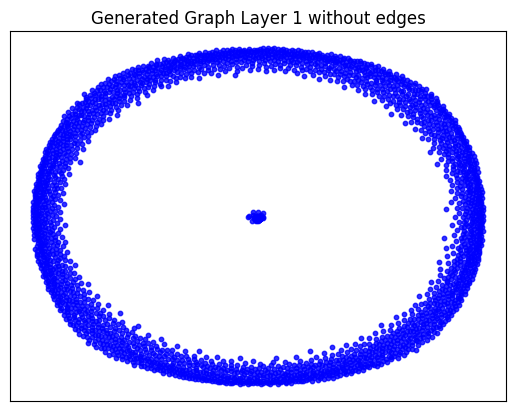

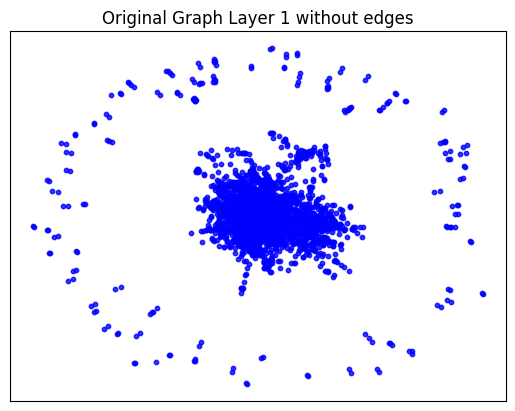

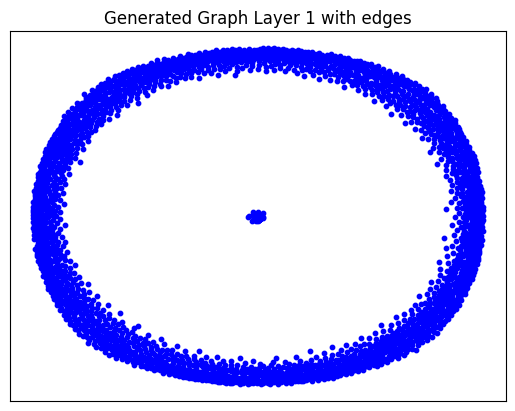

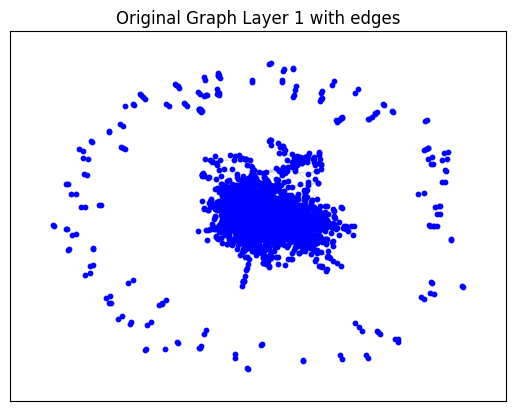

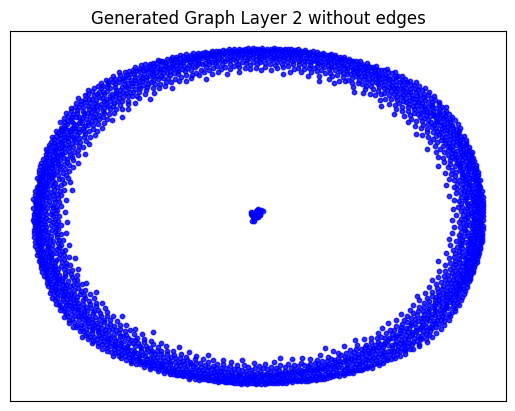

...

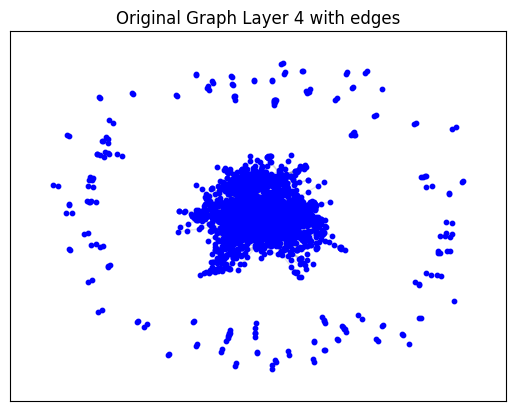

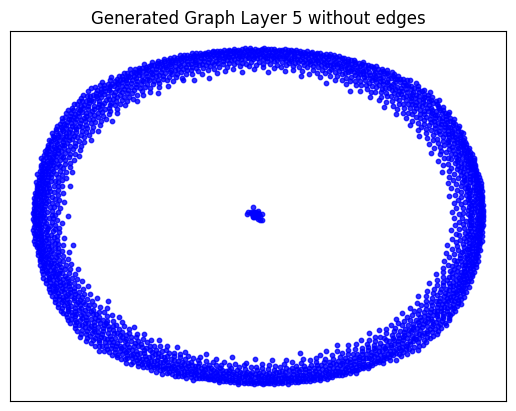

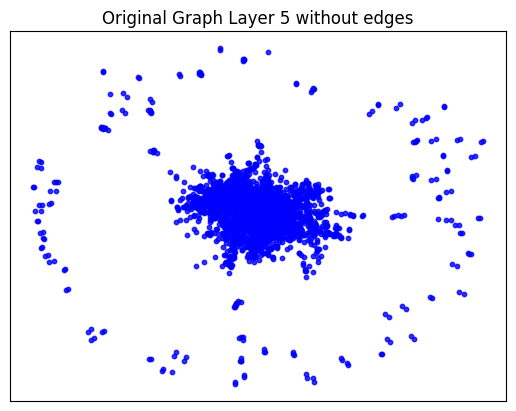

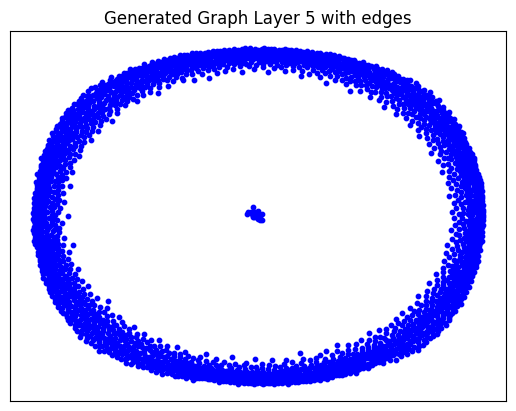

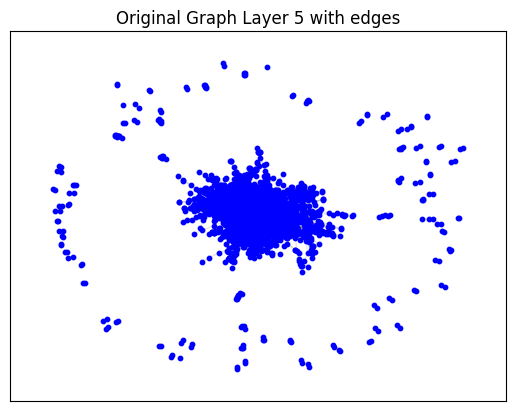

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_cora.
Flag learning_rate not found. Continuing...
Flag epochs not found. Continuing...
Flag hidden1 not found. Continuing...
Flag hidden2 not found. Continuing...
Flag weight_decay not found. Continuing...
Flag dropout not found. Continuing...
Flag filename not found. Continuing...
Flag model not found. Continuing...
Flag dataset not found. Continuing...
Flag features not found. Continuing...
Flag f not found. Continuing...


Instructions for updating:
targets is deprecated, use labels instead


Epoch 0 - Cost: 1.7270079851150513, Accuracy: 0.5003848075866699
Epoch 1 - Cost: 1.6673824787139893, Accuracy: 0.5003106594085693
Epoch 2 - Cost: 1.703734278678894, Accuracy: 0.499184250831604
Epoch 3 - Cost: 1.651028037071228, Accuracy: 0.4997924566268921
Epoch 4 - Cost: 1.6362643241882324, Accuracy: 0.4998202621936798
Epoch 5 - Cost: 1.6273707151412964, Accuracy: 0.4982621669769287
Epoch 6 - Cost: 1.5421111583709717, Accuracy: 0.4973970651626587
Epoch 7 - Cost: 1.5058460235595703, Accuracy: 0.4969560503959656
Epoch 8 - Cost: 1.5096168518066406, Accuracy: 0.49715596437454224
Epoch 9 - Cost: 1.4178839921951294, Accuracy: 0.49584659934043884
Epoch 10 - Cost: 1.36737060546875, Accuracy: 0.4926943778991699
Epoch 11 - Cost: 1.3065855503082275, Accuracy: 0.4880874454975128
Epoch 12 - Cost: 1.2441673278808594, Accuracy: 0.4829314649105072
Epoch 13 - Cost: 1.1872886419296265, Accuracy: 0.47850778698921204
Epoch 14 - Cost: 1.118382453918457, Accuracy: 0.46905824542045593
Epoch 15 - Cost: 1.069

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.11853671073913574 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 289, 'd_min': 0, 'd': 1.792466765140325, 'LCC': 1142, 'wedge_count': 118295.0, 'claw_count': 6709231.0, 'triangle_count': 2322, 'power_law_exp': 2.5276693391877156, 'gini': 0.8405682258734972, 'rel_edge_distr_entropy': 0.748817289479305, 'assortativity': -0.33919061313270105, 'clustering_coefficient': 0.0010382710030404378, 'n_components': 1535}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  q = np.asarray(q, dtype=np.float)


KL divergence between original network and the network generated by Music_GAN: 0.14917869431920192
KL divergence between original network and the network generated by Random E-R: 4.968037114904553
KL divergence between original network and the network generated by Random B-A: 0.7955981807920721
KL divergence between original network and the network generated by GAE: 0.9166855723127746
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 0.44352991508909106
KL divergence between original network and the network generated by Random E-R: 1.2063800479605542
KL divergence between original network and the network generated by Random B-A: 0.9452220155379057
KL divergence between original network and the network generated by GAE: 0.22318213799062217


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

**PubMed Simulation:** <br>
The file taken from here: https://github.com/chennnM/GCNII/blob/master/data/ind.pubmed.graph <br>
Training MiscGan with the integrate G-Unets that trained with PROTEINS
<br>
We will split the dataset because of the limitation of GPU.

First batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_1.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_1'
args.filename = 'pubmed_1_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_1'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.5018
Epoch: [ 2] time: 7.5525
Epoch: [ 3] time: 7.6035
Epoch: [ 4] time: 7.6570
Epoch: [ 5] time: 7.7089
Epoch: [ 6] time: 7.7568
Epoch: [ 7] time: 7.8086
Epoch: [ 8] time: 7.8597
Epoch: [ 9] time: 7.9067
Epoch: [10] time: 7.9572
Epoch: [11] time: 8.0045
Epoch: [12] time: 8.0545
Epoch: [13] time: 8.1075
Epoch: [14] time: 8.1578
Epoch: [15] time: 8.2103
Epoch: [16] time: 8.2598
Epoch: [17] time: 8.3116
Epoch: [18] time: 8.3645
Epoch: [19] time: 8.4121
Epoch: [20] time: 8.4659
Epoch: [21] time: 8.5132
Epoch: [22] time: 8.5610
Epoch: [23] time: 8.6139
Epoch: [24] time: 8.6678
Epoch: [25] time: 8.7154
Epoch: [26] time: 8.7684
Epoch: [27] time: 8.8202
Epoch: [28] time: 8.8750
Epoch: [29] time: 8.9230
Epoch: [30] time: 8.9754
Epoch: [31] time: 9.0261
Epoch: [32] time: 9.0810
Epoch: [33] time: 9.1306
Epoch: [34] time: 9.1796
Epoch: [35] time: 9.2337
Epoch: [36] time: 9.2896
Epoch: [37] time: 9.3437
Epoch: [38] time: 9.3956
Epoch: [39] time: 9.4475

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6706, 6706])
Shape of feature_tensor before unpooling: torch.Size([6706, 64])
Shapes in down_outs: [torch.Size([6706, 64]), torch.Size([5364, 64]), torch.Size([3218, 64])]
Shapes in indices_list: [torch.Size([5364]), torch.Size([3218]), torch.Size([1287])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6706, 64])
Shape of indices_list[0]: torch.Size([5364])
Shape of new_h before assignment: torch.Size([6706, 64])
Shape of h_subset: torch.Size([5364, 64])
Shape of idx: torch.Size([5364])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5364, 64])
Shape of indices_list[1]: torch.Size([3218])
Shape of new_h before assignment: torch.Size([6706, 64])
Shape of h_subset: torch.Size([3218, 64])
Shape of idx: torch.Size([3218])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([3218, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.03337407112121582 seconds to compute statistics_degrees ---
--- 1.610499382019043 seconds to compute statistics_LCC ---
--- 0.04535365104675293 seconds to compute statistics_wedge_count ---
--- 0.0464787483215332 seconds to compute statistics_claw_count ---
--- 0.27268457412719727 seconds to compute statistics_triangle_count ---
--- 0.03528261184692383 seconds to compute statistics_power_law_alpha ---
--- 0.03499603271484375 seconds to compute statistics_gini ---
--- 0.17114710807800293 seconds to compute statistics_edge_distribution_entropy ---
--- 0.06012845039367676 seconds to compute degree_assortativity_coefficient ---
--- 0.8532960414886475 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 125, 'd_min': 1, 'd': 2.3755406413124533, 'LCC': 5620, 'wedge_count': 72247.0, 'claw_count': 926637.0, 'triangle_count': 239, 'power_law_exp': 3.2411099164062187, 'gini': 0.4

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.06994366645812988 seconds to compute degree_assortativity_coefficient ---
--- 0.676173210144043 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 153, 'd_min': 0, 'd': 2.375689783743475, 'LCC': 290, 'wedge_count': 531647.0, 'claw_count': 12812900.0, 'triangle_count': 229840, 'power_law_exp': 1.2646796991740346, 'gini': 0.9679308381352394, 'rel_edge_distr_entropy': 0.6260982853859469, 'assortativity': 0.012784699816856718, 'clustering_coefficient': 0.053814515059042056, 'n_components': 6416}
Computing metrics for ER graph
--- 0.03150629997253418 seconds to compute statistics_degrees ---
--- 2.057394504547119 seconds to compute statistics_LCC ---
--- 0.03430581092834473 seconds to compute statistics_wedge_count ---
--- 0.03549623489379883 seconds to compute statistics_claw_count ---
--- 0.4129772186279297 seconds to compute statistics_triangle_count ---
--- 0.03387880325317383 seconds to compute statistic

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.16390633583068848 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07941246032714844 seconds to compute degree_assortativity_coefficient ---
--- 1.026784896850586 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 16.0, 'd_min': 0.0, 'd': 4.751081282624907, 'LCC': 6644, 'wedge_count': 75485.0, 'claw_count': 118872.0, 'triangle_count': 16, 'power_law_exp': 1.6881121988176335, 'gini': 0.2537637302237399, 'rel_edge_distr_entropy': 0.9875790134620744, 'assortativity': 0.00806970841407886, 'clustering_coefficient': 0.0004037956793862306, 'n_components': 62}
Computing metrics for bara graph
--- 0.03186917304992676 seconds to compute statistics_degrees ---
--- 2.599477529525757 seconds to compute statistics_LCC ---
--- 0.03413844108581543 seconds to compute statistics_wedge_count ---
--- 0.03476119041442871 seconds to compute statistics_claw_count ---
--- 34.534361124038696 seconds to compute st

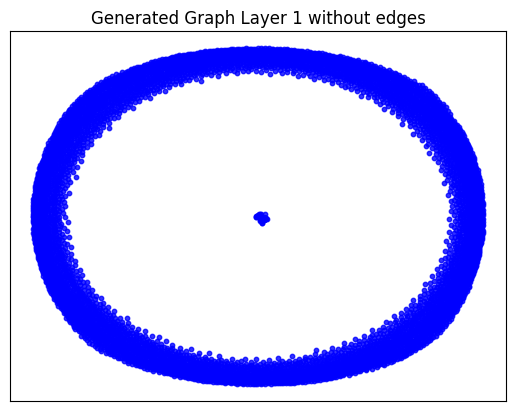

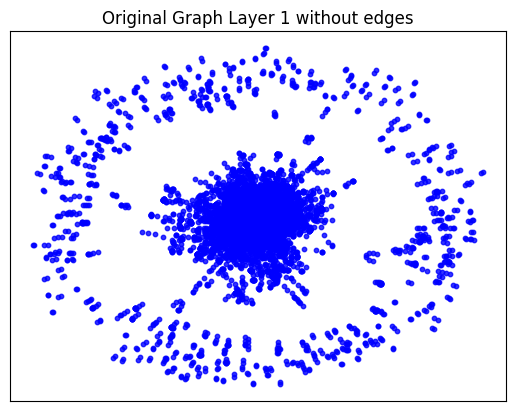

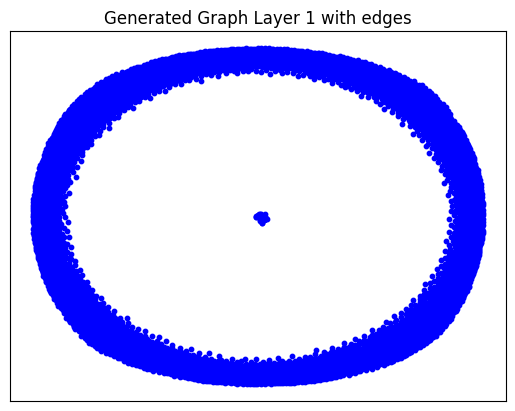

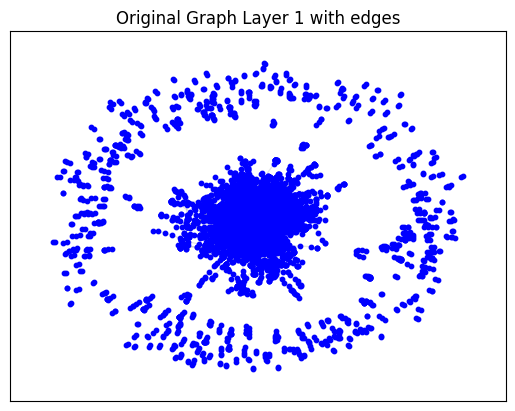

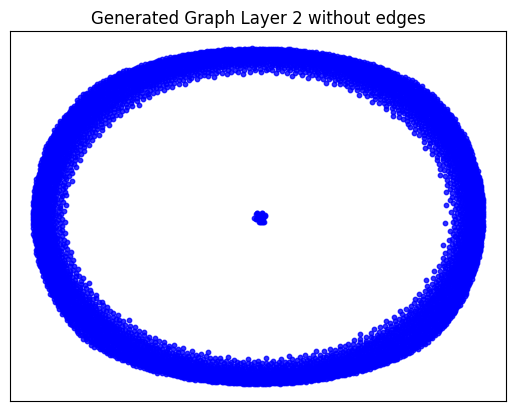

...

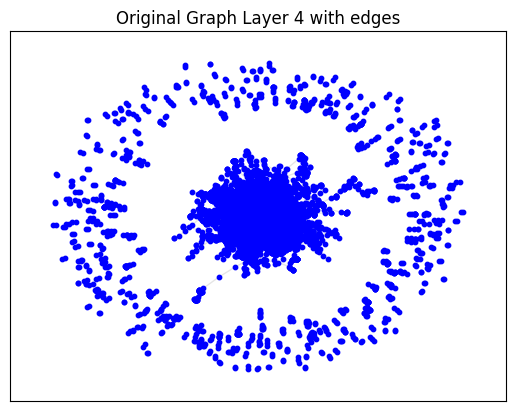

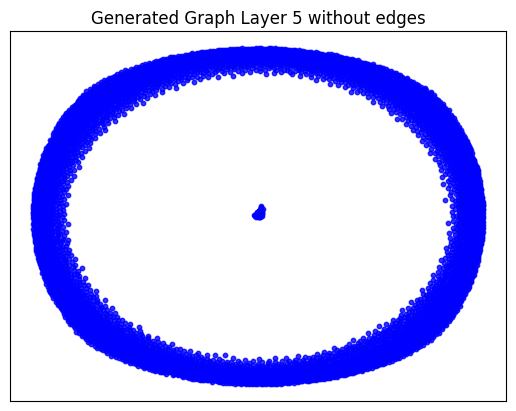

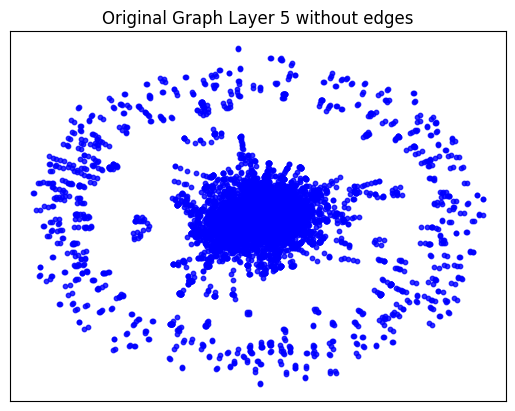

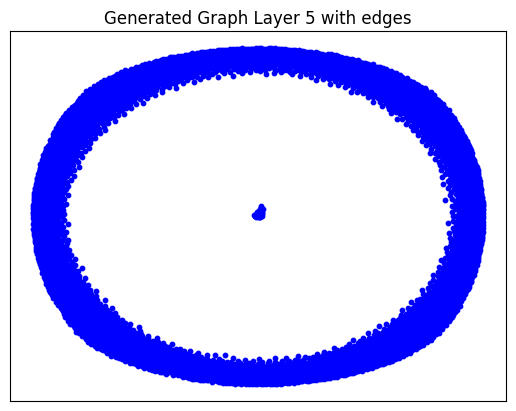

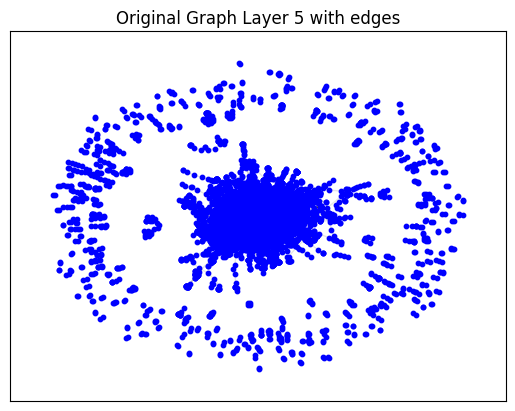

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_1.
Epoch 0 - Cost: 1.7262663841247559, Accuracy: 0.5000088214874268
Epoch 1 - Cost: 1.735199213027954, Accuracy: 0.5000515580177307
Epoch 2 - Cost: 1.7013108730316162, Accuracy: 0.5000661611557007
Epoch 3 - Cost: 1.6903284788131714, Accuracy: 0.49991416931152344
Epoch 4 - Cost: 1.668229103088379, Accuracy: 0.4998038411140442
Epoch 5 - Cost: 1.6333694458007812, Accuracy: 0.4997452199459076
Epoch 6 - Cost: 1.610377550125122, Accuracy: 0.4991648197174072
Epoch 7 - Cost: 1.562536358833313, Accuracy: 0.4991046190261841
Epoch 8 - Cost: 1.5409164428710938, Accuracy: 0.49855566024780273
Epoch 9 - Cost: 1.4911388158798218, Accuracy: 0.49825161695480347
Epoch 10 - Cost: 1.4404690265655518, Accuracy: 0.4956572949886322
Epoch 11 - Cost: 1.3770582675933838, Accuracy: 0.4933832585811615
Epoch 12 - Cost: 1.3371410369873047, Accuracy: 0.4923301637172699
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.17338871955871582 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05224943161010742 seconds to compute degree_assortativity_coefficient ---
--- 0.812730073928833 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 304, 'd_min': 0, 'd': 1.235759021771548, 'LCC': 1558, 'wedge_count': 187640.0, 'claw_count': 9438809.0, 'triangle_count': 7519, 'power_law_exp': 2.3652379863250843, 'gini': 0.9274256485504679, 'rel_edge_distr_entropy': 0.7046422500362458, 'assortativity': -0.2938100626385511, 'clustering_coefficient': 0.0023898142233834798, 'n_components': 5149}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:48: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by it

KL divergence between original network and the network generated by Music_GAN: 0.8813189840372898
KL divergence between original network and the network generated by Random E-R: 6.202309326760571
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.0005928517836313429
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 4.310648055099959
KL divergence between original network and the network generated by Random E-R: 11.935334854273885
KL divergence between original network and the network generated by Random B-A: 1.8744268562753454
KL divergence between original network and the network generated by GAE: 34.39200425079306


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Second batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_2.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_2'
args.filename = 'pubmed_2_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_2'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.8142
Epoch: [ 2] time: 7.8626
Epoch: [ 3] time: 7.9141
Epoch: [ 4] time: 7.9647
Epoch: [ 5] time: 8.0138
Epoch: [ 6] time: 8.0679
Epoch: [ 7] time: 8.1150
Epoch: [ 8] time: 8.1627
Epoch: [ 9] time: 8.2113
Epoch: [10] time: 8.2647
Epoch: [11] time: 8.3153
Epoch: [12] time: 8.3666
Epoch: [13] time: 8.4173
Epoch: [14] time: 8.4638
Epoch: [15] time: 8.5112
Epoch: [16] time: 8.5614
Epoch: [17] time: 8.6121
Epoch: [18] time: 8.6617
Epoch: [19] time: 8.7102
Epoch: [20] time: 8.7612
Epoch: [21] time: 8.8116
Epoch: [22] time: 8.8634
Epoch: [23] time: 8.9111
Epoch: [24] time: 8.9613
Epoch: [25] time: 9.0087
Epoch: [26] time: 9.0560
Epoch: [27] time: 9.1068
Epoch: [28] time: 9.1584
Epoch: [29] time: 9.2080
Epoch: [30] time: 9.2640
Epoch: [31] time: 9.3124
Epoch: [32] time: 9.3622
Epoch: [33] time: 9.4112
Epoch: [34] time: 9.4606
Epoch: [35] time: 9.5099
Epoch: [36] time: 9.5615
Epoch: [37] time: 9.6094
Epoch: [38] time: 9.6576
Epoch: [39] time: 9.7084

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6179, 6179])
Shape of feature_tensor before unpooling: torch.Size([6179, 64])
Shapes in down_outs: [torch.Size([6179, 64]), torch.Size([4943, 64]), torch.Size([2965, 64])]
Shapes in indices_list: [torch.Size([4943]), torch.Size([2965]), torch.Size([1186])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6179, 64])
Shape of indices_list[0]: torch.Size([4943])
Shape of new_h before assignment: torch.Size([6179, 64])
Shape of h_subset: torch.Size([4943, 64])
Shape of idx: torch.Size([4943])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4943, 64])
Shape of indices_list[1]: torch.Size([2965])
Shape of new_h before assignment: torch.Size([6179, 64])
Shape of h_subset: torch.Size([2965, 64])
Shape of idx: torch.Size([2965])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2965, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.026703834533691406 seconds to compute statistics_degrees ---
--- 1.3155601024627686 seconds to compute statistics_LCC ---
--- 0.0381312370300293 seconds to compute statistics_wedge_count ---
--- 0.039125680923461914 seconds to compute statistics_claw_count ---
--- 0.23956584930419922 seconds to compute statistics_triangle_count ---
--- 0.029257774353027344 seconds to compute statistics_power_law_alpha ---
--- 0.02929544448852539 seconds to compute statistics_gini ---
--- 0.14643597602844238 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05655050277709961 seconds to compute degree_assortativity_coefficient ---
--- 0.6619968414306641 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 121, 'd_min': 1, 'd': 2.42667529944966, 'LCC': 5083, 'wedge_count': 68270.0, 'claw_count': 838883.0, 'triangle_count': 315, 'power_law_exp': 3.1452805865076616, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.6193134784698486 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 111, 'd_min': 0, 'd': 2.4268371641307867, 'LCC': 246, 'wedge_count': 487351.0, 'claw_count': 10748815.0, 'triangle_count': 220710, 'power_law_exp': 1.2508746740063859, 'gini': 0.9654116455381778, 'rel_edge_distr_entropy': 0.6237991722896414, 'assortativity': 0.06580113267406724, 'clustering_coefficient': 0.06160027872839936, 'n_components': 5932}
Computing metrics for ER graph
--- 0.026540279388427734 seconds to compute statistics_degrees ---
--- 1.6727941036224365 seconds to compute statistics_LCC ---
--- 0.0299527645111084 seconds to compute statistics_wedge_count ---
--- 0.02978229522705078 seconds to compute statistics_claw_count ---
--- 0.36278796195983887 seconds to compute statistics_triangle_count ---
--- 0.029544830322265625 seconds to compute statistics_power_law_alpha ---
--- 0.029371261596679688 seconds to compute statistics_gi

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07852005958557129 seconds to compute degree_assortativity_coefficient ---
--- 0.8360476493835449 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.85335059889932, 'LCC': 6120, 'wedge_count': 72734.0, 'claw_count': 117419.0, 'triangle_count': 13, 'power_law_exp': 1.6776975175469961, 'gini': 0.2523248829720084, 'rel_edge_distr_entropy': 0.987586132108063, 'assortativity': -0.0006865549263785029, 'clustering_coefficient': 0.00033214386087430486, 'n_components': 58}
Computing metrics for bara graph
--- 0.026711702346801758 seconds to compute statistics_degrees ---
--- 2.1271517276763916 seconds to compute statistics_LCC ---
--- 0.029810428619384766 seconds to compute statistics_wedge_count ---
--- 0.03011298179626465 seconds to compute statistics_claw_count ---
--- 31.795780897140503 seconds to compute statistics_triangle_count ---
--- 0.029236793518066406 seconds to compute stati

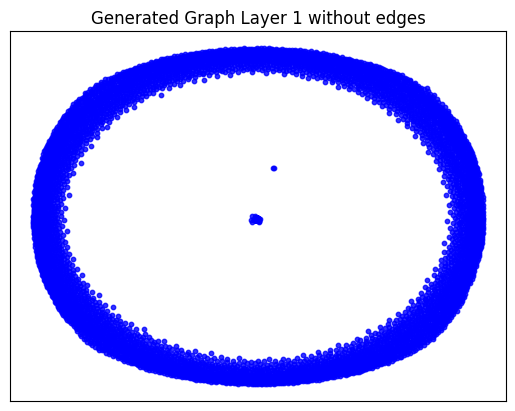

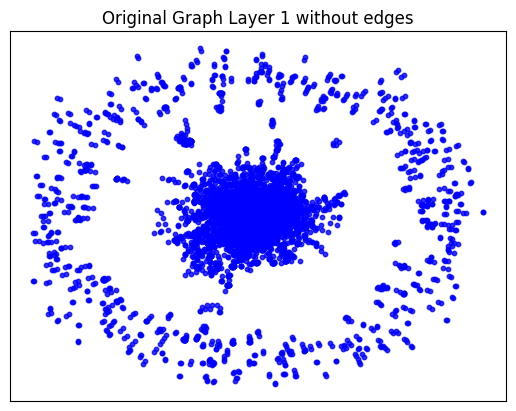

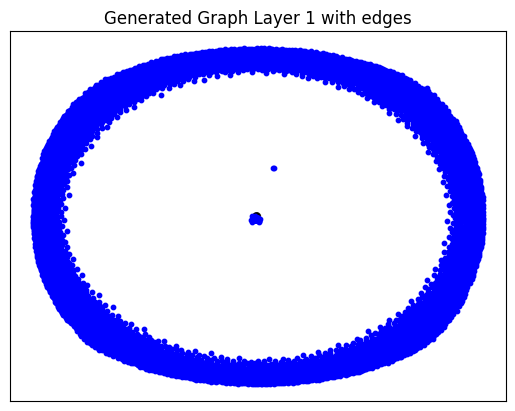

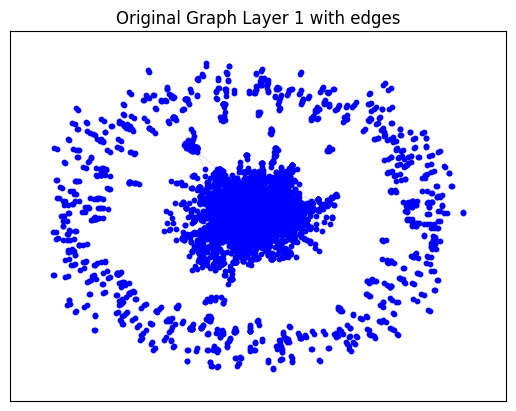

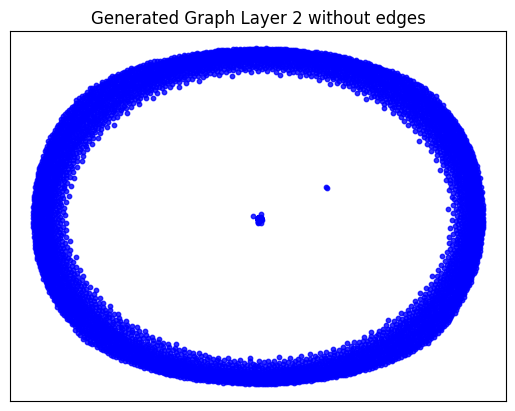

...

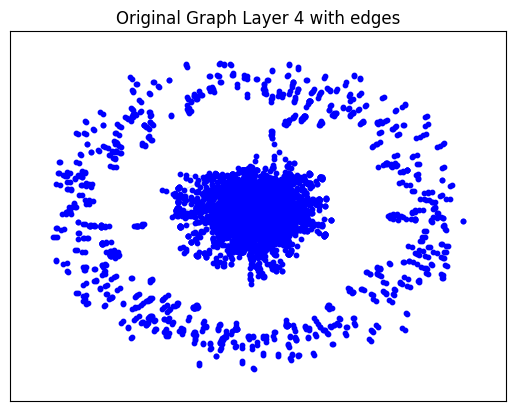

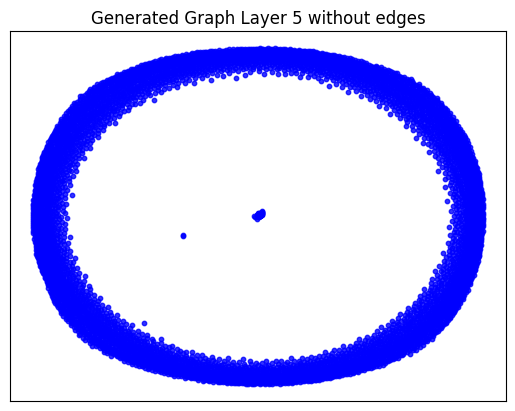

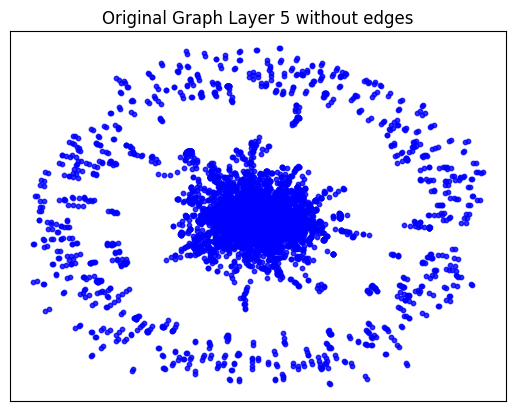

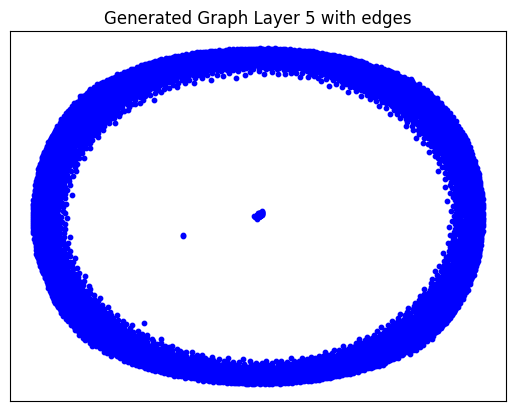

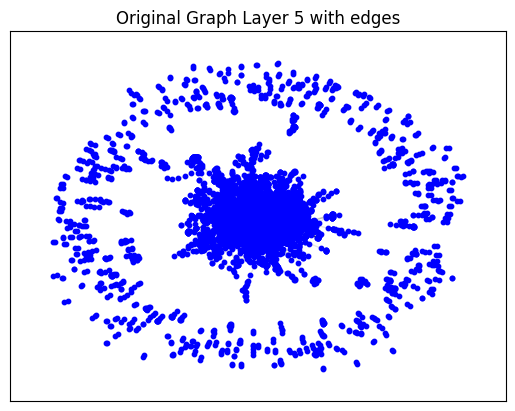

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_2.
Epoch 0 - Cost: 1.7290822267532349, Accuracy: 0.4999121129512787
Epoch 1 - Cost: 1.7161719799041748, Accuracy: 0.5000139474868774
Epoch 2 - Cost: 1.7109497785568237, Accuracy: 0.4998317360877991
Epoch 3 - Cost: 1.6889346837997437, Accuracy: 0.4998938739299774
Epoch 4 - Cost: 1.682690143585205, Accuracy: 0.5002082586288452
Epoch 5 - Cost: 1.6647447347640991, Accuracy: 0.4993826150894165
Epoch 6 - Cost: 1.5901741981506348, Accuracy: 0.49974289536476135
Epoch 7 - Cost: 1.5893670320510864, Accuracy: 0.4992481470108032
Epoch 8 - Cost: 1.5501803159713745, Accuracy: 0.49901729822158813
Epoch 9 - Cost: 1.481706976890564, Accuracy: 0.4986432194709778
Epoch 10 - Cost: 1.4573278427124023, Accuracy: 0.49792948365211487
Epoch 11 - Cost: 1.3977123498916626, Accuracy: 0.4951145052909851
Epoch 12 - Cost: 1.3605769872665405, Accuracy: 0.49279728531837463
Epoch 13 - Cost

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14737558364868164 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04790544509887695 seconds to compute degree_assortativity_coefficient ---
--- 0.6366581916809082 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 192, 'd_min': 0, 'd': 1.2659006311700922, 'LCC': 1476, 'wedge_count': 160122.0, 'claw_count': 5571600.0, 'triangle_count': 8957, 'power_law_exp': 2.4075345971779343, 'gini': 0.9264711608660887, 'rel_edge_distr_entropy': 0.7032780961537349, 'assortativity': -0.3405254986899203, 'clustering_coefficient': 0.004822851604566013, 'n_components': 4702}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.09366602587964788
KL divergence between original network and the network generated by Random E-R: 6.162972863961184
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.33865529590567583
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.8406549815442133
KL divergence between original network and the network generated by Random E-R: 3.2465424698086958
KL divergence between original network and the network generated by Random B-A: 2.086927145498833
KL divergence between original network and the network generated by GAE: 30.511556115735456


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Third batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_3.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_3'
args.filename = 'pubmed_3_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_3'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.5167
Epoch: [ 2] time: 7.5650
Epoch: [ 3] time: 7.6144
Epoch: [ 4] time: 7.6624
Epoch: [ 5] time: 7.7146
Epoch: [ 6] time: 7.7643
Epoch: [ 7] time: 7.8183
Epoch: [ 8] time: 7.8700
Epoch: [ 9] time: 7.9199
Epoch: [10] time: 7.9694
Epoch: [11] time: 8.0190
Epoch: [12] time: 8.0680
Epoch: [13] time: 8.1217
Epoch: [14] time: 8.1695
Epoch: [15] time: 8.2183
Epoch: [16] time: 8.2695
Epoch: [17] time: 8.3178
Epoch: [18] time: 8.3668
Epoch: [19] time: 8.4155
Epoch: [20] time: 8.4654
Epoch: [21] time: 8.5123
Epoch: [22] time: 8.5615
Epoch: [23] time: 8.6132
Epoch: [24] time: 8.6610
Epoch: [25] time: 8.7077
Epoch: [26] time: 8.7556
Epoch: [27] time: 8.8032
Epoch: [28] time: 8.8517
Epoch: [29] time: 8.8995
Epoch: [30] time: 8.9473
Epoch: [31] time: 8.9942
Epoch: [32] time: 9.0424
Epoch: [33] time: 9.0919
Epoch: [34] time: 9.1411
Epoch: [35] time: 9.1926
Epoch: [36] time: 9.2410
Epoch: [37] time: 9.2912
Epoch: [38] time: 9.3446
Epoch: [39] time: 9.3918

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6249, 6249])
Shape of feature_tensor before unpooling: torch.Size([6249, 64])
Shapes in down_outs: [torch.Size([6249, 64]), torch.Size([4999, 64]), torch.Size([2999, 64])]
Shapes in indices_list: [torch.Size([4999]), torch.Size([2999]), torch.Size([1199])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6249, 64])
Shape of indices_list[0]: torch.Size([4999])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([4999, 64])
Shape of idx: torch.Size([4999])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4999, 64])
Shape of indices_list[1]: torch.Size([2999])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([2999, 64])
Shape of idx: torch.Size([2999])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2999, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.028408527374267578 seconds to compute statistics_degrees ---
--- 1.385805368423462 seconds to compute statistics_LCC ---
--- 0.03883838653564453 seconds to compute statistics_wedge_count ---
--- 0.04032754898071289 seconds to compute statistics_claw_count ---
--- 0.24061822891235352 seconds to compute statistics_triangle_count ---
--- 0.030308246612548828 seconds to compute statistics_power_law_alpha ---
--- 0.03050684928894043 seconds to compute statistics_gini ---
--- 0.1502082347869873 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05563926696777344 seconds to compute degree_assortativity_coefficient ---
--- 0.6960506439208984 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 67, 'd_min': 1, 'd': 2.3970870678617158, 'LCC': 5101, 'wedge_count': 61532.0, 'claw_count': 513132.0, 'triangle_count': 269, 'power_law_exp': 3.196356649714029, 'gini': 0.488

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5898962020874023 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 116, 'd_min': 0, 'd': 2.397247119078105, 'LCC': 250, 'wedge_count': 514272.0, 'claw_count': 12736386.0, 'triangle_count': 229371, 'power_law_exp': 1.252484604003416, 'gini': 0.9686236783646318, 'rel_edge_distr_entropy': 0.6204791382295443, 'assortativity': -0.08805322217366991, 'clustering_coefficient': 0.05402733554086693, 'n_components': 5999}
Computing metrics for ER graph
--- 0.0269777774810791 seconds to compute statistics_degrees ---
--- 1.7151973247528076 seconds to compute statistics_LCC ---
--- 0.0294191837310791 seconds to compute statistics_wedge_count ---
--- 0.030387163162231445 seconds to compute statistics_claw_count ---
--- 0.37154245376586914 seconds to compute statistics_triangle_count ---
--- 0.02973461151123047 seconds to compute statistics_power_law_alpha ---
--- 0.028136253356933594 seconds to compute statistics_gin

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.0760338306427002 seconds to compute degree_assortativity_coefficient ---
--- 0.8652064800262451 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 16.0, 'd_min': 0.0, 'd': 4.7941741357234315, 'LCC': 6186, 'wedge_count': 71618.0, 'claw_count': 113237.0, 'triangle_count': 26, 'power_law_exp': 1.6841975318707756, 'gini': 0.2529171597046329, 'rel_edge_distr_entropy': 0.9874861896163146, 'assortativity': 0.0018784799947393278, 'clustering_coefficient': 0.0006888207917906691, 'n_components': 61}
Computing metrics for bara graph
--- 0.027654170989990234 seconds to compute statistics_degrees ---
--- 2.237943172454834 seconds to compute statistics_LCC ---
--- 0.028646469116210938 seconds to compute statistics_wedge_count ---
--- 0.02947235107421875 seconds to compute statistics_claw_count ---
--- 31.832818269729614 seconds to compute statistics_triangle_count ---
--- 0.02850174903869629 seconds to compute statisti

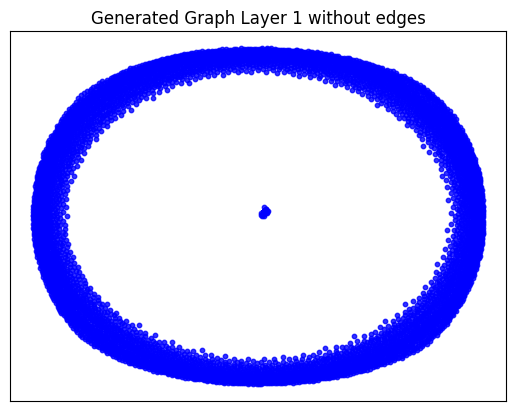

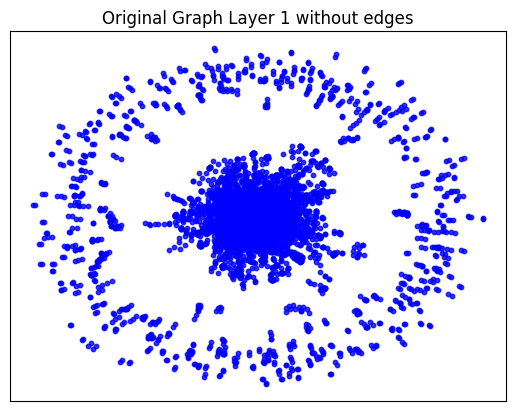

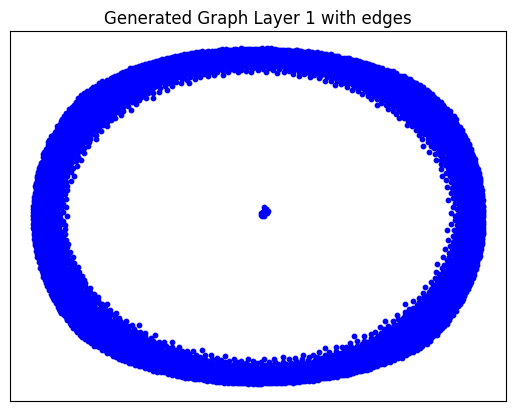

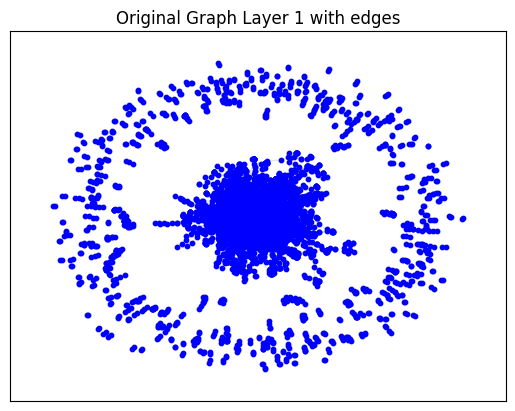

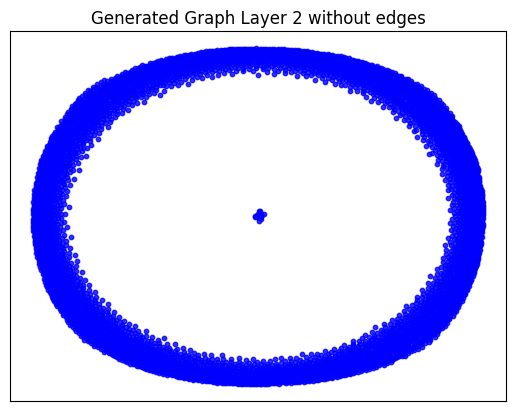

...

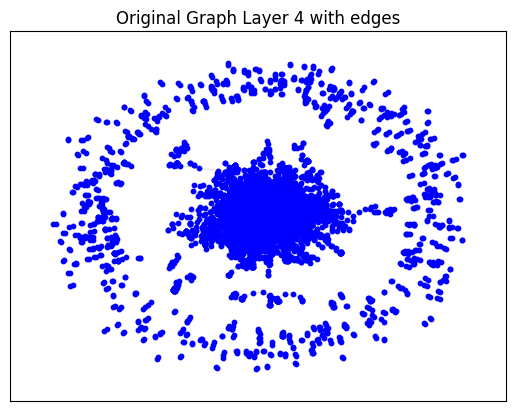

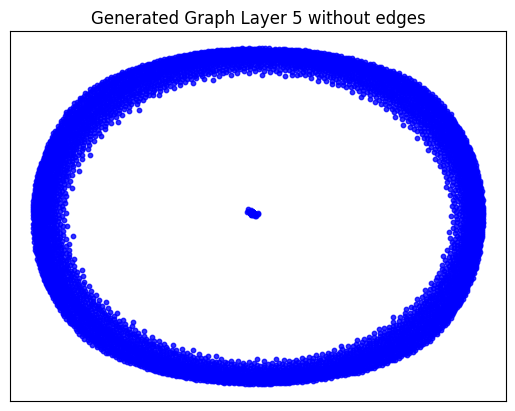

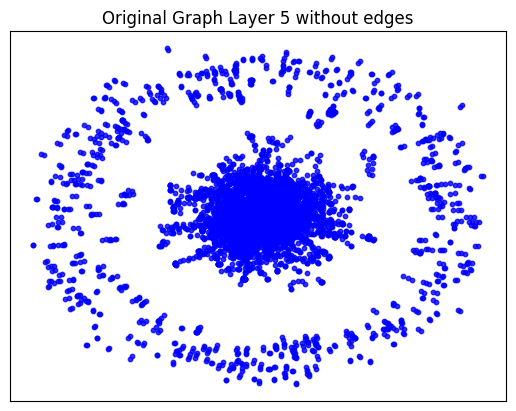

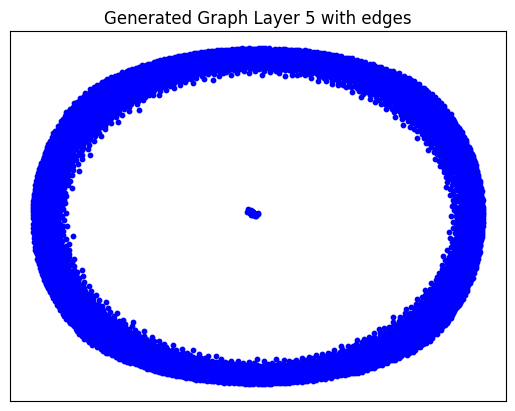

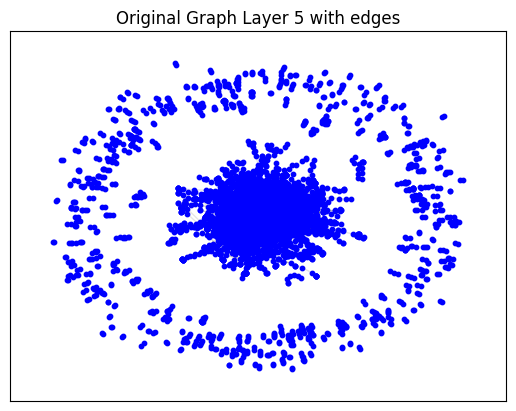

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_3.
Epoch 0 - Cost: 1.7170518636703491, Accuracy: 0.5000376105308533
Epoch 1 - Cost: 1.6936993598937988, Accuracy: 0.49988237023353577
Epoch 2 - Cost: 1.672460913658142, Accuracy: 0.49999886751174927
Epoch 3 - Cost: 1.6517422199249268, Accuracy: 0.49982714653015137
Epoch 4 - Cost: 1.6487959623336792, Accuracy: 0.49961280822753906
Epoch 5 - Cost: 1.5875498056411743, Accuracy: 0.4993285536766052
Epoch 6 - Cost: 1.5449879169464111, Accuracy: 0.4992530047893524
Epoch 7 - Cost: 1.5029869079589844, Accuracy: 0.4988703727722168
Epoch 8 - Cost: 1.4346674680709839, Accuracy: 0.49840256571769714
Epoch 9 - Cost: 1.4060978889465332, Accuracy: 0.49603697657585144
Epoch 10 - Cost: 1.3429341316223145, Accuracy: 0.49442848563194275
Epoch 11 - Cost: 1.2925223112106323, Accuracy: 0.49199047684669495
Epoch 12 - Cost: 1.2306698560714722, Accuracy: 0.48797839879989624
Epoch 13 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1489558219909668 seconds to compute statistics_edge_distribution_entropy ---
--- 0.055255889892578125 seconds to compute degree_assortativity_coefficient ---
--- 0.6630959510803223 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 141, 'd_min': 0, 'd': 1.2473995839334293, 'LCC': 1142, 'wedge_count': 134980.0, 'claw_count': 3129819.0, 'triangle_count': 10300, 'power_law_exp': 2.055009498822898, 'gini': 0.9431690263514645, 'rel_edge_distr_entropy': 0.6911543843414587, 'assortativity': -0.36356221052325, 'clustering_coefficient': 0.009872775390525779, 'n_components': 5107}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.5816158248403506
KL divergence between original network and the network generated by Random E-R: 4.9546001210989425
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.63553387935768
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.4965072645598663
KL divergence between original network and the network generated by Random E-R: 11.249807479294509
KL divergence between original network and the network generated by Random B-A: 1.9135354959506508
KL divergence between original network and the network generated by GAE: 33.83207948098203


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fourth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_4.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_4'
args.filename = 'pubmed_4_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_4'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.9519
Epoch: [ 2] time: 8.0040
Epoch: [ 3] time: 8.0554
Epoch: [ 4] time: 8.1064
Epoch: [ 5] time: 8.1583
Epoch: [ 6] time: 8.2091
Epoch: [ 7] time: 8.2626
Epoch: [ 8] time: 8.3145
Epoch: [ 9] time: 8.3639
Epoch: [10] time: 8.4141
Epoch: [11] time: 8.4667
Epoch: [12] time: 8.5197
Epoch: [13] time: 8.5696
Epoch: [14] time: 8.6218
Epoch: [15] time: 8.6696
Epoch: [16] time: 8.7181
Epoch: [17] time: 8.7658
Epoch: [18] time: 8.8157
Epoch: [19] time: 8.8696
Epoch: [20] time: 8.9179
Epoch: [21] time: 8.9686
Epoch: [22] time: 9.0180
Epoch: [23] time: 9.0753
Epoch: [24] time: 9.1274
Epoch: [25] time: 9.1784
Epoch: [26] time: 9.2282
Epoch: [27] time: 9.2777
Epoch: [28] time: 9.3262
Epoch: [29] time: 9.3749
Epoch: [30] time: 9.4251
Epoch: [31] time: 9.4757
Epoch: [32] time: 9.5241
Epoch: [33] time: 9.5759
Epoch: [34] time: 9.6281
Epoch: [35] time: 9.6794
Epoch: [36] time: 9.7291
Epoch: [37] time: 9.7848
Epoch: [38] time: 9.8354
Epoch: [39] time: 9.8837

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6377, 6377])
Shape of feature_tensor before unpooling: torch.Size([6377, 64])
Shapes in down_outs: [torch.Size([6377, 64]), torch.Size([5101, 64]), torch.Size([3060, 64])]
Shapes in indices_list: [torch.Size([5101]), torch.Size([3060]), torch.Size([1224])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6377, 64])
Shape of indices_list[0]: torch.Size([5101])
Shape of new_h before assignment: torch.Size([6377, 64])
Shape of h_subset: torch.Size([5101, 64])
Shape of idx: torch.Size([5101])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([5101, 64])
Shape of indices_list[1]: torch.Size([3060])
Shape of new_h before assignment: torch.Size([6377, 64])
Shape of h_subset: torch.Size([3060, 64])
Shape of idx: torch.Size([3060])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([3060, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02930140495300293 seconds to compute statistics_degrees ---
--- 1.352961778640747 seconds to compute statistics_LCC ---
--- 0.04068279266357422 seconds to compute statistics_wedge_count ---
--- 0.04188680648803711 seconds to compute statistics_claw_count ---
--- 0.27285218238830566 seconds to compute statistics_triangle_count ---
--- 0.031374454498291016 seconds to compute statistics_power_law_alpha ---
--- 0.036626577377319336 seconds to compute statistics_gini ---
--- 0.15484213829040527 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05877113342285156 seconds to compute degree_assortativity_coefficient ---
--- 0.6776368618011475 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 77, 'd_min': 1, 'd': 2.363393977415307, 'LCC': 5306, 'wedge_count': 62382.0, 'claw_count': 599389.0, 'triangle_count': 226, 'power_law_exp': 3.210872721331903, 'gini': 0.48

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5790901184082031 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 117, 'd_min': 0, 'd': 2.363550815558344, 'LCC': 256, 'wedge_count': 540480.0, 'claw_count': 14483096.0, 'triangle_count': 190691, 'power_law_exp': 1.297653595857506, 'gini': 0.9705412175219117, 'rel_edge_distr_entropy': 0.620844127111137, 'assortativity': -0.1607933720897143, 'clustering_coefficient': 0.039499358424469465, 'n_components': 6065}
Computing metrics for ER graph
--- 0.02928018569946289 seconds to compute statistics_degrees ---
--- 1.750732421875 seconds to compute statistics_LCC ---
--- 0.031549930572509766 seconds to compute statistics_wedge_count ---
--- 0.03249168395996094 seconds to compute statistics_claw_count ---
--- 0.3837893009185791 seconds to compute statistics_triangle_count ---
--- 0.03156757354736328 seconds to compute statistics_power_law_alpha ---
--- 0.031105756759643555 seconds to compute statistics_gini ---

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.15178680419921875 seconds to compute statistics_edge_distribution_entropy ---
--- 0.07579636573791504 seconds to compute degree_assortativity_coefficient ---
--- 0.8679165840148926 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.726787954830614, 'LCC': 6326, 'wedge_count': 70751.0, 'claw_count': 110429.0, 'triangle_count': 18, 'power_law_exp': 1.690190117769795, 'gini': 0.25127426177517354, 'rel_edge_distr_entropy': 0.9877877063839221, 'assortativity': -0.004803647344718735, 'clustering_coefficient': 0.0004890019831747096, 'n_components': 51}
Computing metrics for bara graph
--- 0.029511451721191406 seconds to compute statistics_degrees ---
--- 2.213794708251953 seconds to compute statistics_LCC ---
--- 0.031158447265625 seconds to compute statistics_wedge_count ---
--- 0.03232574462890625 seconds to compute statistics_claw_count ---
--- 32.86446952819824 seconds to compute s

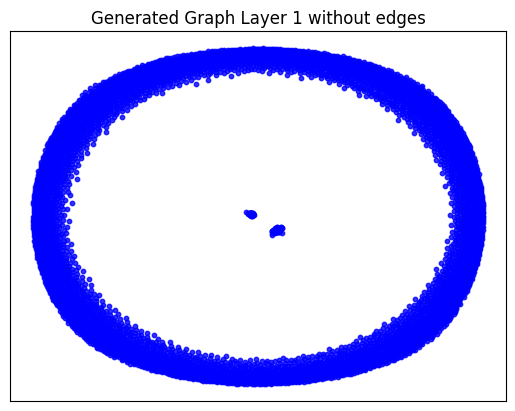

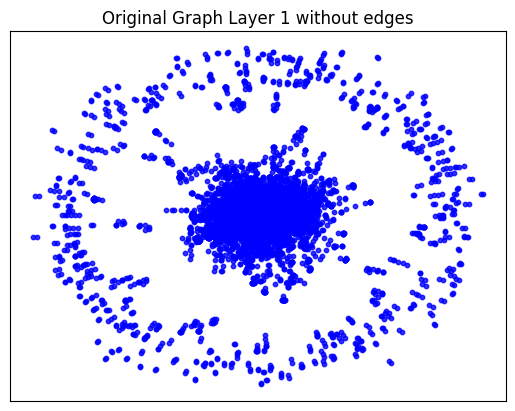

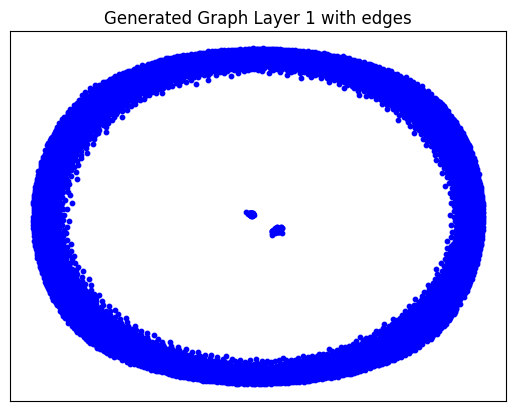

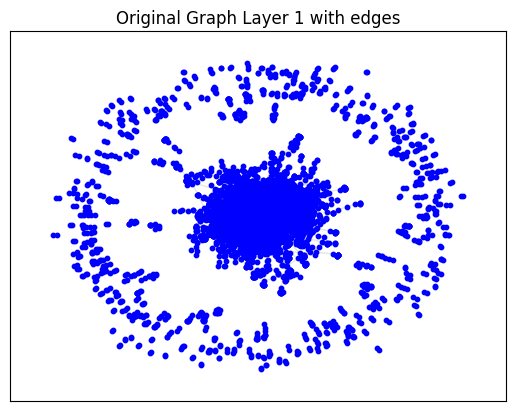

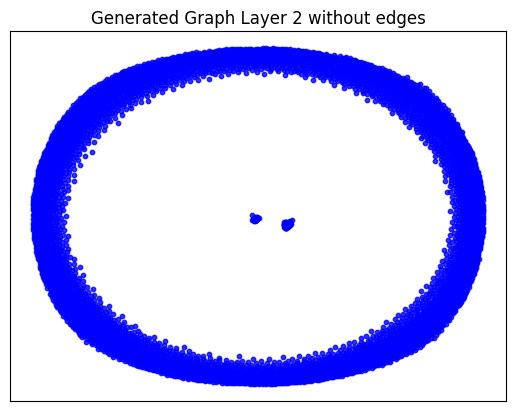

...

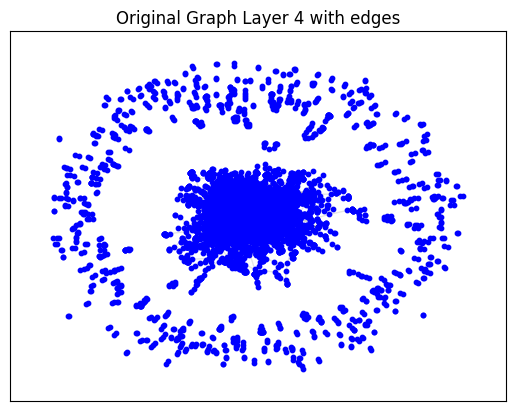

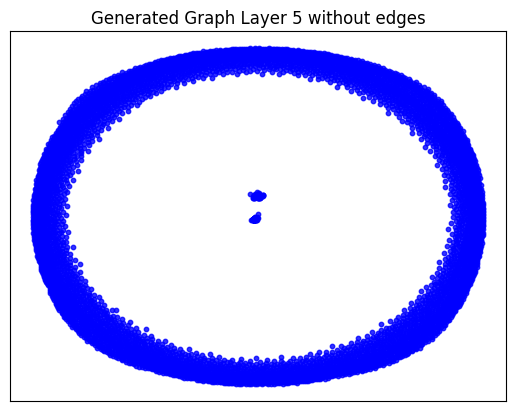

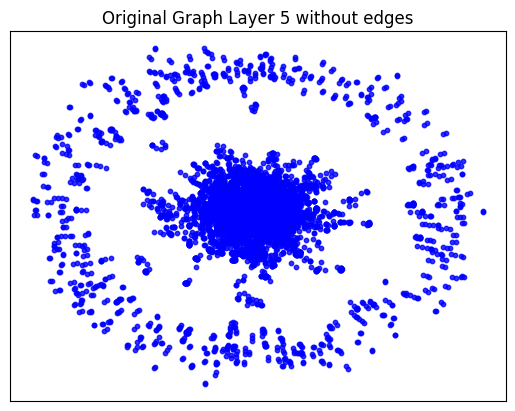

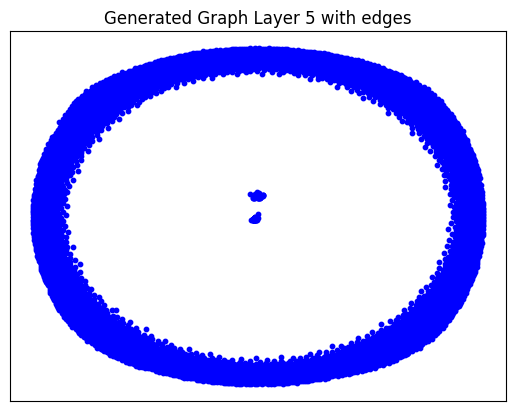

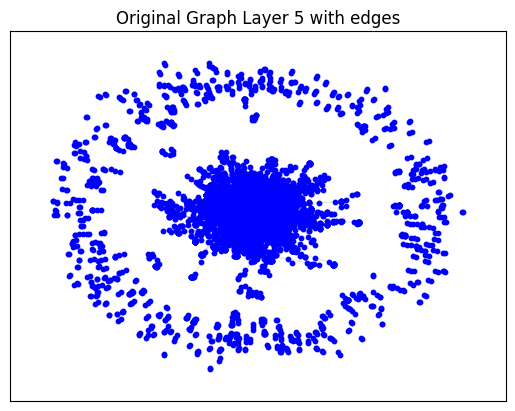

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_4.
Epoch 0 - Cost: 1.7354363203048706, Accuracy: 0.4999779164791107
Epoch 1 - Cost: 1.7319731712341309, Accuracy: 0.4997868537902832
Epoch 2 - Cost: 1.731624960899353, Accuracy: 0.49994590878486633
Epoch 3 - Cost: 1.669319987297058, Accuracy: 0.4996192753314972
Epoch 4 - Cost: 1.6438050270080566, Accuracy: 0.4996334910392761
Epoch 5 - Cost: 1.598020315170288, Accuracy: 0.49938297271728516
Epoch 6 - Cost: 1.611403226852417, Accuracy: 0.49915841221809387
Epoch 7 - Cost: 1.5556962490081787, Accuracy: 0.4987182319164276
Epoch 8 - Cost: 1.5338950157165527, Accuracy: 0.4972475469112396
Epoch 9 - Cost: 1.5159682035446167, Accuracy: 0.495913565158844
Epoch 10 - Cost: 1.431380271911621, Accuracy: 0.4930362105369568
Epoch 11 - Cost: 1.396206021308899, Accuracy: 0.49124521017074585
Epoch 12 - Cost: 1.3235186338424683, Accuracy: 0.48853248357772827
Epoch 13 - Cost: 1.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.1525411605834961 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05005478858947754 seconds to compute degree_assortativity_coefficient ---
--- 0.6637911796569824 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 235, 'd_min': 0, 'd': 1.2280068997961424, 'LCC': 1316, 'wedge_count': 170338.0, 'claw_count': 5876061.0, 'triangle_count': 12995, 'power_law_exp': 2.2612043441806664, 'gini': 0.9383435198728383, 'rel_edge_distr_entropy': 0.6876096073180356, 'assortativity': -0.2934122704543977, 'clustering_coefficient': 0.006634546509983474, 'n_components': 5059}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.2955136177770656
KL divergence between original network and the network generated by Random E-R: 5.299163590800051
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 3.6645857264039736
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.7540191413149173
KL divergence between original network and the network generated by Random E-R: 13.632794237396457
KL divergence between original network and the network generated by Random B-A: 1.9512921172370332
KL divergence between original network and the network generated by GAE: 44.47911948225313


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Fifth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_5.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_5'
args.filename = 'pubmed_5_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_5'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.3979
Epoch: [ 2] time: 7.4463
Epoch: [ 3] time: 7.4945
Epoch: [ 4] time: 7.5432
Epoch: [ 5] time: 7.5946
Epoch: [ 6] time: 7.6449
Epoch: [ 7] time: 7.6923
Epoch: [ 8] time: 7.7417
Epoch: [ 9] time: 7.7896
Epoch: [10] time: 7.8371
Epoch: [11] time: 7.8861
Epoch: [12] time: 7.9364
Epoch: [13] time: 7.9850
Epoch: [14] time: 8.0364
Epoch: [15] time: 8.0862
Epoch: [16] time: 8.1391
Epoch: [17] time: 8.1879
Epoch: [18] time: 8.2356
Epoch: [19] time: 8.2827
Epoch: [20] time: 8.3336
Epoch: [21] time: 8.3831
Epoch: [22] time: 8.4364
Epoch: [23] time: 8.4857
Epoch: [24] time: 8.5364
Epoch: [25] time: 8.5865
Epoch: [26] time: 8.6376
Epoch: [27] time: 8.6888
Epoch: [28] time: 8.7365
Epoch: [29] time: 8.7860
Epoch: [30] time: 8.8345
Epoch: [31] time: 8.8872
Epoch: [32] time: 8.9366
Epoch: [33] time: 8.9850
Epoch: [34] time: 9.0352
Epoch: [35] time: 9.0865
Epoch: [36] time: 9.1355
Epoch: [37] time: 9.1834
Epoch: [38] time: 9.2331
Epoch: [39] time: 9.2821

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6249, 6249])
Shape of feature_tensor before unpooling: torch.Size([6249, 64])
Shapes in down_outs: [torch.Size([6249, 64]), torch.Size([4999, 64]), torch.Size([2999, 64])]
Shapes in indices_list: [torch.Size([4999]), torch.Size([2999]), torch.Size([1199])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6249, 64])
Shape of indices_list[0]: torch.Size([4999])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([4999, 64])
Shape of idx: torch.Size([4999])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4999, 64])
Shape of indices_list[1]: torch.Size([2999])
Shape of new_h before assignment: torch.Size([6249, 64])
Shape of h_subset: torch.Size([2999, 64])
Shape of idx: torch.Size([2999])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2999, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.027534008026123047 seconds to compute statistics_degrees ---
--- 1.3349201679229736 seconds to compute statistics_LCC ---
--- 0.03850913047790527 seconds to compute statistics_wedge_count ---
--- 0.04056811332702637 seconds to compute statistics_claw_count ---
--- 0.23969650268554688 seconds to compute statistics_triangle_count ---
--- 0.030041933059692383 seconds to compute statistics_power_law_alpha ---
--- 0.030403852462768555 seconds to compute statistics_gini ---
--- 0.15039348602294922 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05710577964782715 seconds to compute degree_assortativity_coefficient ---
--- 0.6665031909942627 seconds to compute connected_components ---
--- 9.5367431640625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 72, 'd_min': 1, 'd': 2.399807938540333, 'LCC': 5123, 'wedge_count': 66593.0, 'claw_count': 613491.0, 'triangle_count': 387, 'power_law_exp': 3.2149085473681556, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5704619884490967 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 86, 'd_min': 0, 'd': 2.399967989756722, 'LCC': 328, 'wedge_count': 455907.0, 'claw_count': 9579324.0, 'triangle_count': 207198, 'power_law_exp': 1.2818755148532999, 'gini': 0.9641871554282497, 'rel_edge_distr_entropy': 0.6340838700440008, 'assortativity': 0.3935255290573157, 'clustering_coefficient': 0.06488912996365923, 'n_components': 5921}
Computing metrics for ER graph
--- 0.027587890625 seconds to compute statistics_degrees ---
--- 1.7409865856170654 seconds to compute statistics_LCC ---
--- 0.02990245819091797 seconds to compute statistics_wedge_count ---
--- 0.03033924102783203 seconds to compute statistics_claw_count ---
--- 0.3672811985015869 seconds to compute statistics_triangle_count ---
--- 0.030147314071655273 seconds to compute statistics_power_law_alpha ---
--- 0.028313398361206055 seconds to compute statistics_gini ---
-

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07640981674194336 seconds to compute degree_assortativity_coefficient ---
--- 0.8448889255523682 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 17.0, 'd_min': 0.0, 'd': 4.799615877080666, 'LCC': 6193, 'wedge_count': 72367.0, 'claw_count': 117463.0, 'triangle_count': 18, 'power_law_exp': 1.6852714218306901, 'gini': 0.2565782074673659, 'rel_edge_distr_entropy': 0.9872213064159695, 'assortativity': -0.003310471771170423, 'clustering_coefficient': 0.00045971923073648724, 'n_components': 54}
Computing metrics for bara graph
--- 0.027503013610839844 seconds to compute statistics_degrees ---
--- 2.151257038116455 seconds to compute statistics_LCC ---
--- 0.02980804443359375 seconds to compute statistics_wedge_count ---
--- 0.030362844467163086 seconds to compute statistics_claw_count ---
--- 31.734165906906128 seconds to compute statistics_triangle_count ---
--- 0.030118227005004883 seconds to compute stati

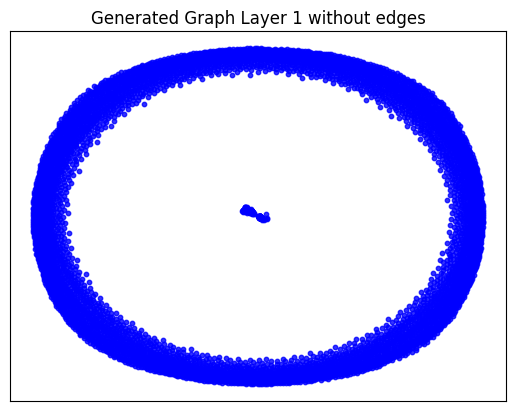

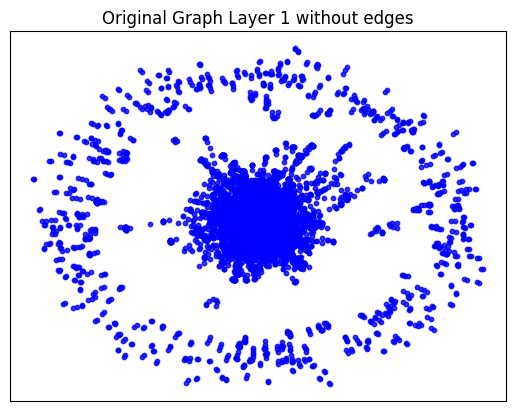

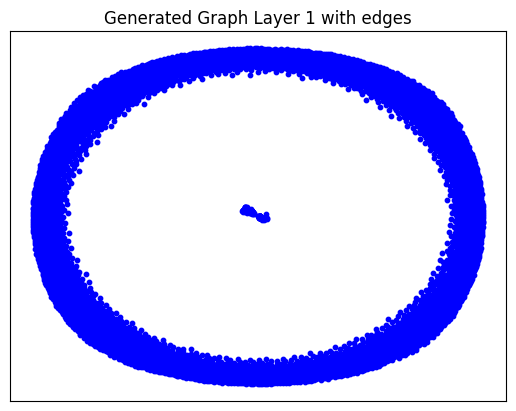

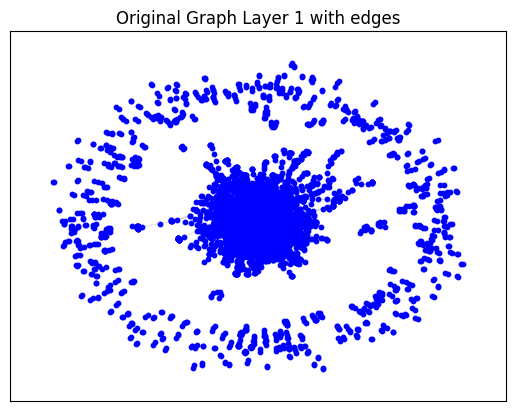

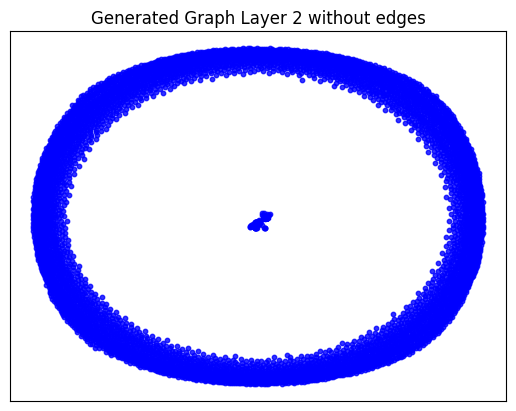

...

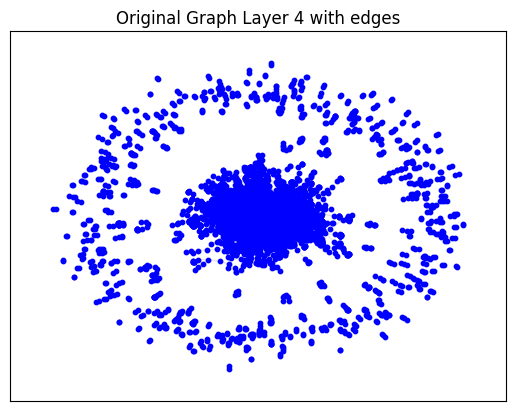

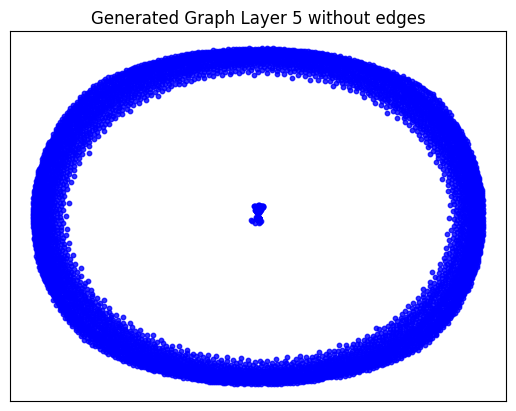

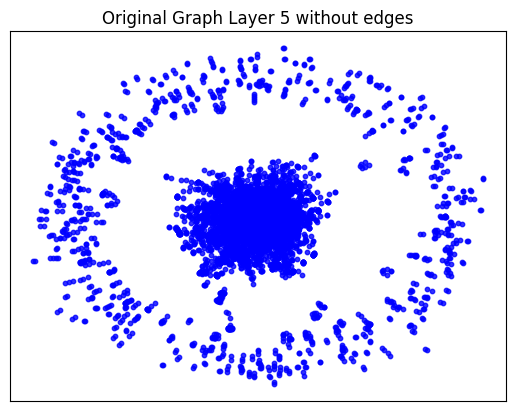

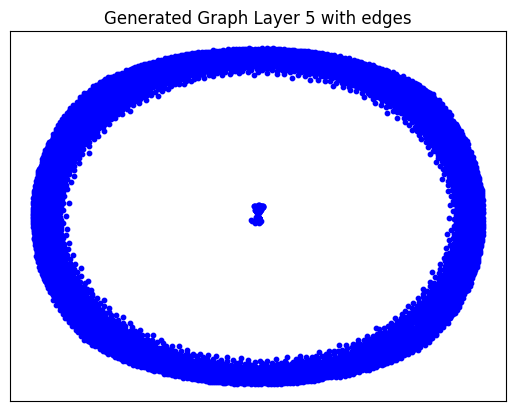

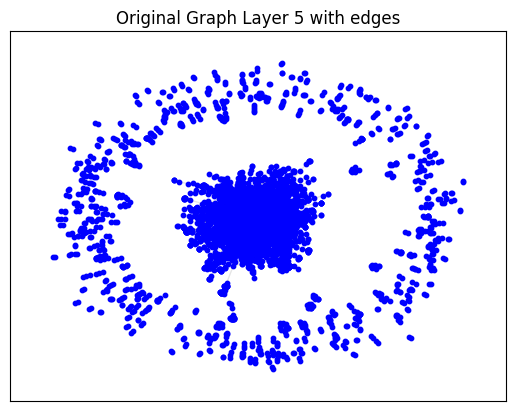

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_5.
Epoch 0 - Cost: 1.7512458562850952, Accuracy: 0.4999723434448242
Epoch 1 - Cost: 1.712989330291748, Accuracy: 0.5000755786895752
Epoch 2 - Cost: 1.7135744094848633, Accuracy: 0.49973264336586
Epoch 3 - Cost: 1.7104542255401611, Accuracy: 0.4999622106552124
Epoch 4 - Cost: 1.7065452337265015, Accuracy: 0.49957573413848877
Epoch 5 - Cost: 1.7012252807617188, Accuracy: 0.49983882904052734
Epoch 6 - Cost: 1.653664469718933, Accuracy: 0.4992108643054962
Epoch 7 - Cost: 1.633922815322876, Accuracy: 0.49934330582618713
Epoch 8 - Cost: 1.5784064531326294, Accuracy: 0.4989224672317505
Epoch 9 - Cost: 1.5811258554458618, Accuracy: 0.4985877573490143
Epoch 10 - Cost: 1.5378464460372925, Accuracy: 0.49724507331848145
Epoch 11 - Cost: 1.4957873821258545, Accuracy: 0.4955075681209564
Epoch 12 - Cost: 1.4409832954406738, Accuracy: 0.4936203360557556
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.14887189865112305 seconds to compute statistics_edge_distribution_entropy ---
--- 0.049254655838012695 seconds to compute degree_assortativity_coefficient ---
--- 0.6502575874328613 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 228, 'd_min': 0, 'd': 1.250760121619459, 'LCC': 1230, 'wedge_count': 171076.0, 'claw_count': 6015159.0, 'triangle_count': 11061, 'power_law_exp': 2.179764567648548, 'gini': 0.9407535502507423, 'rel_edge_distr_entropy': 0.6848806286760956, 'assortativity': -0.33248218985667216, 'clustering_coefficient': 0.005516562405083556, 'n_components': 5017}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.2020837665554531
KL divergence between original network and the network generated by Random E-R: 5.145819634752873
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.757427213871028
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.6763011615066072
KL divergence between original network and the network generated by Random E-R: 9.208071792045752
KL divergence between original network and the network generated by Random B-A: 2.0137867940277383
KL divergence between original network and the network generated by GAE: 31.40898592152471


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Sixth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_6.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_6'
args.filename = 'pubmed_6_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_6'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 6.9099
Epoch: [ 2] time: 6.9588
Epoch: [ 3] time: 7.0055
Epoch: [ 4] time: 7.0570
Epoch: [ 5] time: 7.1059
Epoch: [ 6] time: 7.1542
Epoch: [ 7] time: 7.2009
Epoch: [ 8] time: 7.2504
Epoch: [ 9] time: 7.3007
Epoch: [10] time: 7.3489
Epoch: [11] time: 7.3997
Epoch: [12] time: 7.4515
Epoch: [13] time: 7.4990
Epoch: [14] time: 7.5494
Epoch: [15] time: 7.6020
Epoch: [16] time: 7.6550
Epoch: [17] time: 7.7049
Epoch: [18] time: 7.7561
Epoch: [19] time: 7.8092
Epoch: [20] time: 7.8601
Epoch: [21] time: 7.9075
Epoch: [22] time: 7.9587
Epoch: [23] time: 8.0091
Epoch: [24] time: 8.0602
Epoch: [25] time: 8.1147
Epoch: [26] time: 8.1618
Epoch: [27] time: 8.2105
Epoch: [28] time: 8.2619
Epoch: [29] time: 8.3139
Epoch: [30] time: 8.3652
Epoch: [31] time: 8.4171
Epoch: [32] time: 8.4671
Epoch: [33] time: 8.5169
Epoch: [34] time: 8.5667
Epoch: [35] time: 8.6169
Epoch: [36] time: 8.6715
Epoch: [37] time: 8.7227
Epoch: [38] time: 8.7730
Epoch: [39] time: 8.8253

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6131, 6131])
Shape of feature_tensor before unpooling: torch.Size([6131, 64])
Shapes in down_outs: [torch.Size([6131, 64]), torch.Size([4904, 64]), torch.Size([2942, 64])]
Shapes in indices_list: [torch.Size([4904]), torch.Size([2942]), torch.Size([1176])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6131, 64])
Shape of indices_list[0]: torch.Size([4904])
Shape of new_h before assignment: torch.Size([6131, 64])
Shape of h_subset: torch.Size([4904, 64])
Shape of idx: torch.Size([4904])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4904, 64])
Shape of indices_list[1]: torch.Size([2942])
Shape of new_h before assignment: torch.Size([6131, 64])
Shape of h_subset: torch.Size([2942, 64])
Shape of idx: torch.Size([2942])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2942, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.027087926864624023 seconds to compute statistics_degrees ---
--- 1.2545554637908936 seconds to compute statistics_LCC ---
--- 0.03748679161071777 seconds to compute statistics_wedge_count ---
--- 0.038533687591552734 seconds to compute statistics_claw_count ---
--- 0.2305901050567627 seconds to compute statistics_triangle_count ---
--- 0.028202295303344727 seconds to compute statistics_power_law_alpha ---
--- 0.02831125259399414 seconds to compute statistics_gini ---
--- 0.1425924301147461 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05649447441101074 seconds to compute degree_assortativity_coefficient ---
--- 0.6254322528839111 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 74, 'd_min': 1, 'd': 2.3845024469820553, 'LCC': 5080, 'wedge_count': 62385.0, 'claw_count': 572252.0, 'triangle_count': 276, 'power_law_exp': 3.2183053218669566, 'gini': 0

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5419778823852539 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 162, 'd_min': 0, 'd': 2.3846655791190865, 'LCC': 366, 'wedge_count': 426767.0, 'claw_count': 9858924.0, 'triangle_count': 142923, 'power_law_exp': 1.300237542389351, 'gini': 0.9634342294478393, 'rel_edge_distr_entropy': 0.6456715333007159, 'assortativity': 0.23267984074419926, 'clustering_coefficient': 0.04349044581335651, 'n_components': 5765}
Computing metrics for ER graph
--- 0.02677464485168457 seconds to compute statistics_degrees ---
--- 1.5978176593780518 seconds to compute statistics_LCC ---
--- 0.028531551361083984 seconds to compute statistics_wedge_count ---
--- 0.028934001922607422 seconds to compute statistics_claw_count ---
--- 0.35620784759521484 seconds to compute statistics_triangle_count ---
--- 0.02842855453491211 seconds to compute statistics_power_law_alpha ---
--- 0.028484344482421875 seconds to compute statistics_gi

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07342195510864258 seconds to compute degree_assortativity_coefficient ---
--- 0.7992618083953857 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.7690048939641105, 'LCC': 6078, 'wedge_count': 69822.0, 'claw_count': 111135.0, 'triangle_count': 23, 'power_law_exp': 1.688365384042338, 'gini': 0.25572053412521845, 'rel_edge_distr_entropy': 0.9872430085669525, 'assortativity': 0.0017730793772777879, 'clustering_coefficient': 0.0006208665136995545, 'n_components': 53}
Computing metrics for bara graph
--- 0.02641606330871582 seconds to compute statistics_degrees ---
--- 2.0516741275787354 seconds to compute statistics_LCC ---
--- 0.02858424186706543 seconds to compute statistics_wedge_count ---
--- 0.029351234436035156 seconds to compute statistics_claw_count ---
--- 31.130080938339233 seconds to compute statistics_triangle_count ---
--- 0.0285189151763916 seconds to compute statisti

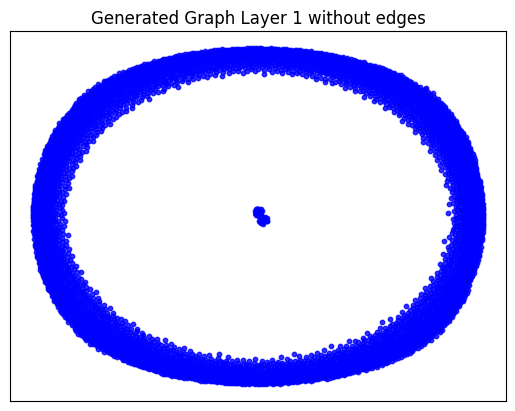

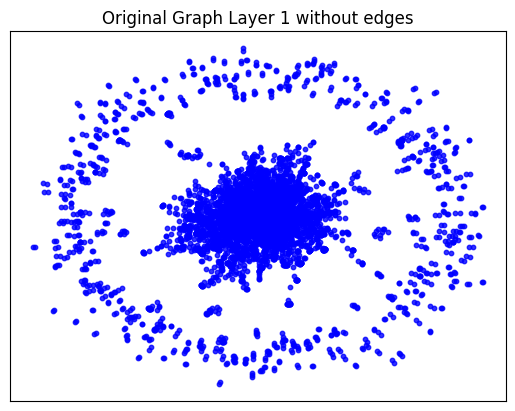

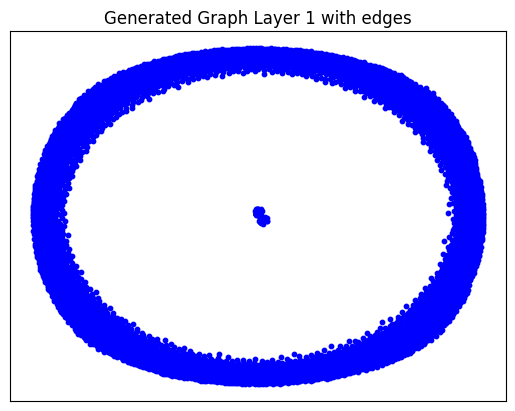

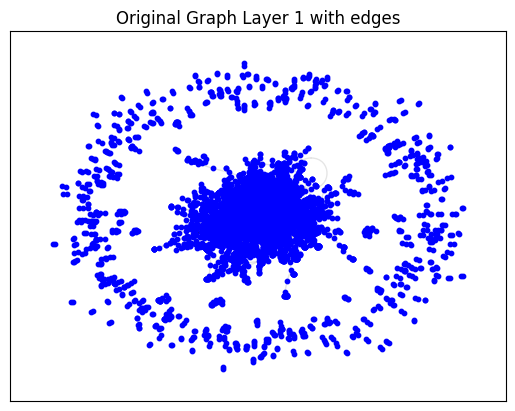

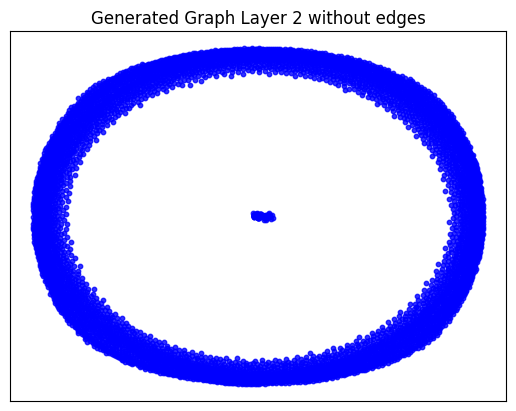

...

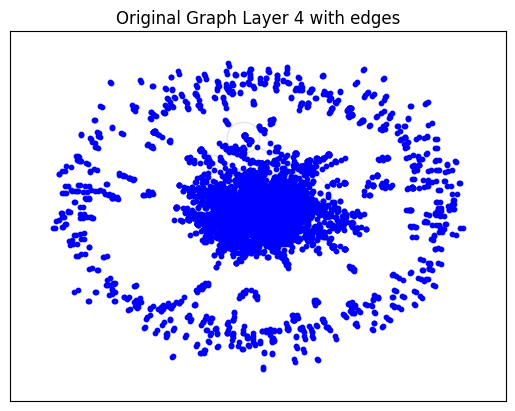

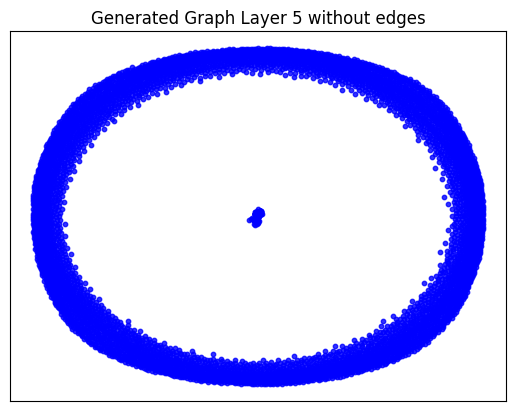

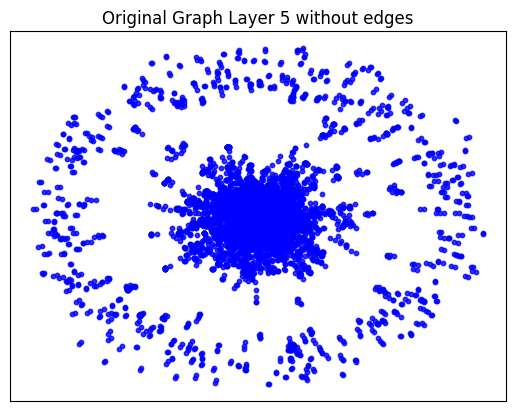

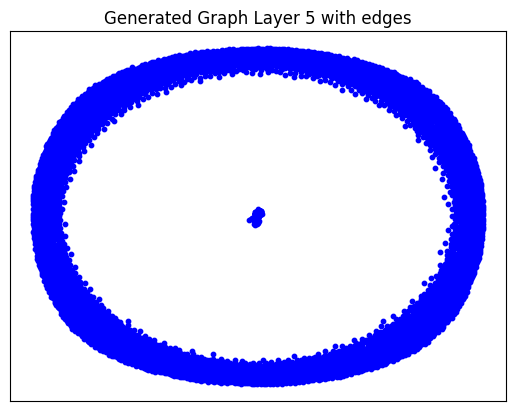

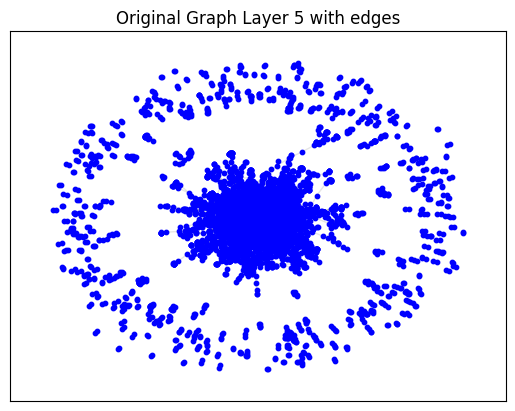

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_6.
Epoch 0 - Cost: 1.7250880002975464, Accuracy: 0.5000801086425781
Epoch 1 - Cost: 1.7406091690063477, Accuracy: 0.4998210072517395
Epoch 2 - Cost: 1.6940444707870483, Accuracy: 0.4999496638774872
Epoch 3 - Cost: 1.7121256589889526, Accuracy: 0.4999637007713318
Epoch 4 - Cost: 1.6346958875656128, Accuracy: 0.4997178018093109
Epoch 5 - Cost: 1.6533701419830322, Accuracy: 0.498832643032074
Epoch 6 - Cost: 1.591604232788086, Accuracy: 0.4989864230155945
Epoch 7 - Cost: 1.5284454822540283, Accuracy: 0.49843743443489075
Epoch 8 - Cost: 1.5414930582046509, Accuracy: 0.4983692169189453
Epoch 9 - Cost: 1.4472146034240723, Accuracy: 0.497207373380661
Epoch 10 - Cost: 1.4151020050048828, Accuracy: 0.4956599175930023
Epoch 11 - Cost: 1.3626612424850464, Accuracy: 0.4940372109413147
Epoch 12 - Cost: 1.3035962581634521, Accuracy: 0.4909239709377289
Epoch 13 - Cost: 1.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04799771308898926 seconds to compute degree_assortativity_coefficient ---
--- 0.6118817329406738 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 226, 'd_min': 0, 'd': 1.2435165552112217, 'LCC': 970, 'wedge_count': 175350.0, 'claw_count': 6322164.0, 'triangle_count': 13118, 'power_law_exp': 1.9106461581899779, 'gini': 0.9499826112048535, 'rel_edge_distr_entropy': 0.6716968426064361, 'assortativity': -0.3137294171559647, 'clustering_coefficient': 0.006224767342321395, 'n_components': 5158}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.39608074417517075
KL divergence between original network and the network generated by Random E-R: 5.582392871190712
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.2885090252486067
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.908621987607848
KL divergence between original network and the network generated by Random E-R: 12.157592672198122
KL divergence between original network and the network generated by Random B-A: 1.9763559396157895
KL divergence between original network and the network generated by GAE: 43.853149002183706


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Seventh batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_7.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_7'
args.filename = 'pubmed_7_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_7'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.9457
Epoch: [ 2] time: 7.9975
Epoch: [ 3] time: 8.0478
Epoch: [ 4] time: 8.0982
Epoch: [ 5] time: 8.1498
Epoch: [ 6] time: 8.1998
Epoch: [ 7] time: 8.2485
Epoch: [ 8] time: 8.3022
Epoch: [ 9] time: 8.3550
Epoch: [10] time: 8.4037
Epoch: [11] time: 8.4567
Epoch: [12] time: 8.5066
Epoch: [13] time: 8.5576
Epoch: [14] time: 8.6093
Epoch: [15] time: 8.6650
Epoch: [16] time: 8.7135
Epoch: [17] time: 8.7653
Epoch: [18] time: 8.8156
Epoch: [19] time: 8.8657
Epoch: [20] time: 8.9145
Epoch: [21] time: 8.9634
Epoch: [22] time: 9.0133
Epoch: [23] time: 9.0631
Epoch: [24] time: 9.1120
Epoch: [25] time: 9.1612
Epoch: [26] time: 9.2120
Epoch: [27] time: 9.2643
Epoch: [28] time: 9.3143
Epoch: [29] time: 9.3669
Epoch: [30] time: 9.4155
Epoch: [31] time: 9.4651
Epoch: [32] time: 9.5144
Epoch: [33] time: 9.5632
Epoch: [34] time: 9.6183
Epoch: [35] time: 9.6678
Epoch: [36] time: 9.7178
Epoch: [37] time: 9.7675
Epoch: [38] time: 9.8166
Epoch: [39] time: 9.8691

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5714, 5714])
Shape of feature_tensor before unpooling: torch.Size([5714, 64])
Shapes in down_outs: [torch.Size([5714, 64]), torch.Size([4571, 64]), torch.Size([2742, 64])]
Shapes in indices_list: [torch.Size([4571]), torch.Size([2742]), torch.Size([1096])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5714, 64])
Shape of indices_list[0]: torch.Size([4571])
Shape of new_h before assignment: torch.Size([5714, 64])
Shape of h_subset: torch.Size([4571, 64])
Shape of idx: torch.Size([4571])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4571, 64])
Shape of indices_list[1]: torch.Size([2742])
Shape of new_h before assignment: torch.Size([5714, 64])
Shape of h_subset: torch.Size([2742, 64])
Shape of idx: torch.Size([2742])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2742, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.024455785751342773 seconds to compute statistics_degrees ---
--- 1.088860034942627 seconds to compute statistics_LCC ---
--- 0.03509855270385742 seconds to compute statistics_wedge_count ---
--- 0.03579068183898926 seconds to compute statistics_claw_count ---
--- 0.2060859203338623 seconds to compute statistics_triangle_count ---
--- 0.026366472244262695 seconds to compute statistics_power_law_alpha ---
--- 0.026606321334838867 seconds to compute statistics_gini ---
--- 0.12569522857666016 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053914785385131836 seconds to compute degree_assortativity_coefficient ---
--- 0.5577208995819092 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 171, 'd_min': 1, 'd': 2.3980395589007526, 'LCC': 4687, 'wedge_count': 90231.0, 'claw_count': 2322979.0, 'triangle_count': 333, 'power_law_exp': 3.265572740743697, 'gini': 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.484130859375 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 88, 'd_min': 0, 'd': 2.398214598284614, 'LCC': 377, 'wedge_count': 345315.0, 'claw_count': 6387628.0, 'triangle_count': 150014, 'power_law_exp': 1.300633047430905, 'gini': 0.9580241350961145, 'rel_edge_distr_entropy': 0.6560247339553679, 'assortativity': 0.470324212782563, 'clustering_coefficient': 0.07045526132705286, 'n_components': 5337}
Computing metrics for ER graph
--- 0.023714303970336914 seconds to compute statistics_degrees ---
--- 1.4454209804534912 seconds to compute statistics_LCC ---
--- 0.025882959365844727 seconds to compute statistics_wedge_count ---
--- 0.02653670310974121 seconds to compute statistics_claw_count ---
--- 0.31711721420288086 seconds to compute statistics_triangle_count ---
--- 0.02565455436706543 seconds to compute statistics_power_law_alpha ---
--- 0.025346040725708008 seconds to compute statistics_gini ---
-

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07060074806213379 seconds to compute degree_assortativity_coefficient ---
--- 0.705298900604248 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.796079117801505, 'LCC': 5662, 'wedge_count': 65860.0, 'claw_count': 105849.0, 'triangle_count': 12, 'power_law_exp': 1.684106174450846, 'gini': 0.25525374961191094, 'rel_edge_distr_entropy': 0.9872375342497559, 'assortativity': -0.005939224572338262, 'clustering_coefficient': 0.00034010713374713037, 'n_components': 52}
Computing metrics for bara graph
--- 0.02323603630065918 seconds to compute statistics_degrees ---
--- 1.8698225021362305 seconds to compute statistics_LCC ---
--- 0.025746822357177734 seconds to compute statistics_wedge_count ---
--- 0.02614760398864746 seconds to compute statistics_claw_count ---
--- 29.36568260192871 seconds to compute statistics_triangle_count ---
--- 0.025791406631469727 seconds to compute statist

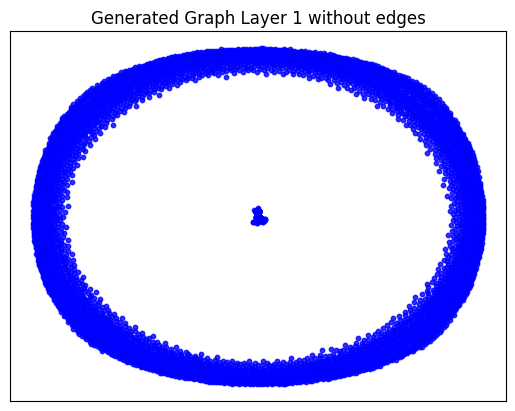

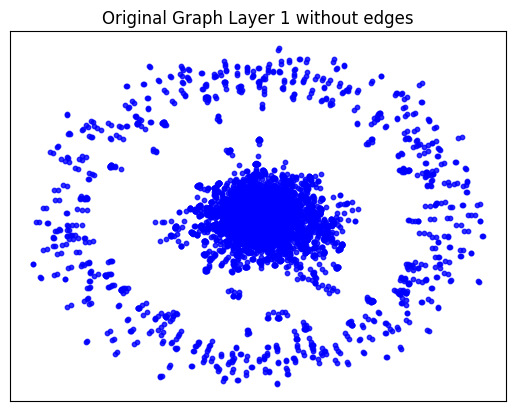

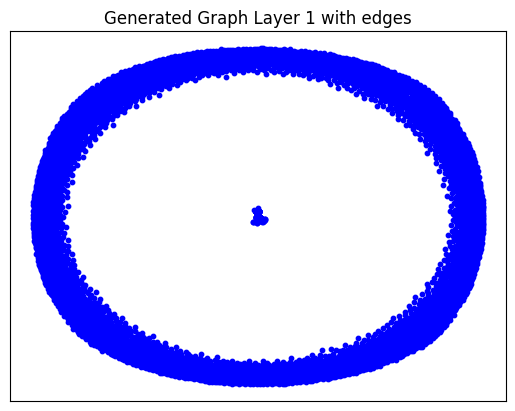

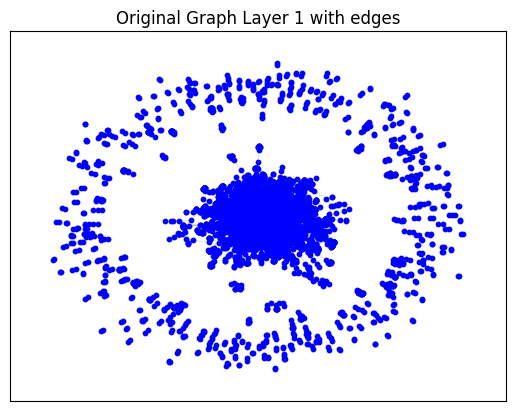

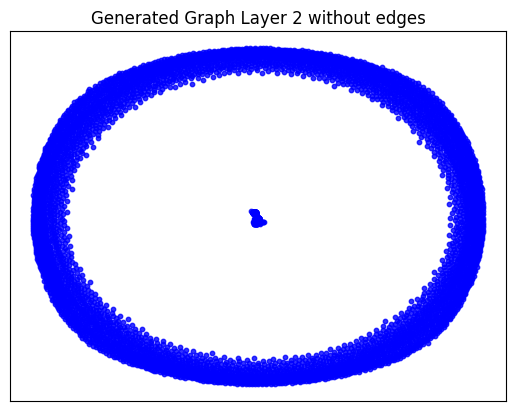

...

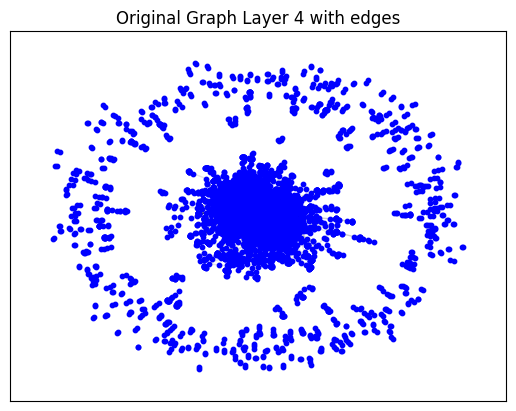

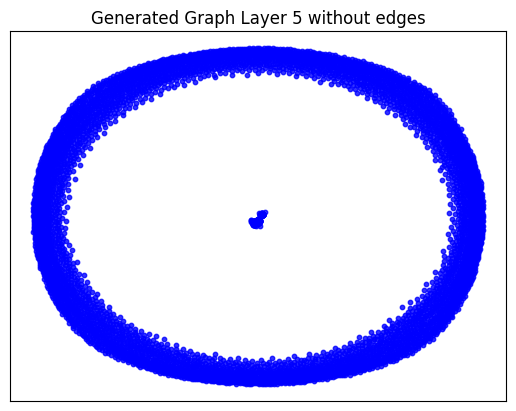

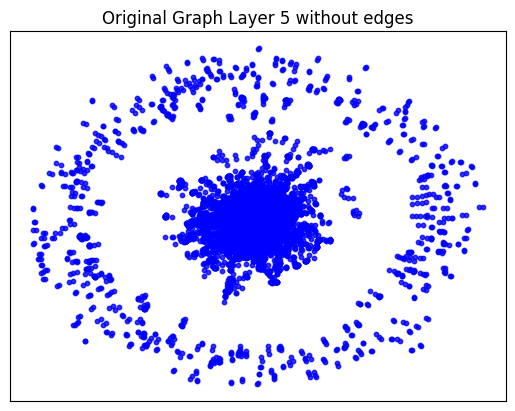

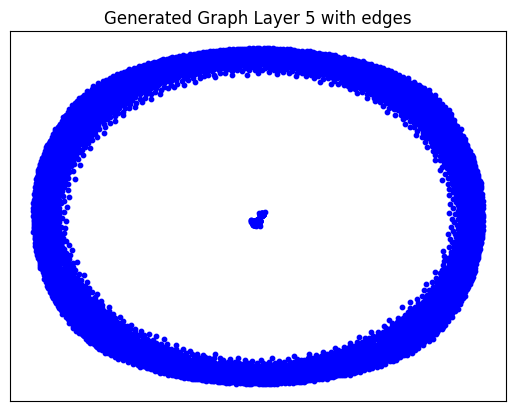

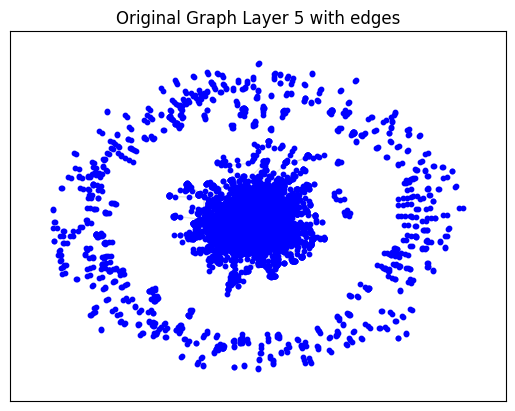

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_7.
Epoch 0 - Cost: 1.7374122142791748, Accuracy: 0.5000725388526917
Epoch 1 - Cost: 1.7092262506484985, Accuracy: 0.5002661347389221
Epoch 2 - Cost: 1.693595051765442, Accuracy: 0.4998331367969513
Epoch 3 - Cost: 1.6762595176696777, Accuracy: 0.499880850315094
Epoch 4 - Cost: 1.6365612745285034, Accuracy: 0.49961984157562256
Epoch 5 - Cost: 1.6693546772003174, Accuracy: 0.49981439113616943
Epoch 6 - Cost: 1.6244800090789795, Accuracy: 0.49923330545425415
Epoch 7 - Cost: 1.5616568326950073, Accuracy: 0.49867093563079834
Epoch 8 - Cost: 1.612501859664917, Accuracy: 0.49873027205467224
Epoch 9 - Cost: 1.4948540925979614, Accuracy: 0.49834144115448
Epoch 10 - Cost: 1.4550755023956299, Accuracy: 0.4976649284362793
Epoch 11 - Cost: 1.4416234493255615, Accuracy: 0.49637529253959656
Epoch 12 - Cost: 1.362585186958313, Accuracy: 0.4952971935272217
Epoch 13 - Cost: 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04478740692138672 seconds to compute degree_assortativity_coefficient ---
--- 0.5388147830963135 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 360, 'd_min': 0, 'd': 1.23871193559678, 'LCC': 1103, 'wedge_count': 247967.0, 'claw_count': 20169349.0, 'triangle_count': 7111, 'power_law_exp': 2.0094311030449346, 'gini': 0.9363771240271537, 'rel_edge_distr_entropy': 0.6763189716297389, 'assortativity': -0.31990264793172346, 'clustering_coefficient': 0.001057694028696712, 'n_components': 4609}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.9961817377088891
KL divergence between original network and the network generated by Random E-R: 6.18931277252756
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.02021715036643189
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 1.8470022017809136
KL divergence between original network and the network generated by Random E-R: 34.71782123964165
KL divergence between original network and the network generated by Random B-A: 2.0541616112970353
KL divergence between original network and the network generated by GAE: 27.50643497307191


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Eighth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_8.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_8'
args.filename = 'pubmed_8_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_8'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.7985
Epoch: [ 2] time: 7.8500
Epoch: [ 3] time: 7.8974
Epoch: [ 4] time: 7.9441
Epoch: [ 5] time: 7.9946
Epoch: [ 6] time: 8.0449
Epoch: [ 7] time: 8.0955
Epoch: [ 8] time: 8.1464
Epoch: [ 9] time: 8.1972
Epoch: [10] time: 8.2474
Epoch: [11] time: 8.2968
Epoch: [12] time: 8.3469
Epoch: [13] time: 8.3992
Epoch: [14] time: 8.4473
Epoch: [15] time: 8.4947
Epoch: [16] time: 8.5455
Epoch: [17] time: 8.5964
Epoch: [18] time: 8.6483
Epoch: [19] time: 8.6955
Epoch: [20] time: 8.7459
Epoch: [21] time: 8.7923
Epoch: [22] time: 8.8388
Epoch: [23] time: 8.8847
Epoch: [24] time: 8.9300
Epoch: [25] time: 8.9771
Epoch: [26] time: 9.0275
Epoch: [27] time: 9.0765
Epoch: [28] time: 9.1229
Epoch: [29] time: 9.1704
Epoch: [30] time: 9.2183
Epoch: [31] time: 9.2691
Epoch: [32] time: 9.3144
Epoch: [33] time: 9.3620
Epoch: [34] time: 9.4098
Epoch: [35] time: 9.4558
Epoch: [36] time: 9.5012
Epoch: [37] time: 9.5478
Epoch: [38] time: 9.5943
Epoch: [39] time: 9.6400

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6066, 6066])
Shape of feature_tensor before unpooling: torch.Size([6066, 64])
Shapes in down_outs: [torch.Size([6066, 64]), torch.Size([4852, 64]), torch.Size([2911, 64])]
Shapes in indices_list: [torch.Size([4852]), torch.Size([2911]), torch.Size([1164])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6066, 64])
Shape of indices_list[0]: torch.Size([4852])
Shape of new_h before assignment: torch.Size([6066, 64])
Shape of h_subset: torch.Size([4852, 64])
Shape of idx: torch.Size([4852])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4852, 64])
Shape of indices_list[1]: torch.Size([2911])
Shape of new_h before assignment: torch.Size([6066, 64])
Shape of h_subset: torch.Size([2911, 64])
Shape of idx: torch.Size([2911])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2911, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.02832651138305664 seconds to compute statistics_degrees ---
--- 1.2362160682678223 seconds to compute statistics_LCC ---
--- 0.03919243812561035 seconds to compute statistics_wedge_count ---
--- 0.03988242149353027 seconds to compute statistics_claw_count ---
--- 0.22830605506896973 seconds to compute statistics_triangle_count ---
--- 0.03003525733947754 seconds to compute statistics_power_law_alpha ---
--- 0.030157089233398438 seconds to compute statistics_gini ---
--- 0.1444704532623291 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05462241172790527 seconds to compute degree_assortativity_coefficient ---
--- 0.6240692138671875 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 130, 'd_min': 1, 'd': 2.2667765869744434, 'LCC': 4731, 'wedge_count': 57302.0, 'claw_count': 741223.0, 'triangle_count': 244, 'power_law_exp': 3.352070470682542, 'gini': 0.4

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5155680179595947 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 91, 'd_min': 0, 'd': 2.266941467436109, 'LCC': 240, 'wedge_count': 405845.0, 'claw_count': 8545330.0, 'triangle_count': 172715, 'power_law_exp': 1.3058851400033518, 'gini': 0.9657664438100184, 'rel_edge_distr_entropy': 0.6328689471682558, 'assortativity': 0.455252464525135, 'clustering_coefficient': 0.060634873082724715, 'n_components': 5730}
Computing metrics for ER graph
--- 0.02653050422668457 seconds to compute statistics_degrees ---
--- 1.5730810165405273 seconds to compute statistics_LCC ---
--- 0.029437780380249023 seconds to compute statistics_wedge_count ---
--- 0.028960227966308594 seconds to compute statistics_claw_count ---
--- 0.35014963150024414 seconds to compute statistics_triangle_count ---
--- 0.029180288314819336 seconds to compute statistics_power_law_alpha ---
--- 0.028584957122802734 seconds to compute statistics_gi

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07234001159667969 seconds to compute degree_assortativity_coefficient ---
--- 0.7928352355957031 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 15.0, 'd_min': 0.0, 'd': 4.533553173948887, 'LCC': 6009, 'wedge_count': 62212.0, 'claw_count': 93819.0, 'triangle_count': 14, 'power_law_exp': 1.714381201799037, 'gini': 0.2599069794997988, 'rel_edge_distr_entropy': 0.9868409820107942, 'assortativity': -0.0008159044625830362, 'clustering_coefficient': 0.000447670514501327, 'n_components': 56}
Computing metrics for bara graph
--- 0.0261228084564209 seconds to compute statistics_degrees ---
--- 2.011932849884033 seconds to compute statistics_LCC ---
--- 0.029477357864379883 seconds to compute statistics_wedge_count ---
--- 0.0294497013092041 seconds to compute statistics_claw_count ---
--- 31.466819524765015 seconds to compute statistics_triangle_count ---
--- 0.028888225555419922 seconds to compute statistics_

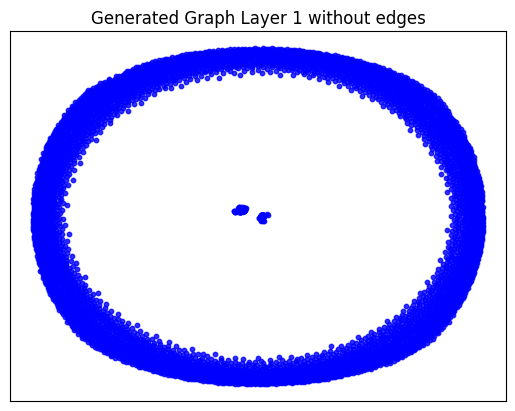

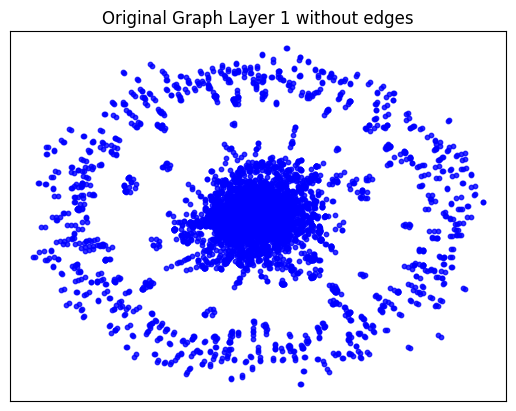

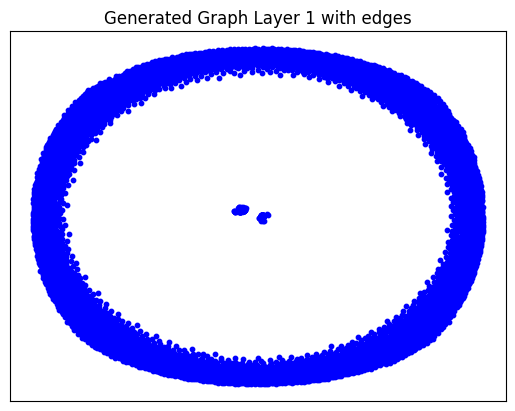

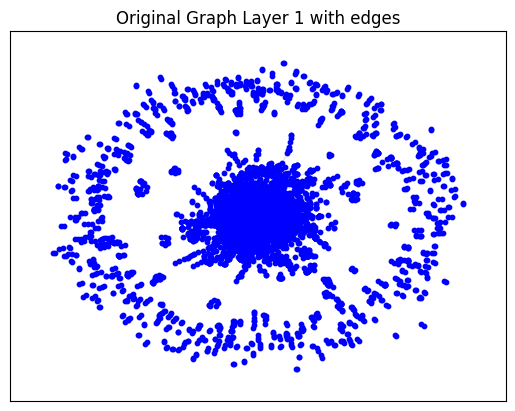

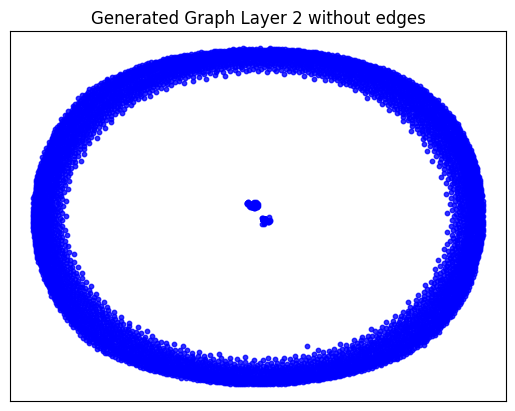

...

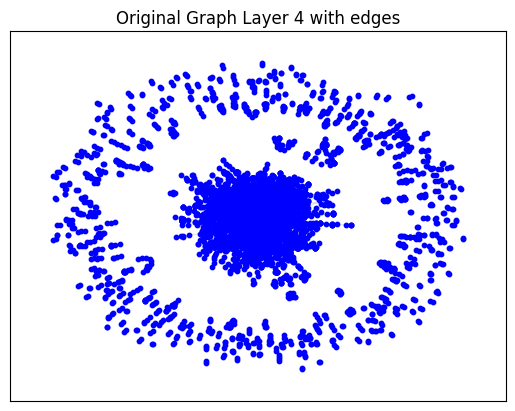

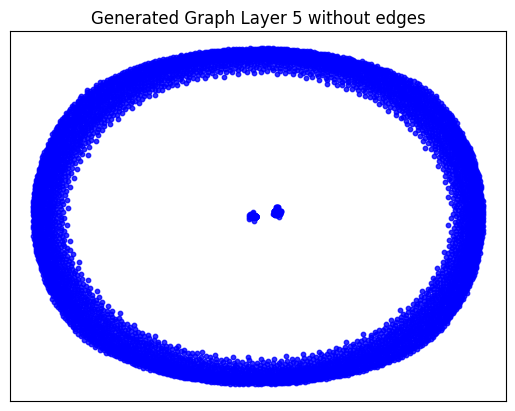

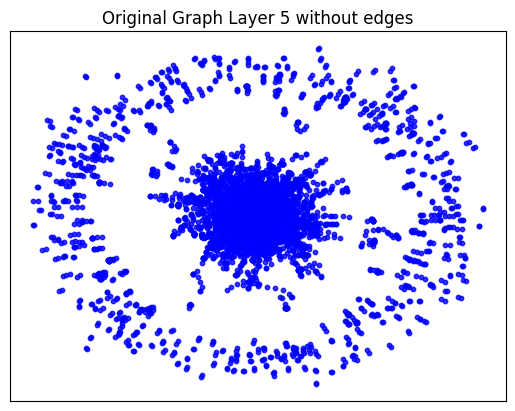

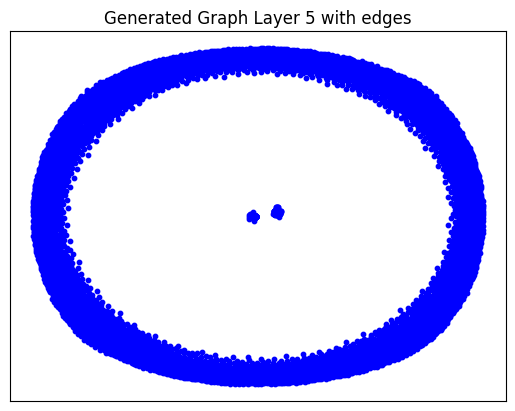

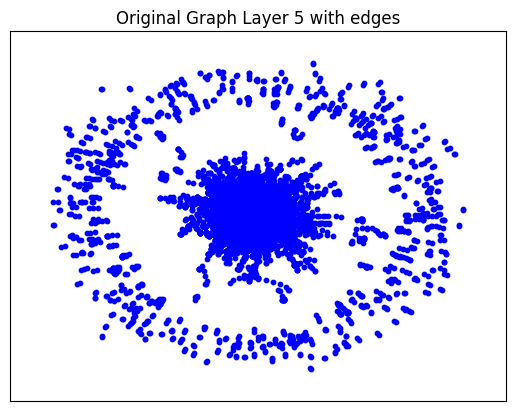

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_8.
Epoch 0 - Cost: 1.7689684629440308, Accuracy: 0.500108540058136
Epoch 1 - Cost: 1.7487863302230835, Accuracy: 0.5002065896987915
Epoch 2 - Cost: 1.6621203422546387, Accuracy: 0.4999896287918091
Epoch 3 - Cost: 1.6489735841751099, Accuracy: 0.5000526905059814
Epoch 4 - Cost: 1.657984972000122, Accuracy: 0.4999297857284546
Epoch 5 - Cost: 1.619850993156433, Accuracy: 0.49981993436813354
Epoch 6 - Cost: 1.587368369102478, Accuracy: 0.49960070848464966
Epoch 7 - Cost: 1.5279251337051392, Accuracy: 0.4997846484184265
Epoch 8 - Cost: 1.5543886423110962, Accuracy: 0.49954408407211304
Epoch 9 - Cost: 1.4972960948944092, Accuracy: 0.49947792291641235
Epoch 10 - Cost: 1.4396204948425293, Accuracy: 0.49921199679374695
Epoch 11 - Cost: 1.412039875984192, Accuracy: 0.4990490972995758
Epoch 12 - Cost: 1.37269926071167, Accuracy: 0.4987555146217346
Epoch 13 - Cost: 1.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04760479927062988 seconds to compute degree_assortativity_coefficient ---
--- 0.6404428482055664 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 262, 'd_min': 0, 'd': 1.1793603692713486, 'LCC': 1342, 'wedge_count': 132444.0, 'claw_count': 5282470.0, 'triangle_count': 5098, 'power_law_exp': 2.235308832693577, 'gini': 0.9258479620456777, 'rel_edge_distr_entropy': 0.7089466990813148, 'assortativity': -0.2762419453018428, 'clustering_coefficient': 0.0028952365086787053, 'n_components': 4718}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 1.6844481320308895
KL divergence between original network and the network generated by Random E-R: 6.678814853632568
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 2.062017982065525e-05
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.6243431158312007
KL divergence between original network and the network generated by Random E-R: 3.004363339429558
KL divergence between original network and the network generated by Random B-A: 1.972881785206499
KL divergence between original network and the network generated by GAE: 34.12759176309896


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

Ninth batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_9.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_9'
args.filename = 'pubmed_9_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_9'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 7.3669
Epoch: [ 2] time: 7.4173
Epoch: [ 3] time: 7.4687
Epoch: [ 4] time: 7.5212
Epoch: [ 5] time: 7.5697
Epoch: [ 6] time: 7.6199
Epoch: [ 7] time: 7.6720
Epoch: [ 8] time: 7.7200
Epoch: [ 9] time: 7.7719
Epoch: [10] time: 7.8248
Epoch: [11] time: 7.8768
Epoch: [12] time: 7.9262
Epoch: [13] time: 7.9765
Epoch: [14] time: 8.0263
Epoch: [15] time: 8.0793
Epoch: [16] time: 8.1293
Epoch: [17] time: 8.1821
Epoch: [18] time: 8.2347
Epoch: [19] time: 8.2829
Epoch: [20] time: 8.3327
Epoch: [21] time: 8.3833
Epoch: [22] time: 8.4346
Epoch: [23] time: 8.4834
Epoch: [24] time: 8.5322
Epoch: [25] time: 8.5791
Epoch: [26] time: 8.6276
Epoch: [27] time: 8.6761
Epoch: [28] time: 8.7247
Epoch: [29] time: 8.7714
Epoch: [30] time: 8.8191
Epoch: [31] time: 8.8682
Epoch: [32] time: 8.9158
Epoch: [33] time: 8.9637
Epoch: [34] time: 9.0147
Epoch: [35] time: 9.0636
Epoch: [36] time: 9.1133
Epoch: [37] time: 9.1618
Epoch: [38] time: 9.2111
Epoch: [39] time: 9.2632

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5936, 5936])
Shape of feature_tensor before unpooling: torch.Size([5936, 64])
Shapes in down_outs: [torch.Size([5936, 64]), torch.Size([4748, 64]), torch.Size([2848, 64])]
Shapes in indices_list: [torch.Size([4748]), torch.Size([2848]), torch.Size([1139])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5936, 64])
Shape of indices_list[0]: torch.Size([4748])
Shape of new_h before assignment: torch.Size([5936, 64])
Shape of h_subset: torch.Size([4748, 64])
Shape of idx: torch.Size([4748])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4748, 64])
Shape of indices_list[1]: torch.Size([2848])
Shape of new_h before assignment: torch.Size([5936, 64])
Shape of h_subset: torch.Size([2848, 64])
Shape of idx: torch.Size([2848])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2848, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.026638507843017578 seconds to compute statistics_degrees ---
--- 1.223139762878418 seconds to compute statistics_LCC ---
--- 0.03613901138305664 seconds to compute statistics_wedge_count ---
--- 0.03748273849487305 seconds to compute statistics_claw_count ---
--- 0.21820974349975586 seconds to compute statistics_triangle_count ---
--- 0.027768850326538086 seconds to compute statistics_power_law_alpha ---
--- 0.028620004653930664 seconds to compute statistics_gini ---
--- 0.13376832008361816 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05576729774475098 seconds to compute degree_assortativity_coefficient ---
--- 0.5852952003479004 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 88, 'd_min': 1, 'd': 2.318786857624263, 'LCC': 4666, 'wedge_count': 62653.0, 'claw_count': 678007.0, 'triangle_count': 255, 'power_law_exp': 3.3236412505818898, 'gini': 0.

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.4768645763397217 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 139, 'd_min': 0, 'd': 2.318955349620893, 'LCC': 226, 'wedge_count': 440014.0, 'claw_count': 9729865.0, 'triangle_count': 223205, 'power_law_exp': 1.2554358122346665, 'gini': 0.9665929817690633, 'rel_edge_distr_entropy': 0.6195258305678659, 'assortativity': -0.11015839893461234, 'clustering_coefficient': 0.06882058486936869, 'n_components': 5693}
Computing metrics for ER graph
--- 0.024860620498657227 seconds to compute statistics_degrees ---
--- 1.4993462562561035 seconds to compute statistics_LCC ---
--- 0.02734851837158203 seconds to compute statistics_wedge_count ---
--- 0.027827024459838867 seconds to compute statistics_claw_count ---
--- 0.33450961112976074 seconds to compute statistics_triangle_count ---
--- 0.026782512664794922 seconds to compute statistics_power_law_alpha ---
--- 0.02671527862548828 seconds to compute statistics_g

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07300972938537598 seconds to compute degree_assortativity_coefficient ---
--- 0.7509677410125732 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.637573715248526, 'LCC': 5875, 'wedge_count': 63710.0, 'claw_count': 98173.0, 'triangle_count': 26, 'power_law_exp': 1.7006895154581327, 'gini': 0.2566513262470056, 'rel_edge_distr_entropy': 0.9870245824599408, 'assortativity': -0.015721321475751348, 'clustering_coefficient': 0.0007945158037342242, 'n_components': 61}
Computing metrics for bara graph
--- 0.025821447372436523 seconds to compute statistics_degrees ---
--- 1.9371118545532227 seconds to compute statistics_LCC ---
--- 0.02707076072692871 seconds to compute statistics_wedge_count ---
--- 0.028635501861572266 seconds to compute statistics_claw_count ---
--- 30.39993405342102 seconds to compute statistics_triangle_count ---
--- 0.027527570724487305 seconds to compute statisti

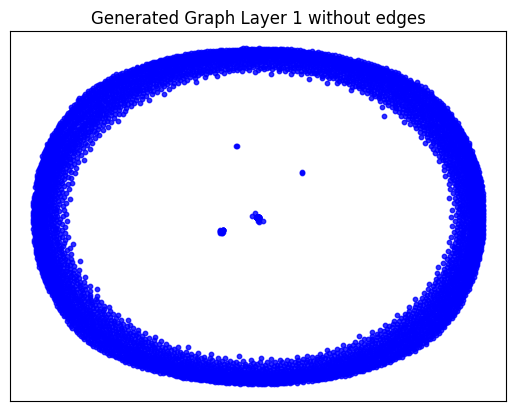

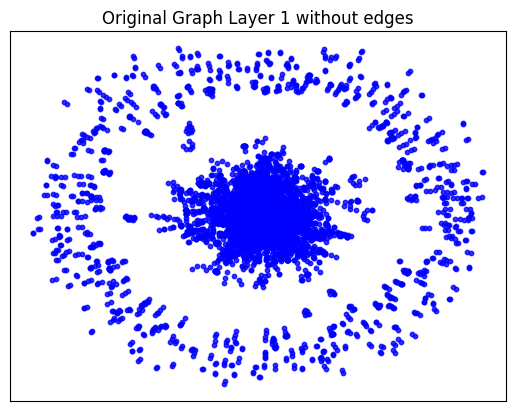

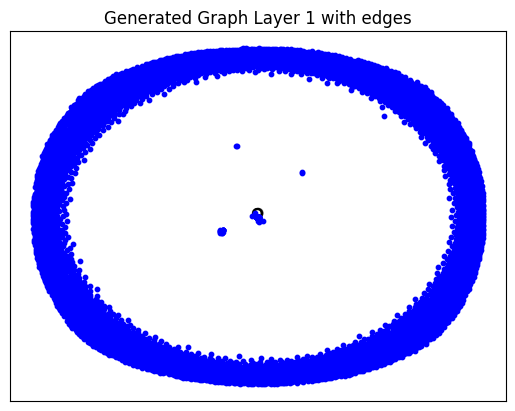

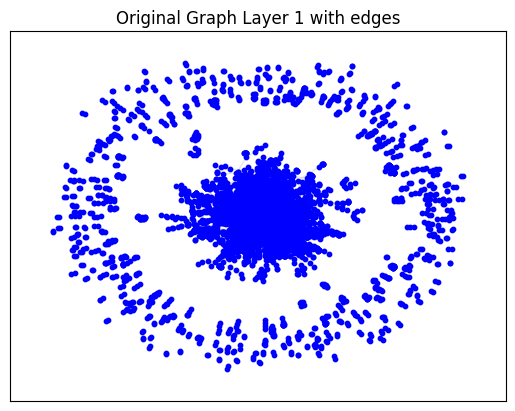

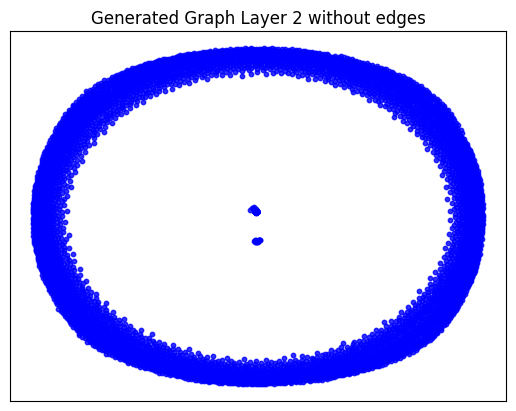

...

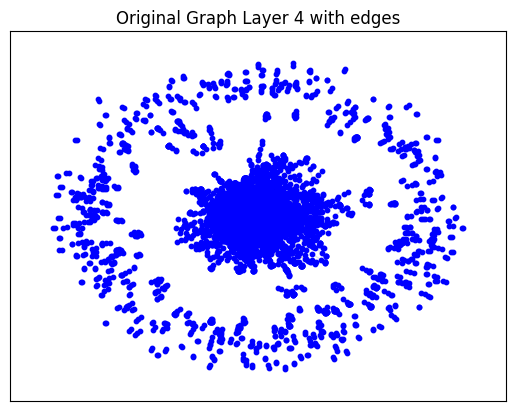

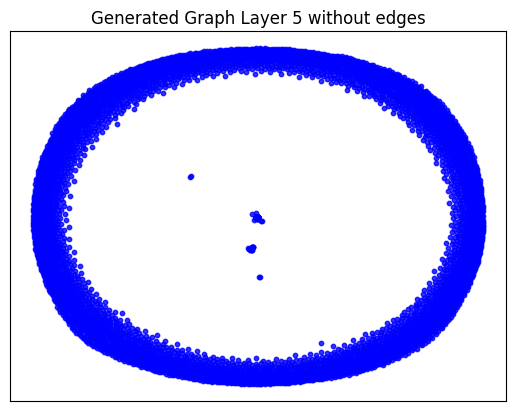

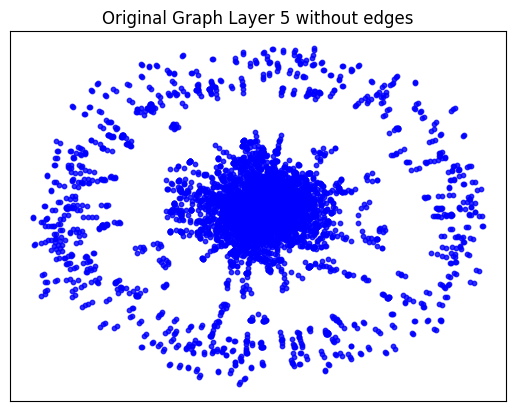

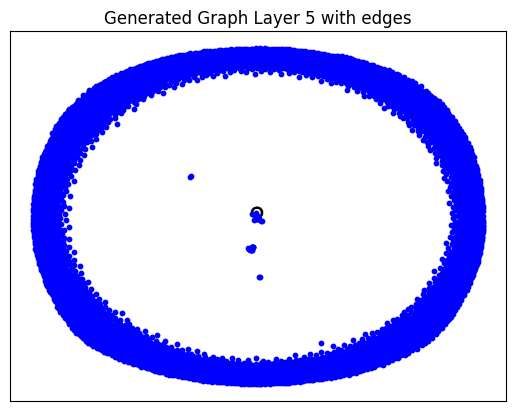

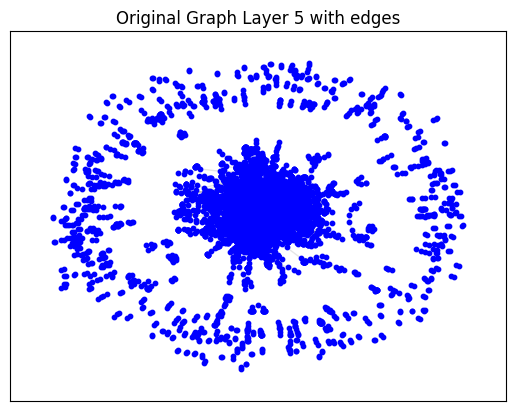

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_9.
Epoch 0 - Cost: 1.723023772239685, Accuracy: 0.4998739957809448
Epoch 1 - Cost: 1.718699336051941, Accuracy: 0.5002598166465759
Epoch 2 - Cost: 1.7595354318618774, Accuracy: 0.499802827835083
Epoch 3 - Cost: 1.7060906887054443, Accuracy: 0.5001330971717834
Epoch 4 - Cost: 1.6437338590621948, Accuracy: 0.4999759793281555
Epoch 5 - Cost: 1.6635122299194336, Accuracy: 0.49984607100486755
Epoch 6 - Cost: 1.628043532371521, Accuracy: 0.4999346137046814
Epoch 7 - Cost: 1.5562700033187866, Accuracy: 0.4992142617702484
Epoch 8 - Cost: 1.5374046564102173, Accuracy: 0.4994695782661438
Epoch 9 - Cost: 1.4978539943695068, Accuracy: 0.499535471200943
Epoch 10 - Cost: 1.4978200197219849, Accuracy: 0.4988766610622406
Epoch 11 - Cost: 1.438773512840271, Accuracy: 0.49883243441581726
Epoch 12 - Cost: 1.3754383325576782, Accuracy: 0.4975348711013794
Epoch 13 - Cost: 1.32

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.046526193618774414 seconds to compute degree_assortativity_coefficient ---
--- 0.5863075256347656 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 306, 'd_min': 0, 'd': 1.198955525606469, 'LCC': 1093, 'wedge_count': 195275.0, 'claw_count': 10354380.0, 'triangle_count': 8898, 'power_law_exp': 2.118257656611835, 'gini': 0.9441558394217255, 'rel_edge_distr_entropy': 0.6716900897424447, 'assortativity': -0.3182676270056154, 'clustering_coefficient': 0.0025780394383825974, 'n_components': 4840}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.04042664383709804
KL divergence between original network and the network generated by Random E-R: 6.049764493918557
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.7693707085729852
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.3477070108375626
KL divergence between original network and the network generated by Random E-R: 11.920789383979534
KL divergence between original network and the network generated by Random B-A: 1.8617478590186534
KL divergence between original network and the network generated by GAE: 40.41684309163762


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

10 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_10.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_10'
args.filename = 'pubmed_10_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_10'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 6.9465
Epoch: [ 2] time: 6.9971
Epoch: [ 3] time: 7.0449
Epoch: [ 4] time: 7.0921
Epoch: [ 5] time: 7.1410
Epoch: [ 6] time: 7.1901
Epoch: [ 7] time: 7.2396
Epoch: [ 8] time: 7.2891
Epoch: [ 9] time: 7.3390
Epoch: [10] time: 7.3881
Epoch: [11] time: 7.4360
Epoch: [12] time: 7.4882
Epoch: [13] time: 7.5356
Epoch: [14] time: 7.5874
Epoch: [15] time: 7.6356
Epoch: [16] time: 7.6834
Epoch: [17] time: 7.7346
Epoch: [18] time: 7.7843
Epoch: [19] time: 7.8346
Epoch: [20] time: 7.8848
Epoch: [21] time: 7.9340
Epoch: [22] time: 7.9815
Epoch: [23] time: 8.0317
Epoch: [24] time: 8.0817
Epoch: [25] time: 8.1288
Epoch: [26] time: 8.1759
Epoch: [27] time: 8.2243
Epoch: [28] time: 8.2720
Epoch: [29] time: 8.3214
Epoch: [30] time: 8.3716
Epoch: [31] time: 8.4202
Epoch: [32] time: 8.4719
Epoch: [33] time: 8.5209
Epoch: [34] time: 8.5697
Epoch: [35] time: 8.6163
Epoch: [36] time: 8.6658
Epoch: [37] time: 8.7146
Epoch: [38] time: 8.7640
Epoch: [39] time: 8.8128

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([5919, 5919])
Shape of feature_tensor before unpooling: torch.Size([5919, 64])
Shapes in down_outs: [torch.Size([5919, 64]), torch.Size([4735, 64]), torch.Size([2841, 64])]
Shapes in indices_list: [torch.Size([4735]), torch.Size([2841]), torch.Size([1136])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([5919, 64])
Shape of indices_list[0]: torch.Size([4735])
Shape of new_h before assignment: torch.Size([5919, 64])
Shape of h_subset: torch.Size([4735, 64])
Shape of idx: torch.Size([4735])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4735, 64])
Shape of indices_list[1]: torch.Size([2841])
Shape of new_h before assignment: torch.Size([5919, 64])
Shape of h_subset: torch.Size([2841, 64])
Shape of idx: torch.Size([2841])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2841, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.024919748306274414 seconds to compute statistics_degrees ---
--- 1.1633551120758057 seconds to compute statistics_LCC ---
--- 0.03505277633666992 seconds to compute statistics_wedge_count ---
--- 0.03551054000854492 seconds to compute statistics_claw_count ---
--- 0.21387648582458496 seconds to compute statistics_triangle_count ---
--- 0.026782989501953125 seconds to compute statistics_power_law_alpha ---
--- 0.026206016540527344 seconds to compute statistics_gini ---
--- 0.13226056098937988 seconds to compute statistics_edge_distribution_entropy ---
--- 0.053534507751464844 seconds to compute degree_assortativity_coefficient ---
--- 0.5817275047302246 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 68, 'd_min': 1, 'd': 2.314295370057452, 'LCC': 4870, 'wedge_count': 54376.0, 'claw_count': 471800.0, 'triangle_count': 207, 'power_law_exp': 3.3106266630472776, 'gini': 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.4870321750640869 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 101, 'd_min': 0, 'd': 2.314464346062859, 'LCC': 228, 'wedge_count': 425856.0, 'claw_count': 8949192.0, 'triangle_count': 205124, 'power_law_exp': 1.263205398625908, 'gini': 0.9654701844632725, 'rel_edge_distr_entropy': 0.6217598010144662, 'assortativity': 0.18027957772435727, 'clustering_coefficient': 0.06876285590922622, 'n_components': 5653}
Computing metrics for ER graph
--- 0.025021791458129883 seconds to compute statistics_degrees ---
--- 1.488572120666504 seconds to compute statistics_LCC ---
--- 0.026702880859375 seconds to compute statistics_wedge_count ---
--- 0.028206825256347656 seconds to compute statistics_claw_count ---
--- 0.33263397216796875 seconds to compute statistics_triangle_count ---
--- 0.02654719352722168 seconds to compute statistics_power_law_alpha ---
--- 0.026430368423461914 seconds to compute statistics_gini 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.07023191452026367 seconds to compute degree_assortativity_coefficient ---
--- 0.7397055625915527 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.628590740114904, 'LCC': 5854, 'wedge_count': 63280.0, 'claw_count': 96961.0, 'triangle_count': 17, 'power_law_exp': 1.7016023015293613, 'gini': 0.2576429811394352, 'rel_edge_distr_entropy': 0.9869510329512403, 'assortativity': 0.009996988530855217, 'clustering_coefficient': 0.0005259846742504718, 'n_components': 64}
Computing metrics for bara graph
--- 0.02454233169555664 seconds to compute statistics_degrees ---
--- 1.9182696342468262 seconds to compute statistics_LCC ---
--- 0.02672863006591797 seconds to compute statistics_wedge_count ---
--- 0.027371644973754883 seconds to compute statistics_claw_count ---
--- 30.098153352737427 seconds to compute statistics_triangle_count ---
--- 0.027365684509277344 seconds to compute statisti

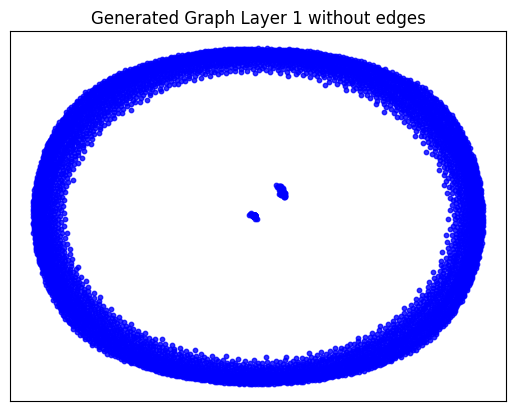

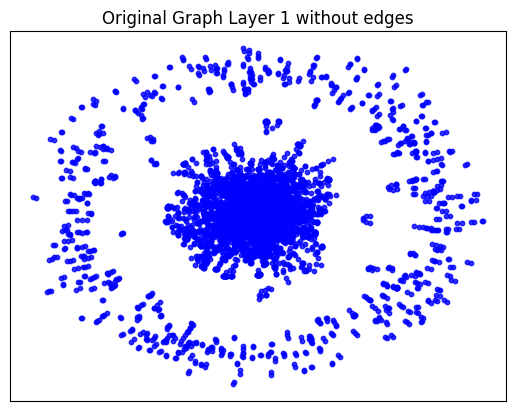

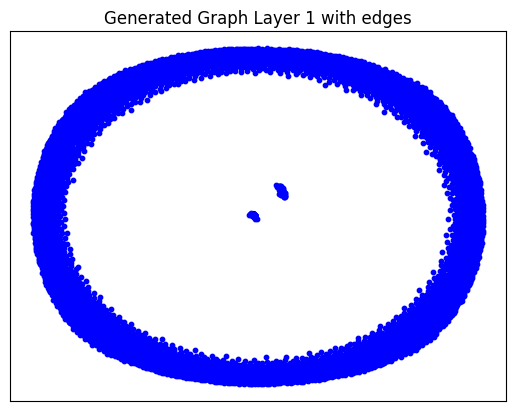

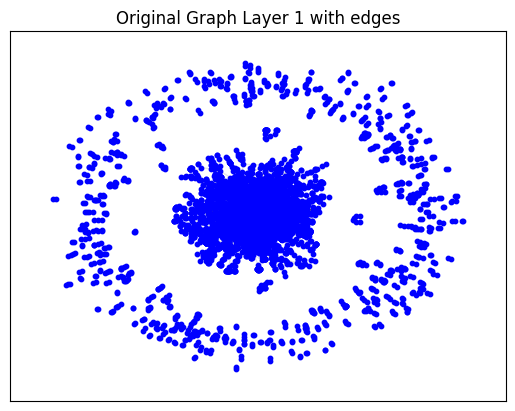

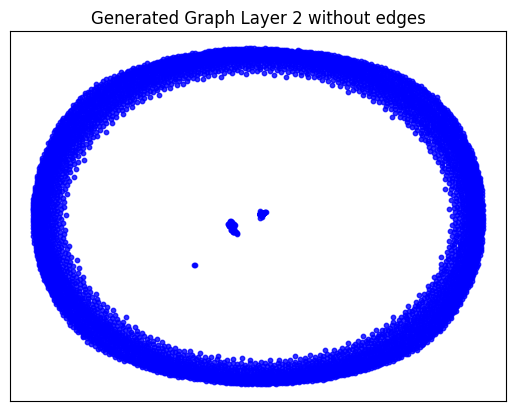

...

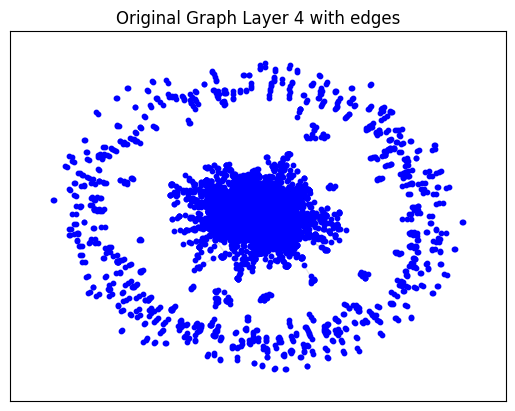

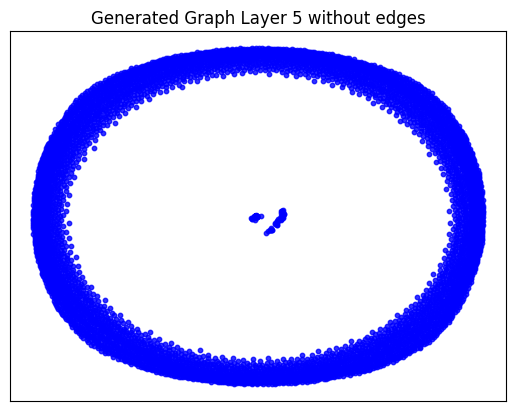

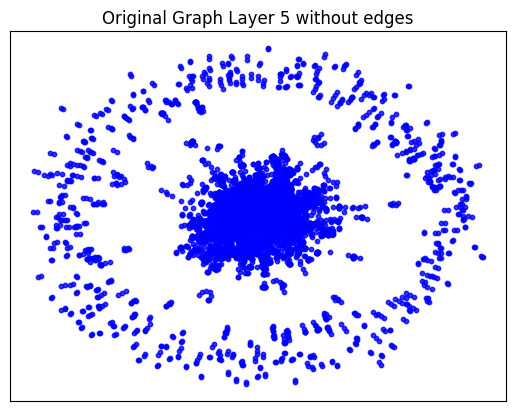

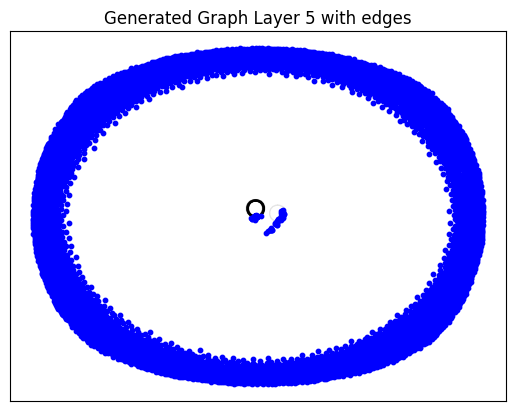

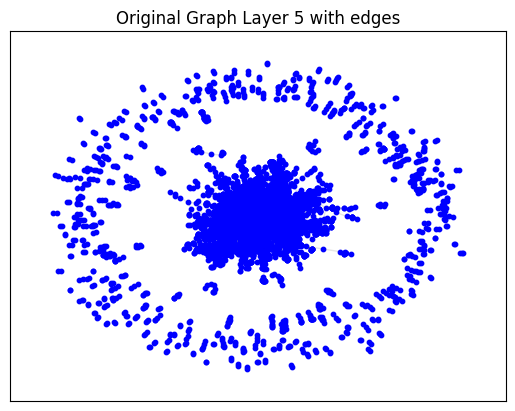

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_10.
Epoch 0 - Cost: 1.6968649625778198, Accuracy: 0.49990227818489075
Epoch 1 - Cost: 1.7445290088653564, Accuracy: 0.4996894598007202
Epoch 2 - Cost: 1.684178113937378, Accuracy: 0.4999546706676483
Epoch 3 - Cost: 1.6709630489349365, Accuracy: 0.4997541904449463
Epoch 4 - Cost: 1.6366485357284546, Accuracy: 0.4995579123497009
Epoch 5 - Cost: 1.6797946691513062, Accuracy: 0.4992230534553528
Epoch 6 - Cost: 1.62832510471344, Accuracy: 0.4995833933353424
Epoch 7 - Cost: 1.5541349649429321, Accuracy: 0.4990178942680359
Epoch 8 - Cost: 1.577501893043518, Accuracy: 0.49956658482551575
Epoch 9 - Cost: 1.5016820430755615, Accuracy: 0.4989580512046814
Epoch 10 - Cost: 1.5203356742858887, Accuracy: 0.4987747073173523
Epoch 11 - Cost: 1.4635149240493774, Accuracy: 0.498675137758255
Epoch 12 - Cost: 1.4489272832870483, Accuracy: 0.49900612235069275
Epoch 13 - Cost: 1

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.04651808738708496 seconds to compute degree_assortativity_coefficient ---
--- 0.582369327545166 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 188, 'd_min': 0, 'd': 1.2023990538942388, 'LCC': 888, 'wedge_count': 142293.0, 'claw_count': 4372796.0, 'triangle_count': 10319, 'power_law_exp': 1.9095645988212122, 'gini': 0.9500496409267132, 'rel_edge_distr_entropy': 0.6744308567615015, 'assortativity': -0.28242117801649647, 'clustering_coefficient': 0.007079452140003787, 'n_components': 5011}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.41018119035008516
KL divergence between original network and the network generated by Random E-R: 5.205308128576913
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 1.5472807763510992
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 2.4336133507860587
KL divergence between original network and the network generated by Random E-R: 13.651923877674964
KL divergence between original network and the network generated by Random B-A: 1.9273921147321753
KL divergence between original network and the network generated by GAE: 41.07854159252989


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

11 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_11.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_11'
args.filename = 'pubmed_11_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_11'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.2799
Epoch: [ 2] time: 8.3365
Epoch: [ 3] time: 8.3869
Epoch: [ 4] time: 8.4395
Epoch: [ 5] time: 8.4886
Epoch: [ 6] time: 8.5388
Epoch: [ 7] time: 8.5879
Epoch: [ 8] time: 8.6421
Epoch: [ 9] time: 8.6954
Epoch: [10] time: 8.7512
Epoch: [11] time: 8.8018
Epoch: [12] time: 8.8499
Epoch: [13] time: 8.9000
Epoch: [14] time: 8.9492
Epoch: [15] time: 9.0005
Epoch: [16] time: 9.0504
Epoch: [17] time: 9.1007
Epoch: [18] time: 9.1512
Epoch: [19] time: 9.1998
Epoch: [20] time: 9.2513
Epoch: [21] time: 9.3029
Epoch: [22] time: 9.3538
Epoch: [23] time: 9.4094
Epoch: [24] time: 9.4590
Epoch: [25] time: 9.5072
Epoch: [26] time: 9.5544
Epoch: [27] time: 9.6060
Epoch: [28] time: 9.6557
Epoch: [29] time: 9.7053
Epoch: [30] time: 9.7553
Epoch: [31] time: 9.8029
Epoch: [32] time: 9.8512
Epoch: [33] time: 9.9020
Epoch: [34] time: 9.9510
Epoch: [35] time: 10.0000
Epoch: [36] time: 10.0484
Epoch: [37] time: 10.0980
Epoch: [38] time: 10.1476
Epoch: [39] time: 10

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([6030, 6030])
Shape of feature_tensor before unpooling: torch.Size([6030, 64])
Shapes in down_outs: [torch.Size([6030, 64]), torch.Size([4824, 64]), torch.Size([2894, 64])]
Shapes in indices_list: [torch.Size([4824]), torch.Size([2894]), torch.Size([1157])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([6030, 64])
Shape of indices_list[0]: torch.Size([4824])
Shape of new_h before assignment: torch.Size([6030, 64])
Shape of h_subset: torch.Size([4824, 64])
Shape of idx: torch.Size([4824])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([4824, 64])
Shape of indices_list[1]: torch.Size([2894])
Shape of new_h before assignment: torch.Size([6030, 64])
Shape of h_subset: torch.Size([2894, 64])
Shape of idx: torch.Size([2894])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2894, 64])
Shape of

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.028232812881469727 seconds to compute statistics_degrees ---
--- 1.2217981815338135 seconds to compute statistics_LCC ---
--- 0.04039764404296875 seconds to compute statistics_wedge_count ---
--- 0.04133200645446777 seconds to compute statistics_claw_count ---
--- 0.2266077995300293 seconds to compute statistics_triangle_count ---
--- 0.029618024826049805 seconds to compute statistics_power_law_alpha ---
--- 0.02975916862487793 seconds to compute statistics_gini ---
--- 0.14395594596862793 seconds to compute statistics_edge_distribution_entropy ---
--- 0.05404162406921387 seconds to compute degree_assortativity_coefficient ---
--- 0.6102445125579834 seconds to compute connected_components ---
--- 7.152557373046875e-07 seconds to compute statistics_cluster_props ---
{'d_max': 69, 'd_min': 1, 'd': 2.27301376679383, 'LCC': 4751, 'wedge_count': 53338.0, 'claw_count': 474398.0, 'triangle_count': 211, 'power_law_exp': 3.3312306128720413, 'gini': 0.4

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5224940776824951 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 102, 'd_min': 0, 'd': 2.2731796317797315, 'LCC': 312, 'wedge_count': 391559.0, 'claw_count': 8091071.0, 'triangle_count': 165142, 'power_law_exp': 1.2853483448146756, 'gini': 0.9644049383349562, 'rel_edge_distr_entropy': 0.6364344134877461, 'assortativity': 0.5626064014714398, 'clustering_coefficient': 0.06123120165426802, 'n_components': 5718}
Computing metrics for ER graph
--- 0.02583622932434082 seconds to compute statistics_degrees ---
--- 1.5599746704101562 seconds to compute statistics_LCC ---
--- 0.028263092041015625 seconds to compute statistics_wedge_count ---
--- 0.029794692993164062 seconds to compute statistics_claw_count ---
--- 0.35190558433532715 seconds to compute statistics_triangle_count ---
--- 0.028531789779663086 seconds to compute statistics_power_law_alpha ---
--- 0.028334856033325195 seconds to compute statistics_

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.08234190940856934 seconds to compute degree_assortativity_coefficient ---
--- 0.7905828952789307 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 13.0, 'd_min': 0.0, 'd': 4.54602753358766, 'LCC': 5965, 'wedge_count': 62292.0, 'claw_count': 94470.0, 'triangle_count': 19, 'power_law_exp': 1.7123953287593712, 'gini': 0.26036485503952145, 'rel_edge_distr_entropy': 0.9867461528472952, 'assortativity': -0.014762428242763768, 'clustering_coefficient': 0.0006033661479834868, 'n_components': 62}
Computing metrics for bara graph
--- 0.026070117950439453 seconds to compute statistics_degrees ---
--- 2.0335021018981934 seconds to compute statistics_LCC ---
--- 0.028215408325195312 seconds to compute statistics_wedge_count ---
--- 0.029781341552734375 seconds to compute statistics_claw_count ---
--- 31.945939779281616 seconds to compute statistics_triangle_count ---
--- 0.02862691879272461 seconds to compute statist

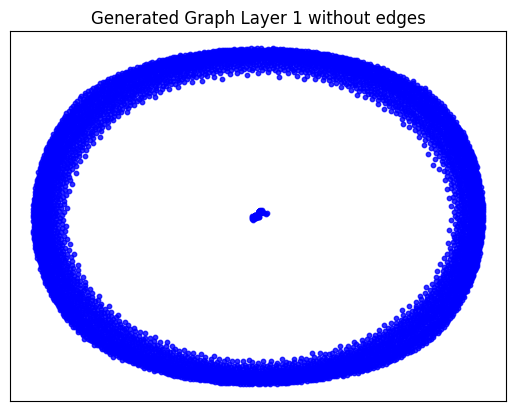

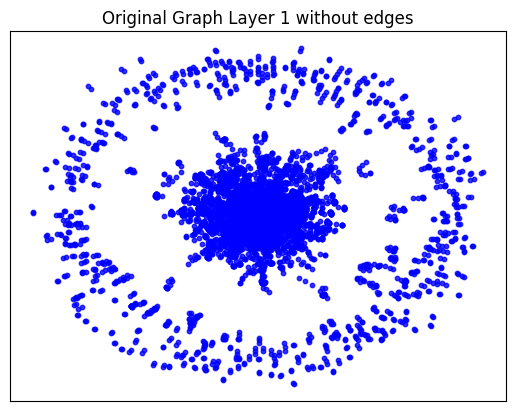

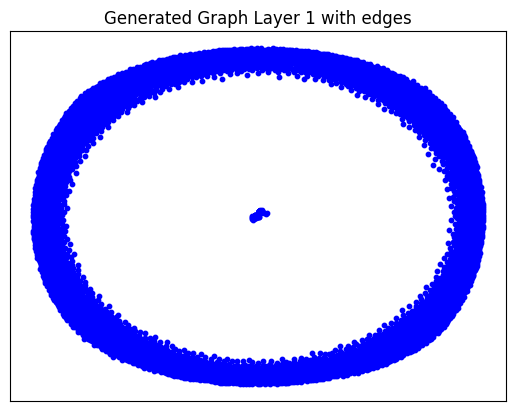

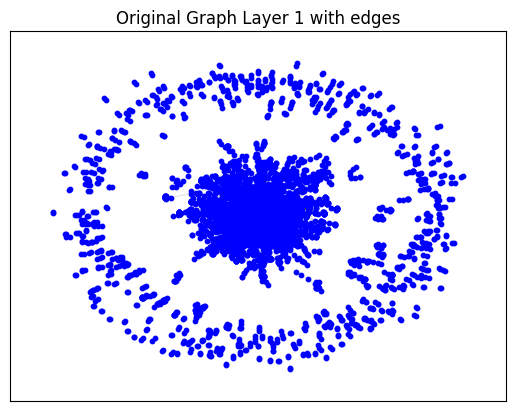

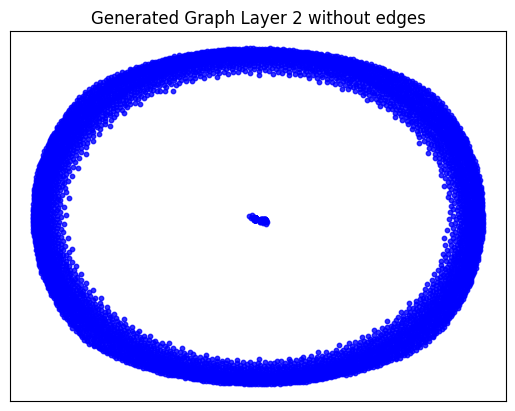

...

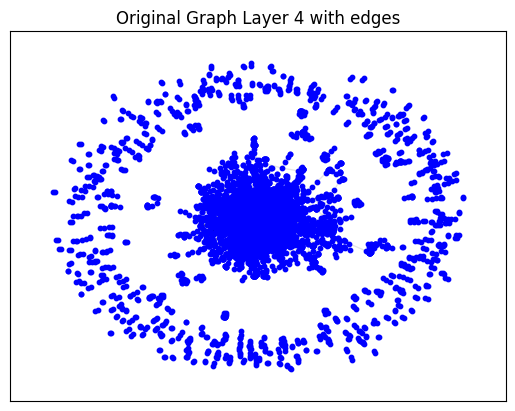

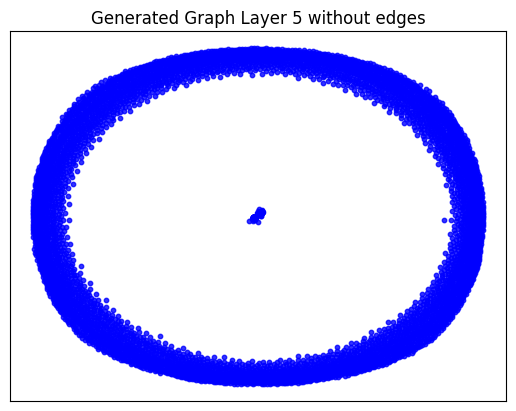

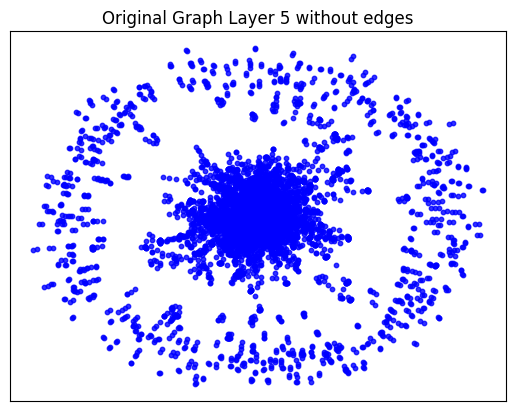

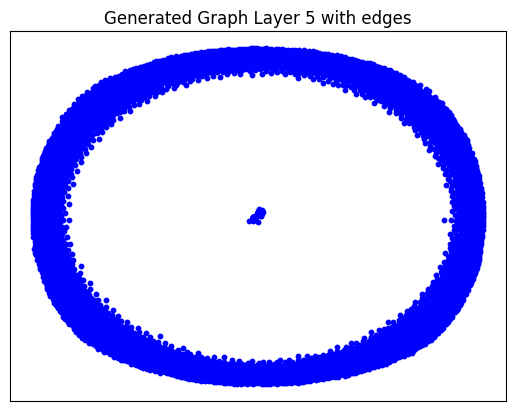

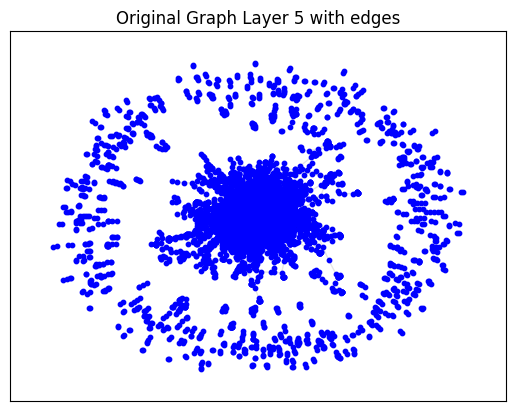

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_11.
Epoch 0 - Cost: 1.711551547050476, Accuracy: 0.4999389052391052
Epoch 1 - Cost: 1.8201136589050293, Accuracy: 0.5000744462013245
Epoch 2 - Cost: 1.7469900846481323, Accuracy: 0.49977606534957886
Epoch 3 - Cost: 1.6856657266616821, Accuracy: 0.5000525116920471
Epoch 4 - Cost: 1.7004518508911133, Accuracy: 0.49966704845428467
Epoch 5 - Cost: 1.6738237142562866, Accuracy: 0.4999302625656128
Epoch 6 - Cost: 1.672210693359375, Accuracy: 0.49931782484054565
Epoch 7 - Cost: 1.622877597808838, Accuracy: 0.4994264841079712
Epoch 8 - Cost: 1.5638580322265625, Accuracy: 0.4989803433418274
Epoch 9 - Cost: 1.5908880233764648, Accuracy: 0.49888429045677185
Epoch 10 - Cost: 1.540732979774475, Accuracy: 0.4985983967781067
Epoch 11 - Cost: 1.5295403003692627, Accuracy: 0.49879974126815796
Epoch 12 - Cost: 1.559722661972046, Accuracy: 0.4986519515514374
Epoch 13 - Cost:

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.047821760177612305 seconds to compute degree_assortativity_coefficient ---
--- 0.6032710075378418 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 253, 'd_min': 0, 'd': 1.1704809286898838, 'LCC': 746, 'wedge_count': 178184.0, 'claw_count': 8075491.0, 'triangle_count': 10707, 'power_law_exp': 1.7928456033560995, 'gini': 0.9551618501428816, 'rel_edge_distr_entropy': 0.6589916740153698, 'assortativity': -0.271604234481668, 'clustering_coefficient': 0.00397759096010385, 'n_components': 5231}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.3527149179717275
KL divergence between original network and the network generated by Random E-R: 5.342323052201309
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 3.528622651351354
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 13.247438994742831
KL divergence between original network and the network generated by Random E-R: 14.061288808353446
KL divergence between original network and the network generated by Random B-A: 1.820377260081008
KL divergence between original network and the network generated by GAE: 47.00387508400289


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()

12 batch:

In [ ]:
args = Args()
args.dataset_A = 'pubmed_12.mat'
args.checkpoint = '/content/Misc-Gan_Project/checkpoint_training_pubmed_12'
args.filename = 'pubmed_12_output_network'
args.output_dir = '/content/Misc-Gan_Project/output_dir_pubmed_12'

if args.demo:
    args.dataset_A = 'email-Eu-core.mat'
    args.layer = 5
    args.starting_layer = 0
    args.kernel_number = 32
    args.iter = 7
    args.checkpoint = './checkpoint_email'
    args.output_dir = './output_dir_email'
# --- initialization --- #
tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()
#tf.config.experimental.set_visible_devices([], 'GPU')

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
#if args.gpu:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if args.which_stage == 'training':
    if not os.path.isfile('/content/drive/MyDrive/Misc-Gan_Project/data/{}'.format(args.dataset_A)):
        print('Start calling AMG algorithm to create data set!')
        os.system("matlab -nodisplay -nosplash -nodesktop -r Parsedata")
        print('Finish generating graph data set!')

    data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
    # --- training process --- #
    for layer_idx in range(args.starting_layer, args.layer):
        model = cyclegan(data_A['l{}_1'.format(layer_idx + 1)], data_B['l{}_1'.format(layer_idx + 1)])
        model.train(layer_idx)
else:
    print('stage should be either training or testing.')

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


Starting training Layer 1
Epoch: [ 1] time: 8.1741
Epoch: [ 2] time: 8.2271
Epoch: [ 3] time: 8.2789
Epoch: [ 4] time: 8.3309
Epoch: [ 5] time: 8.3838
Epoch: [ 6] time: 8.4353
Epoch: [ 7] time: 8.4844
Epoch: [ 8] time: 8.5330
Epoch: [ 9] time: 8.5847
Epoch: [10] time: 8.6354
Epoch: [11] time: 8.6878
Epoch: [12] time: 8.7416
Epoch: [13] time: 8.7938
Epoch: [14] time: 8.8448
Epoch: [15] time: 8.8971
Epoch: [16] time: 8.9502
Epoch: [17] time: 9.0003
Epoch: [18] time: 9.0500
Epoch: [19] time: 9.1036
Epoch: [20] time: 9.1542
Epoch: [21] time: 9.2039
Epoch: [22] time: 9.2563
Epoch: [23] time: 9.3072
Epoch: [24] time: 9.3605
Epoch: [25] time: 9.4114
Epoch: [26] time: 9.4624
Epoch: [27] time: 9.5132
Epoch: [28] time: 9.5666
Epoch: [29] time: 9.6173
Epoch: [30] time: 9.6686
Epoch: [31] time: 9.7191
Epoch: [32] time: 9.7719
Epoch: [33] time: 9.8242
Epoch: [34] time: 9.8746
Epoch: [35] time: 9.9268
Epoch: [36] time: 9.9809
Epoch: [37] time: 10.0335
Epoch: [38] time: 10.0869
Epoch: [39] time: 10.1

Testing PubMed

<ipython-input-31-4c7f9aa95df3>:22: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  clusters_info = np.array(clusters_info)
<ipython-input-31-4c7f9aa95df3>:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  indices[j] = np.array(index)


 [*] Reading checkpoint...
 [*] Load SUCCESS
Before G-Unpool at Layer 1:
down_outs_list: [3, 3, 3, 3, 3]
indices_list_list: [3, 3, 3, 3, 3]
Shape of adj_pooled_tensor: torch.Size([4869, 4869])
Shape of feature_tensor before unpooling: torch.Size([4869, 64])
Shapes in down_outs: [torch.Size([4869, 64]), torch.Size([3895, 64]), torch.Size([2337, 64])]
Shapes in indices_list: [torch.Size([3895]), torch.Size([2337]), torch.Size([934])]
Unpooling at layer 0
Shape of down_outs[0]: torch.Size([4869, 64])
Shape of indices_list[0]: torch.Size([3895])
Shape of new_h before assignment: torch.Size([4869, 64])
Shape of h_subset: torch.Size([3895, 64])
Shape of idx: torch.Size([3895])
Unpooling at layer 1
Shape of down_outs[1]: torch.Size([3895, 64])
Shape of indices_list[1]: torch.Size([2337])
Shape of new_h before assignment: torch.Size([4869, 64])
Shape of h_subset: torch.Size([2337, 64])
Shape of idx: torch.Size([2337])
Unpooling at layer 2
Shape of down_outs[2]: torch.Size([2337, 64])
Shape of 

<ipython-input-53-465e0818d893>:14: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  A = np.array(A)


Computing metrics for original graph
--- 0.018253564834594727 seconds to compute statistics_degrees ---
--- 0.8031525611877441 seconds to compute statistics_LCC ---
--- 0.026309967041015625 seconds to compute statistics_wedge_count ---
--- 0.027391910552978516 seconds to compute statistics_claw_count ---
--- 0.15171027183532715 seconds to compute statistics_triangle_count ---
--- 0.018597841262817383 seconds to compute statistics_power_law_alpha ---
--- 0.01909351348876953 seconds to compute statistics_gini ---
--- 0.09066128730773926 seconds to compute statistics_edge_distribution_entropy ---
--- 0.04405665397644043 seconds to compute degree_assortativity_coefficient ---
--- 0.39865803718566895 seconds to compute connected_components ---
--- 2.384185791015625e-07 seconds to compute statistics_cluster_props ---
{'d_max': 73, 'd_min': 1, 'd': 2.16557107641742, 'LCC': 3626, 'wedge_count': 42172.0, 'claw_count': 358538.0, 'triangle_count': 135, 'power_law_exp': 3.696549019736893, 'gini': 

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.32532739639282227 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 152, 'd_min': 0, 'd': 2.1657764995891537, 'LCC': 192, 'wedge_count': 332402.0, 'claw_count': 7707450.0, 'triangle_count': 162701, 'power_law_exp': 1.2591407732105506, 'gini': 0.9690536217022889, 'rel_edge_distr_entropy': 0.6083444680912874, 'assortativity': -0.04437726856021189, 'clustering_coefficient': 0.06332872740011287, 'n_components': 4677}
Computing metrics for ER graph
--- 0.01715540885925293 seconds to compute statistics_degrees ---
--- 1.0610499382019043 seconds to compute statistics_LCC ---
--- 0.01846003532409668 seconds to compute statistics_wedge_count ---
--- 0.019192218780517578 seconds to compute statistics_claw_count ---
--- 0.23845148086547852 seconds to compute statistics_triangle_count ---
--- 0.019330978393554688 seconds to compute statistics_power_law_alpha ---
--- 0.018779277801513672 seconds to compute statistics

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.5165152549743652 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 14.0, 'd_min': 0.0, 'd': 4.33114215283484, 'LCC': 4805, 'wedge_count': 45788.0, 'claw_count': 66701.0, 'triangle_count': 10, 'power_law_exp': 1.7401684984329515, 'gini': 0.2678845014355071, 'rel_edge_distr_entropy': 0.9855440929363576, 'assortativity': -0.012380182212896287, 'clustering_coefficient': 0.00044976836928981576, 'n_components': 61}
Computing metrics for bara graph
--- 0.017217636108398438 seconds to compute statistics_degrees ---
--- 1.3537991046905518 seconds to compute statistics_LCC ---
--- 0.01884293556213379 seconds to compute statistics_wedge_count ---
--- 0.01936817169189453 seconds to compute statistics_claw_count ---
--- 25.55760931968689 seconds to compute statistics_triangle_count ---
--- 0.019298315048217773 seconds to compute statistics_power_law_alpha ---
--- 0.018677473068237305 seconds to compute statistics_gin

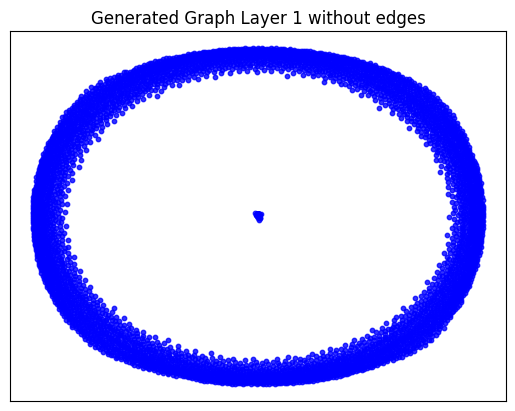

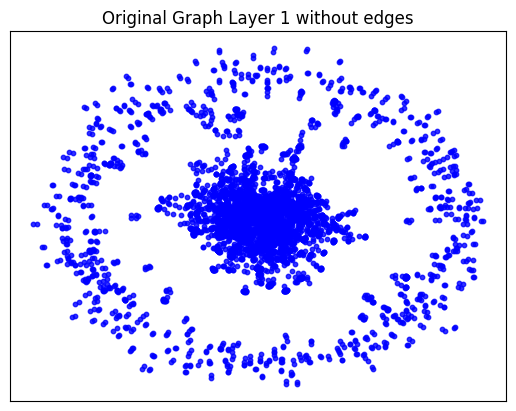

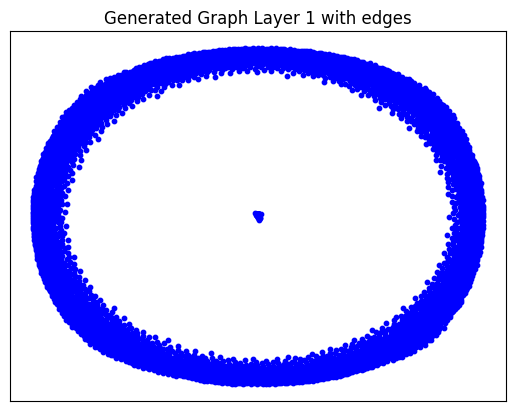

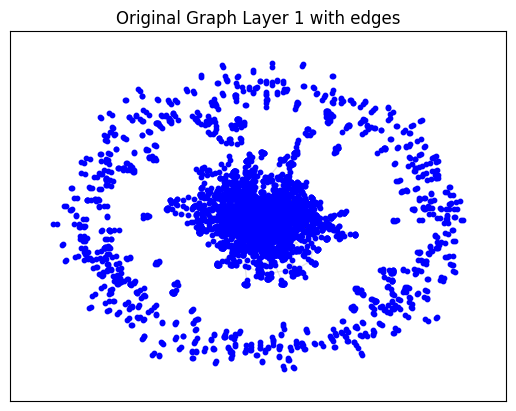

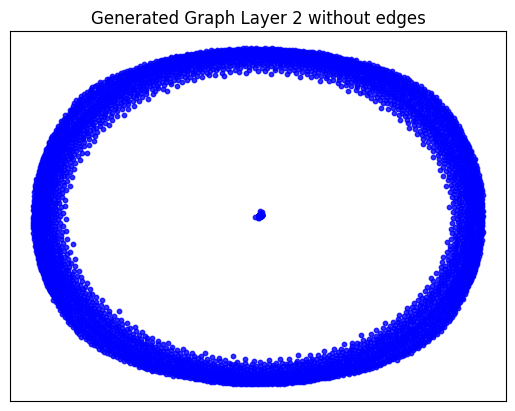

...

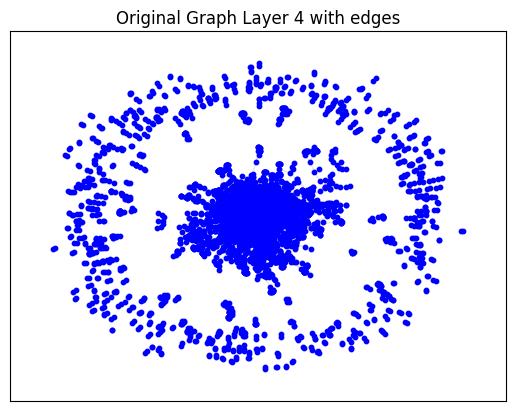

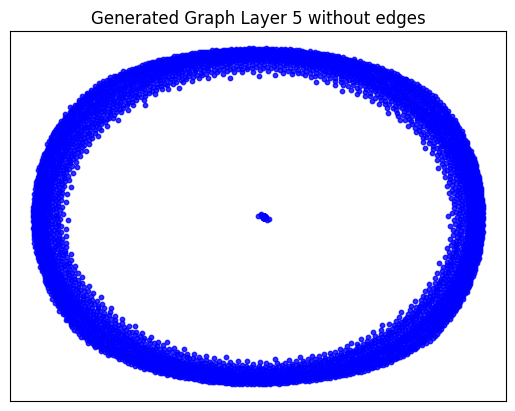

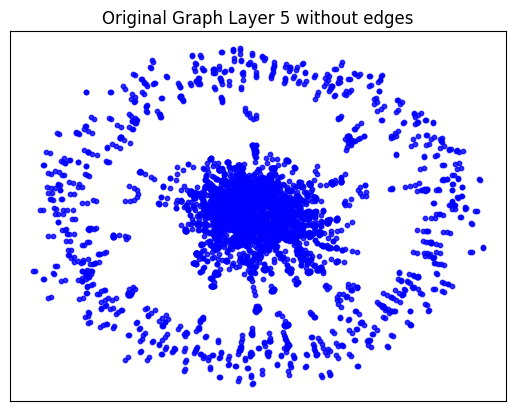

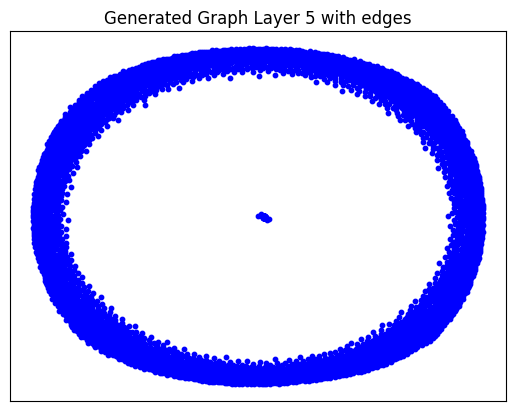

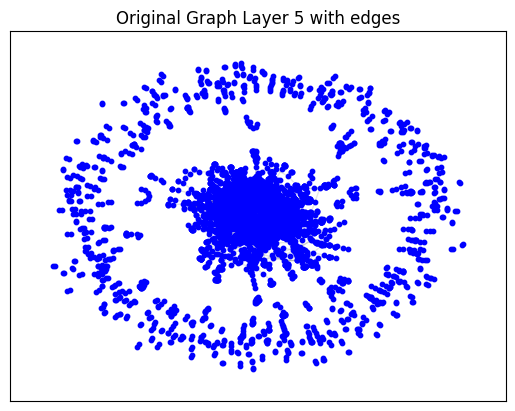

Original graph and synthetic graph generated by Music-GAN have been saved at directory: /content/Misc-Gan_Project/output_dir_pubmed_12.
Epoch 0 - Cost: 1.5042319297790527, Accuracy: 0.4996124804019928
Epoch 1 - Cost: 1.816625714302063, Accuracy: 0.4999367594718933
Epoch 2 - Cost: 1.6719939708709717, Accuracy: 0.49960681796073914
Epoch 3 - Cost: 1.7329012155532837, Accuracy: 0.4999333918094635
Epoch 4 - Cost: 1.5705633163452148, Accuracy: 0.5000057220458984
Epoch 5 - Cost: 1.5419464111328125, Accuracy: 0.5000683665275574
Epoch 6 - Cost: 1.6106623411178589, Accuracy: 0.49957484006881714
Epoch 7 - Cost: 1.6163794994354248, Accuracy: 0.4995136857032776
Epoch 8 - Cost: 1.5716211795806885, Accuracy: 0.49975159764289856
Epoch 9 - Cost: 1.487719178199768, Accuracy: 0.4990246295928955
Epoch 10 - Cost: 1.5254100561141968, Accuracy: 0.4989710748195648
Epoch 11 - Cost: 1.4891899824142456, Accuracy: 0.4992140233516693
Epoch 12 - Cost: 1.4380756616592407, Accuracy: 0.49897950887680054
Epoch 13 - Cos

Values less than or equal to 0 in data. Throwing out 0 or negative values


--- 0.39845943450927734 seconds to compute connected_components ---
--- 4.76837158203125e-07 seconds to compute statistics_cluster_props ---
{'d_max': 108, 'd_min': 0, 'd': 1.1084411583487368, 'LCC': 255, 'wedge_count': 106488.0, 'claw_count': 2010237.0, 'triangle_count': 15791, 'power_law_exp': 1.3953909601327832, 'gini': 0.9722360455762356, 'rel_edge_distr_entropy': 0.6080304578232267, 'assortativity': 0.019017496709571022, 'clustering_coefficient': 0.023565878053184774, 'n_components': 4612}
Evaluation Results:
Start computing graph degree


<ipython-input-51-14c2ed8bb7eb>:49: RuntimeWarning: overflow encountered in exp
  e_x = np.exp((x-max)/mean)
<ipython-input-51-14c2ed8bb7eb>:50: RuntimeWarning: invalid value encountered in divide
  return e_x / e_x.sum()
<ipython-input-51-14c2ed8bb7eb>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  p = np.asarray(p, dtype=np.float)
<ipython-input-51-14c2ed8bb7eb>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and

KL divergence between original network and the network generated by Music_GAN: 0.10040152170611309
KL divergence between original network and the network generated by Random E-R: 5.255264555510931
KL divergence between original network and the network generated by Random B-A: nan
KL divergence between original network and the network generated by GAE: 0.3259675328833369
Start computing graph coefficient
KL divergence between original network and the network generated by Music_GAN: 3.3322042340553133
KL divergence between original network and the network generated by Random E-R: 3.425061588036942
KL divergence between original network and the network generated by Random B-A: 1.836709261103089
KL divergence between original network and the network generated by GAE: 0.6523957739276033


In [ ]:
args.which_stage = "testing"

tfconfig = tf.compat.v1.ConfigProto(allow_soft_placement=True)
tfconfig.gpu_options.allow_growth = True
tf.compat.v1.reset_default_graph()
tf.compat.v1.disable_eager_execution()

# use this to disable the gpu usage of tensorflow
#tfconfig.gpu_options.allow_growth = False
#os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
if args.gpu:
    os.environ["CUDA_VISIBLE_DEVICES"] = "0"

data_A, data_B, indices, P, A, edges, R = preproc_data(tf.compat.v1.Session(config=tfconfig), net, gnet_args)
# --- generating synthetic network --- #
generate_network(data_A, data_B, indices, P, A)
# --- evaluation --- #
save_graph(R, edges)
print('Original graph and synthetic graph generated by Music-GAN have been saved at directory: {}.'.format(
    args.output_dir))
gae(args.dataset_A, args.output_dir)
print('Evaluation Results:')
evaluation()